In [1]:
from shapely.geometry import Point
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import folium
from folium.plugins import MarkerCluster
from folium.plugins import FastMarkerCluster
pd.set_option('display.max_columns', None)

In [2]:
allcounties = gpd.read_file('../data/uscounties/cb_2021_us_county_5m.shp')
allcounties

,STATEFP,COUNTYFP,COUNTYNS,AFFGEOID,GEOID,NAME,NAMELSAD,STUSPS,STATE_NAME,LSAD,ALAND,AWATER,geometry
0,01,059,00161555,0500000US01059,01059,Franklin,Franklin County,AL,Alabama,06,1641845708,32639621,"POLYGON ((-88.16591 34.38093, -88.16563 34.383..."
1,06,057,01682927,0500000US06057,06057,Nevada,Nevada County,CA,California,06,2480587301,41531993,"POLYGON ((-121.27953 39.23054, -121.25918 39.2..."
2,26,031,01622958,0500000US26031,26031,Cheboygan,Cheboygan County,MI,Michigan,06,1852564001,440607445,"POLYGON ((-84.73269 45.28938, -84.73239 45.787..."
3,29,119,00758518,0500000US29119,29119,McDonald,McDonald County,MO,Missouri,06,1397155452,520251,"POLYGON ((-94.61831 36.76656, -94.06890 36.747..."
4,31,157,00835900,0500000US31157,31157,Scotts Bluff,Scotts Bluff County,NE,Nebraska,06,1915576079,15402683,"POLYGON ((-104.05293 41.90614, -104.05299 41.9..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...
3229,13,301,00347777,0500000US13301,13301,Warren,Warren County,GA,Georgia,06,736483608,6034478,"POLYGON ((-82.86661 33.46660, -82.82314 33.504..."
3230,06,023,01681908,0500000US06023,06023,Humboldt,Humboldt County,CA,California,06,9241565229,1253726036,"POLYGON ((-124.40860 40.44320, -124.39664 40.4..."
3231,34,023,00882230,0500000US34023,34023,Middlesex,Middlesex County,NJ,New Jersey,06,800946845,35291196,"POLYGON ((-74.63060 40.33960, -74.62024 40.373..."
3232,13,311,00326781,0500000US13311,13311,White,White County,GA,Georgia,06,623524633,3917258,"POLYGON ((-83.87121 34.66490, -83.87251 34.683..."


In [3]:
type(allcounties)

geopandas.geodataframe.GeoDataFrame

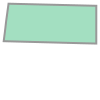

In [4]:
allcounties.loc[0, 'geometry']

In [5]:
print(allcounties.loc[0, 'geometry'])

POLYGON ((-88.16591 34.380926, -88.165634 34.383102, -88.15629199999999 34.463214, -88.139988 34.581703, -87.529667 34.567081, -87.52972200000001 34.304598, -87.634725 34.306997, -88.173632 34.321054, -88.16591 34.380926))


In [6]:
contig_usa = allcounties.loc[(allcounties['STUSPS'] != 'AK') & (allcounties['STUSPS'] != 'HI')]
contig_usa

,STATEFP,COUNTYFP,COUNTYNS,AFFGEOID,GEOID,NAME,NAMELSAD,STUSPS,STATE_NAME,LSAD,ALAND,AWATER,geometry
0,01,059,00161555,0500000US01059,01059,Franklin,Franklin County,AL,Alabama,06,1641845708,32639621,"POLYGON ((-88.16591 34.38093, -88.16563 34.383..."
1,06,057,01682927,0500000US06057,06057,Nevada,Nevada County,CA,California,06,2480587301,41531993,"POLYGON ((-121.27953 39.23054, -121.25918 39.2..."
2,26,031,01622958,0500000US26031,26031,Cheboygan,Cheboygan County,MI,Michigan,06,1852564001,440607445,"POLYGON ((-84.73269 45.28938, -84.73239 45.787..."
3,29,119,00758518,0500000US29119,29119,McDonald,McDonald County,MO,Missouri,06,1397155452,520251,"POLYGON ((-94.61831 36.76656, -94.06890 36.747..."
4,31,157,00835900,0500000US31157,31157,Scotts Bluff,Scotts Bluff County,NE,Nebraska,06,1915576079,15402683,"POLYGON ((-104.05293 41.90614, -104.05299 41.9..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...
3229,13,301,00347777,0500000US13301,13301,Warren,Warren County,GA,Georgia,06,736483608,6034478,"POLYGON ((-82.86661 33.46660, -82.82314 33.504..."
3230,06,023,01681908,0500000US06023,06023,Humboldt,Humboldt County,CA,California,06,9241565229,1253726036,"POLYGON ((-124.40860 40.44320, -124.39664 40.4..."
3231,34,023,00882230,0500000US34023,34023,Middlesex,Middlesex County,NJ,New Jersey,06,800946845,35291196,"POLYGON ((-74.63060 40.33960, -74.62024 40.373..."
3232,13,311,00326781,0500000US13311,13311,White,White County,GA,Georgia,06,623524633,3917258,"POLYGON ((-83.87121 34.66490, -83.87251 34.683..."


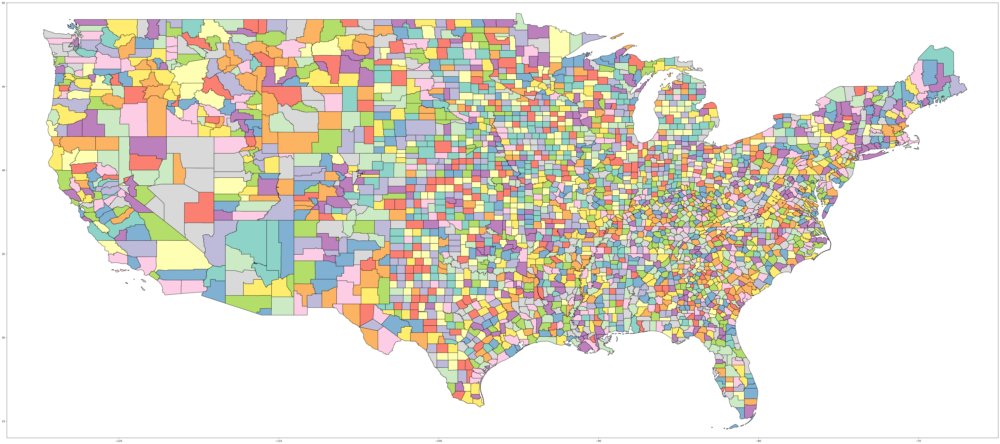

In [7]:
contig_usa.plot(figsize=(70,70), edgecolor='black', cmap = 'Set3')
plt.ylim(24, 50)
plt.xlim(-127, -65);

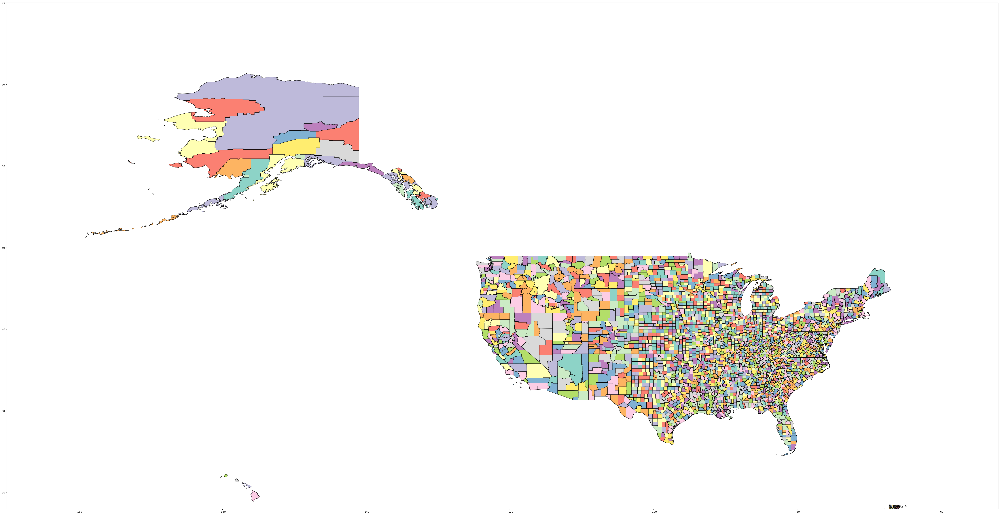

In [8]:
allcounties.plot(figsize=(70,70), edgecolor='black', cmap = 'Set3')
plt.ylim(18, 80)
plt.xlim(-190, -52);

In [9]:
TN = allcounties.loc[(allcounties['STUSPS'] == 'TN')]
TN

,STATEFP,COUNTYFP,COUNTYNS,AFFGEOID,GEOID,NAME,NAMELSAD,STUSPS,STATE_NAME,LSAD,ALAND,AWATER,geometry
33,47,109,01639774,0500000US47109,47109,McNairy,McNairy County,TN,Tennessee,06,1457753351,1994997,"POLYGON ((-88.78673 35.12508, -88.78177 35.247..."
71,47,169,01648581,0500000US47169,47169,Trousdale,Trousdale County,TN,Tennessee,06,296143586,5960709,"POLYGON ((-86.28326 36.34750, -86.27249 36.358..."
125,47,075,01639753,0500000US47075,47075,Haywood,Haywood County,TN,Tennessee,06,1380741528,2472509,"POLYGON ((-89.48270 35.59395, -89.46999 35.595..."
150,47,101,01639765,0500000US47101,47101,Lewis,Lewis County,TN,Tennessee,06,730614739,1024940,"POLYGON ((-87.71101 35.50529, -87.69065 35.505..."
221,47,069,01639750,0500000US47069,47069,Hardeman,Hardeman County,TN,Tennessee,06,1729509842,6768751,"POLYGON ((-89.18394 35.39713, -89.18255 35.432..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...
3095,47,057,01648575,0500000US47057,47057,Grainger,Grainger County,TN,Tennessee,06,726715759,56600343,"POLYGON ((-83.73270 36.16458, -83.71470 36.173..."
3096,47,089,01639759,0500000US47089,47089,Jefferson,Jefferson County,TN,Tennessee,06,712437477,101637984,"POLYGON ((-83.70925 36.09323, -83.69129 36.094..."
3098,47,187,01639801,0500000US47187,47187,Williamson,Williamson County,TN,Tennessee,06,1509607196,3017704,"POLYGON ((-87.20143 35.94058, -87.20424 35.959..."
3123,47,103,01639766,0500000US47103,47103,Lincoln,Lincoln County,TN,Tennessee,06,1477179214,971039,"POLYGON ((-86.82830 35.26368, -86.74690 35.252..."


In [10]:
TN.shape

(95, 13)

In [11]:
from matplotlib import pyplot as plt
from shapely.geometry.polygon import Polygon
from descartes import PolygonPatch

In [12]:
TN.rename(columns = {'NAME':'County', 'STATE_NAME':'State'}, inplace = True)
TN

C:\Users\HP\AppData\Local\Temp\ipykernel_20816\3844642348.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  TN.rename(columns = {'NAME':'County', 'STATE_NAME':'State'}, inplace = True)


,STATEFP,COUNTYFP,COUNTYNS,AFFGEOID,GEOID,County,NAMELSAD,STUSPS,State,LSAD,ALAND,AWATER,geometry
33,47,109,01639774,0500000US47109,47109,McNairy,McNairy County,TN,Tennessee,06,1457753351,1994997,"POLYGON ((-88.78673 35.12508, -88.78177 35.247..."
71,47,169,01648581,0500000US47169,47169,Trousdale,Trousdale County,TN,Tennessee,06,296143586,5960709,"POLYGON ((-86.28326 36.34750, -86.27249 36.358..."
125,47,075,01639753,0500000US47075,47075,Haywood,Haywood County,TN,Tennessee,06,1380741528,2472509,"POLYGON ((-89.48270 35.59395, -89.46999 35.595..."
150,47,101,01639765,0500000US47101,47101,Lewis,Lewis County,TN,Tennessee,06,730614739,1024940,"POLYGON ((-87.71101 35.50529, -87.69065 35.505..."
221,47,069,01639750,0500000US47069,47069,Hardeman,Hardeman County,TN,Tennessee,06,1729509842,6768751,"POLYGON ((-89.18394 35.39713, -89.18255 35.432..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...
3095,47,057,01648575,0500000US47057,47057,Grainger,Grainger County,TN,Tennessee,06,726715759,56600343,"POLYGON ((-83.73270 36.16458, -83.71470 36.173..."
3096,47,089,01639759,0500000US47089,47089,Jefferson,Jefferson County,TN,Tennessee,06,712437477,101637984,"POLYGON ((-83.70925 36.09323, -83.69129 36.094..."
3098,47,187,01639801,0500000US47187,47187,Williamson,Williamson County,TN,Tennessee,06,1509607196,3017704,"POLYGON ((-87.20143 35.94058, -87.20424 35.959..."
3123,47,103,01639766,0500000US47103,47103,Lincoln,Lincoln County,TN,Tennessee,06,1477179214,971039,"POLYGON ((-86.82830 35.26368, -86.74690 35.252..."


In [13]:
contiguous = pd.read_csv('../data/capstonefull.csv')
print(contiguous.shape)
contiguous.corr()

(3065, 21)


,Unnamed: 0,STCOU,Quality of Life,Life Expectancy,Median Household Income,Percent Some College,Percent Access to Exercise,Population,Square Miles,Density,QOL_rank,LE_rank,MHI_rank,PSC_rank,PAE_rank,SQM_rank,POP_rank,DEN_rank
Unnamed: 0,1.000000,0.078723,0.040618,0.187054,-0.006301,0.069295,0.068083,0.083542,0.599950,-0.118727,0.042216,-0.199044,-0.035379,-0.078120,-0.073556,-0.998615,0.007418,0.408615
STCOU,0.078723,1.000000,-0.004503,0.045589,0.053014,0.000473,-0.027296,-0.057473,0.001347,0.006731,-0.004811,-0.068517,-0.069330,0.006547,0.024301,-0.081106,0.018905,0.044459
Quality of Life,0.040618,-0.004503,1.000000,-0.514966,-0.614261,-0.509052,-0.275212,-0.126484,0.060537,-0.039872,0.967627,0.506263,0.605973,0.503715,0.280458,-0.039613,0.277759,0.293012
Life Expectancy,0.187054,0.045589,-0.514966,1.000000,0.652448,0.546471,0.333262,0.182078,0.112252,0.113224,-0.494775,-0.946270,-0.666483,-0.555848,-0.340486,-0.188534,-0.147826,-0.065221
Median Household Income,-0.006301,0.053014,-0.614261,0.652448,1.000000,0.574727,0.445933,0.293420,0.001136,0.174284,-0.589761,-0.659800,-0.913329,-0.574278,-0.449290,0.004392,-0.414800,-0.388997
Percent Some College,0.069295,0.000473,-0.509052,0.546471,0.574727,1.000000,0.382577,0.203735,0.021256,0.135433,-0.501742,-0.574652,-0.574065,-0.979338,-0.394552,-0.070303,-0.260721,-0.217596
Percent Access to Exercise,0.068083,-0.027296,-0.275212,0.333262,0.445933,0.382577,1.000000,0.344567,0.062474,0.203368,-0.262913,-0.337654,-0.424971,-0.387453,-0.984684,-0.067777,-0.542466,-0.465037
Population,0.083542,-0.057473,-0.126484,0.182078,0.293420,0.203735,0.344567,1.000000,0.129787,0.362676,-0.130041,-0.195260,-0.249173,-0.210206,-0.340467,-0.084108,-0.412479,-0.385260
Square Miles,0.599950,0.001347,0.060537,0.112252,0.001136,0.021256,0.062474,0.129787,1.000000,-0.058734,0.058161,-0.127718,-0.024773,-0.025070,-0.069159,-0.600232,-0.017270,0.302502
Density,-0.118727,0.006731,-0.039872,0.113224,0.174284,0.135433,0.203368,0.362676,-0.058734,1.000000,-0.049495,-0.110672,-0.133603,-0.128404,-0.193584,0.118554,-0.216184,-0.226896


In [14]:
TNfull = pd.merge(left = TN, right = contiguous, how='inner',
                    on = ('County', 'State'))
TNfull

,STATEFP,COUNTYFP,COUNTYNS,AFFGEOID,GEOID,County,NAMELSAD,STUSPS,State,LSAD,ALAND,AWATER,geometry,Unnamed: 0,StAbbr,STCOU,Quality of Life,Life Expectancy,Median Household Income,Percent Some College,Percent Access to Exercise,Population,Square Miles,Density,QOL_rank,LE_rank,MHI_rank,PSC_rank,PAE_rank,SQM_rank,POP_rank,DEN_rank
0,47,109,01639774,0500000US47109,47109,McNairy,McNairy County,TN,Tennessee,06,1457753351,1994997,"POLYGON ((-88.78673 35.12508, -88.78177 35.247...",1134,TN,47109,0.025129,72.222655,44341,50.538738,23.535954,25696,560.84,45.816989,1651.0,2836.0,2606.0,2300.0,2671.0,1938.0,1539.0,1449.0
1,47,169,01648581,0500000US47169,47169,Trousdale,Trousdale County,TN,Tennessee,06,296143586,5960709,"POLYGON ((-86.28326 36.34750, -86.27249 36.358...",26,TN,47169,-0.371258,74.666901,54970,44.487179,53.329098,11455,116.64,98.208162,488.0,2331.0,1544.5,2708.0,1621.0,3049.0,2274.0,815.0
2,47,075,01639753,0500000US47075,47075,Haywood,Haywood County,TN,Tennessee,06,1380741528,2472509,"POLYGON ((-89.48270 35.59395, -89.46999 35.595...",1046,TN,47075,0.854725,72.328220,43742,43.897004,42.646511,17002,534.15,31.830010,2951.0,2822.0,2641.0,2740.0,2102.0,2026.0,1932.0,1773.0
3,47,101,01639765,0500000US47101,47101,Lewis,Lewis County,TN,Tennessee,06,730614739,1024940,"POLYGON ((-87.71101 35.50529, -87.69065 35.505...",225,TN,47101,0.182290,73.227304,48288,40.414138,13.362388,12363,282.48,43.765930,2115.0,2676.0,2254.0,2872.0,2803.0,2848.0,2215.0,1494.0
4,47,069,01639750,0500000US47069,47069,Hardeman,Hardeman County,TN,Tennessee,06,1729509842,6768751,"POLYGON ((-89.18394 35.39713, -89.18255 35.432...",1589,TN,47069,0.806809,73.366586,44937,34.138418,25.622867,24836,670.39,37.047092,2935.0,2647.0,2554.5,3002.0,2637.0,1483.0,1577.0,1648.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
90,47,057,01648575,0500000US47057,47057,Grainger,Grainger County,TN,Tennessee,06,726715759,56600343,"POLYGON ((-83.73270 36.16458, -83.71470 36.173...",267,TN,47057,0.288198,73.003067,45056,45.568596,16.153948,23565,302.44,77.916281,2368.0,2733.0,2550.0,2649.0,2770.0,2806.0,1622.0,984.0
91,47,089,01639759,0500000US47089,47089,Jefferson,Jefferson County,TN,Tennessee,06,712437477,101637984,"POLYGON ((-83.70925 36.09323, -83.69129 36.094...",297,TN,47089,-0.155710,75.440064,57864,52.683732,30.017313,55307,314.33,175.952025,1036.0,2065.0,1247.0,2126.0,2534.0,2776.0,906.0,528.0
92,47,187,01639801,0500000US47187,47187,Williamson,Williamson County,TN,Tennessee,06,1509607196,3017704,"POLYGON ((-87.20143 35.94058, -87.20424 35.959...",1295,TN,47187,-1.676745,81.513946,118257,85.323142,78.936795,245348,583.62,420.389980,1.0,164.0,11.0,21.0,471.0,1777.0,273.0,243.0
93,47,103,01639766,0500000US47103,47103,Lincoln,Lincoln County,TN,Tennessee,06,1477179214,971039,"POLYGON ((-86.82830 35.26368, -86.74690 35.252...",1180,TN,47103,-0.186963,73.630726,56661,45.337786,31.473877,34540,570.63,60.529590,934.0,2603.0,1355.0,2662.0,2495.0,1892.0,1288.0,1199.0


<AxesSubplot:>

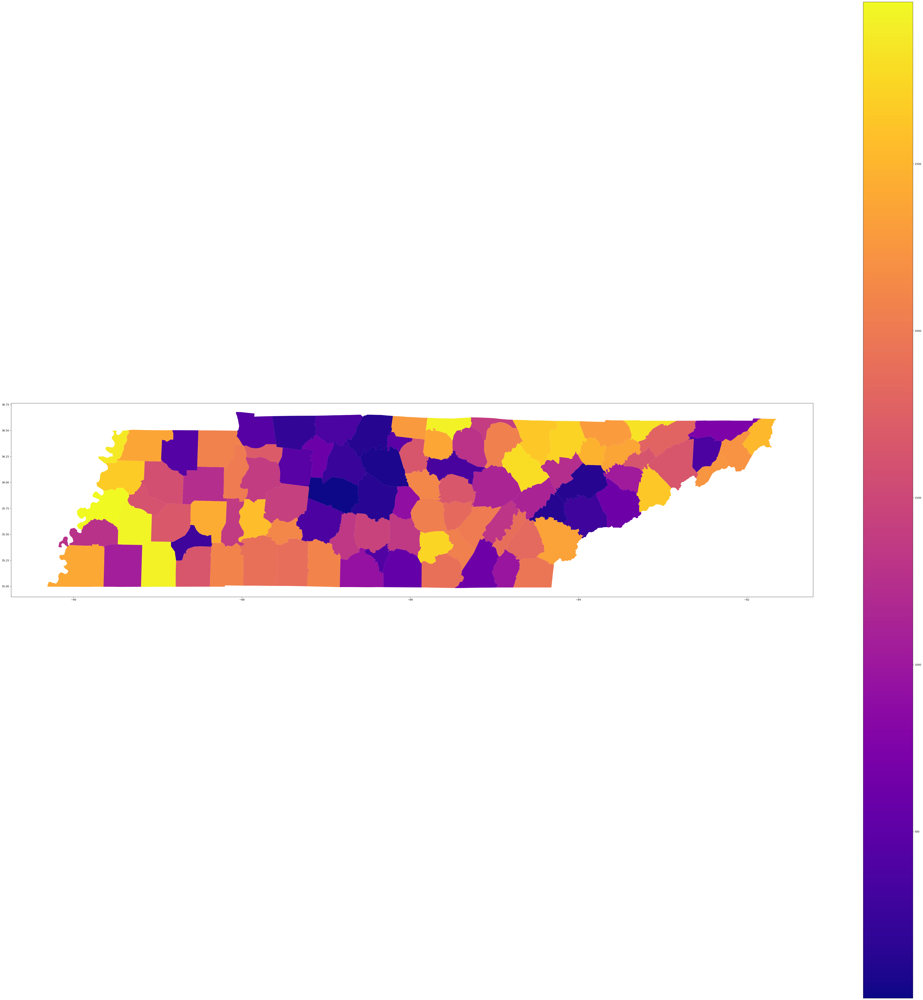

In [15]:
TNMAP = TNfull.plot(figsize=(70,70), cmap = 'plasma', column = 'QOL_rank', legend = True)
TNMAP

In [16]:
TNfull.crs

<Geographic 2D CRS: EPSG:4269>
Name: NAD83
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: North America - NAD83
- bounds: (167.65, 14.92, -47.74, 86.46)
Datum: North American Datum 1983
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

In [17]:
TNfull = TNfull.to_crs(epsg=4326)
print(TNfull.crs)
TNfull.head()

epsg:4326


,STATEFP,COUNTYFP,COUNTYNS,AFFGEOID,GEOID,County,NAMELSAD,STUSPS,State,LSAD,ALAND,AWATER,geometry,Unnamed: 0,StAbbr,STCOU,Quality of Life,Life Expectancy,Median Household Income,Percent Some College,Percent Access to Exercise,Population,Square Miles,Density,QOL_rank,LE_rank,MHI_rank,PSC_rank,PAE_rank,SQM_rank,POP_rank,DEN_rank
0,47,109,01639774,0500000US47109,47109,McNairy,McNairy County,TN,Tennessee,06,1457753351,1994997,"POLYGON ((-88.78673 35.12508, -88.78177 35.247...",1134,TN,47109,0.025129,72.222655,44341,50.538738,23.535954,25696,560.84,45.816989,1651.0,2836.0,2606.0,2300.0,2671.0,1938.0,1539.0,1449.0
1,47,169,01648581,0500000US47169,47169,Trousdale,Trousdale County,TN,Tennessee,06,296143586,5960709,"POLYGON ((-86.28326 36.34750, -86.27249 36.358...",26,TN,47169,-0.371258,74.666901,54970,44.487179,53.329098,11455,116.64,98.208162,488.0,2331.0,1544.5,2708.0,1621.0,3049.0,2274.0,815.0
2,47,075,01639753,0500000US47075,47075,Haywood,Haywood County,TN,Tennessee,06,1380741528,2472509,"POLYGON ((-89.48270 35.59395, -89.46999 35.595...",1046,TN,47075,0.854725,72.328220,43742,43.897004,42.646511,17002,534.15,31.830010,2951.0,2822.0,2641.0,2740.0,2102.0,2026.0,1932.0,1773.0
3,47,101,01639765,0500000US47101,47101,Lewis,Lewis County,TN,Tennessee,06,730614739,1024940,"POLYGON ((-87.71101 35.50529, -87.69065 35.505...",225,TN,47101,0.182290,73.227304,48288,40.414138,13.362388,12363,282.48,43.765930,2115.0,2676.0,2254.0,2872.0,2803.0,2848.0,2215.0,1494.0
4,47,069,01639750,0500000US47069,47069,Hardeman,Hardeman County,TN,Tennessee,06,1729509842,6768751,"POLYGON ((-89.18394 35.39713, -89.18255 35.432...",1589,TN,47069,0.806809,73.366586,44937,34.138418,25.622867,24836,670.39,37.047092,2935.0,2647.0,2554.5,3002.0,2637.0,1483.0,1577.0,1648.0


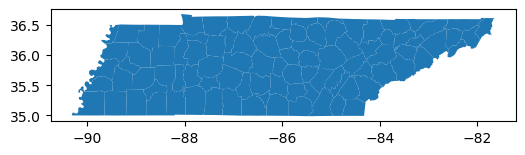

In [18]:
TNfull.plot(figsize=(6, 6))
plt.show()

In [19]:
m = folium.Map(location=[36.17, -86.77], zoom_start=10, tiles='CartoDB positron')
m

In [20]:
for _, r in TNfull.iterrows():
    sim_geo = gpd.GeoSeries(r['geometry']).simplify(tolerance=0.001)
    geo_j = sim_geo.to_json()
    geo_j = folium.GeoJson(data=geo_j,
                           style_function=lambda x: {'fillColor': 'orange'})
    folium.Popup(r['County']).add_to(geo_j)
    geo_j.add_to(m)
m

In [21]:
TNfull = TNfull.to_crs(epsg=2263)
TNfull['centroid'] = TNfull.centroid

In [22]:
TNfull = TNfull.to_crs(epsg=4326)

TNfull['centroid'] = TNfull['centroid'].to_crs(epsg=4326)

TNfull.head()

,STATEFP,COUNTYFP,COUNTYNS,AFFGEOID,GEOID,County,NAMELSAD,STUSPS,State,LSAD,ALAND,AWATER,geometry,Unnamed: 0,StAbbr,STCOU,Quality of Life,Life Expectancy,Median Household Income,Percent Some College,Percent Access to Exercise,Population,Square Miles,Density,QOL_rank,LE_rank,MHI_rank,PSC_rank,PAE_rank,SQM_rank,POP_rank,DEN_rank,centroid
0,47,109,01639774,0500000US47109,47109,McNairy,McNairy County,TN,Tennessee,06,1457753351,1994997,"POLYGON ((-88.78673 35.12508, -88.78177 35.247...",1134,TN,47109,0.025129,72.222655,44341,50.538738,23.535954,25696,560.84,45.816989,1651.0,2836.0,2606.0,2300.0,2671.0,1938.0,1539.0,1449.0,POINT (-88.56340 35.17575)
1,47,169,01648581,0500000US47169,47169,Trousdale,Trousdale County,TN,Tennessee,06,296143586,5960709,"POLYGON ((-86.28326 36.34750, -86.27249 36.358...",26,TN,47169,-0.371258,74.666901,54970,44.487179,53.329098,11455,116.64,98.208162,488.0,2331.0,1544.5,2708.0,1621.0,3049.0,2274.0,815.0,POINT (-86.15629 36.39237)
2,47,075,01639753,0500000US47075,47075,Haywood,Haywood County,TN,Tennessee,06,1380741528,2472509,"POLYGON ((-89.48270 35.59395, -89.46999 35.595...",1046,TN,47075,0.854725,72.328220,43742,43.897004,42.646511,17002,534.15,31.830010,2951.0,2822.0,2641.0,2740.0,2102.0,2026.0,1932.0,1773.0,POINT (-89.28417 35.58304)
3,47,101,01639765,0500000US47101,47101,Lewis,Lewis County,TN,Tennessee,06,730614739,1024940,"POLYGON ((-87.71101 35.50529, -87.69065 35.505...",225,TN,47101,0.182290,73.227304,48288,40.414138,13.362388,12363,282.48,43.765930,2115.0,2676.0,2254.0,2872.0,2803.0,2848.0,2215.0,1494.0,POINT (-87.49367 35.52728)
4,47,069,01639750,0500000US47069,47069,Hardeman,Hardeman County,TN,Tennessee,06,1729509842,6768751,"POLYGON ((-89.18394 35.39713, -89.18255 35.432...",1589,TN,47069,0.806809,73.366586,44937,34.138418,25.622867,24836,670.39,37.047092,2935.0,2647.0,2554.5,3002.0,2637.0,1483.0,1577.0,1648.0,POINT (-88.99324 35.20651)


In [23]:
import pylab as plot
params = {'legend.fontsize': 20,
          'legend.handlelength': 2}
plot.rcParams.update(params)

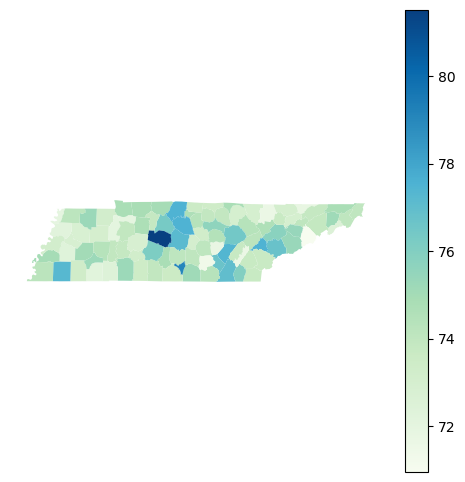

In [24]:
fig, ax = plt.subplots(figsize=(6,6))
TNfull.plot(column = 'Life Expectancy', 
              cmap = 'GnBu',  
              legend = True,
              ax = ax)
ax.axis('off');

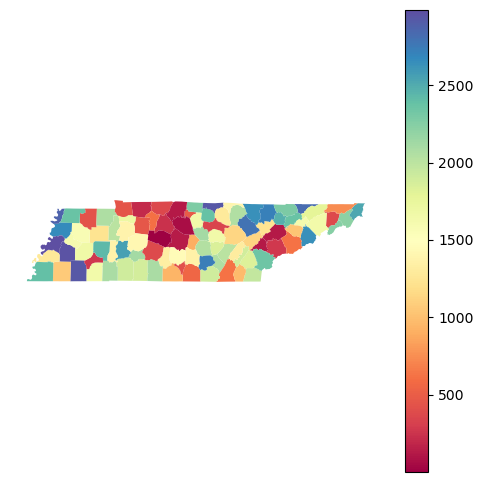

In [25]:
fig, ax = plt.subplots(figsize=(6,6))
TNfull.plot(column = 'QOL_rank', 
              cmap = 'Spectral',  
              legend = True,
              ax = ax)
ax.axis('off');

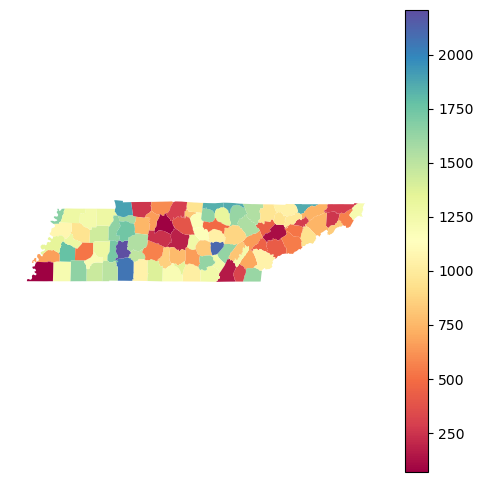

In [26]:
fig, ax = plt.subplots(figsize=(6,6))
TNfull.plot(column = 'DEN_rank', 
              cmap = 'Spectral',  
              legend = True,
              ax = ax)
ax.axis('off');

In [27]:
TNfull.corr()

,ALAND,AWATER,Unnamed: 0,STCOU,Quality of Life,Life Expectancy,Median Household Income,Percent Some College,Percent Access to Exercise,Population,Square Miles,Density,QOL_rank,LE_rank,MHI_rank,PSC_rank,PAE_rank,SQM_rank,POP_rank,DEN_rank
ALAND,1.000000,-0.111176,0.985413,0.009647,-0.108388,0.177365,0.219525,0.255626,0.284286,0.336880,0.997484,0.210909,-0.090677,-0.151788,-0.194798,-0.272044,-0.220877,-0.985553,-0.527190,-0.126519
AWATER,-0.111176,1.000000,-0.052917,-0.044386,0.085348,-0.071560,-0.033682,0.048317,0.022346,0.182997,-0.040717,0.197357,0.048376,0.067051,-0.026646,-0.064986,-0.032981,0.052907,-0.054513,-0.067759
Unnamed: 0,0.985413,-0.052917,1.000000,0.030195,-0.118422,0.190476,0.229436,0.263908,0.268161,0.348811,0.986969,0.221599,-0.104067,-0.172067,-0.207948,-0.278593,-0.211980,-0.999999,-0.502634,-0.120377
STCOU,0.009647,-0.044386,0.030195,1.000000,-0.219951,0.252012,0.186599,0.186564,0.035275,0.096734,0.007075,0.074004,-0.167945,-0.218820,-0.141440,-0.176919,-0.053670,-0.030050,-0.028508,-0.068082
Quality of Life,-0.108388,0.085348,-0.118422,-0.219951,1.000000,-0.728316,-0.774809,-0.734559,-0.321527,-0.331128,-0.102247,-0.405732,0.944792,0.713342,0.733503,0.698445,0.331631,0.118342,0.516248,0.570685
Life Expectancy,0.177365,-0.071560,0.190476,0.252012,-0.728316,1.000000,0.730182,0.562286,0.276389,0.343227,0.173389,0.387473,-0.682353,-0.978878,-0.683201,-0.582605,-0.304595,-0.190373,-0.460184,-0.478574
Median Household Income,0.219525,-0.033682,0.229436,0.186599,-0.774809,0.730182,1.000000,0.654794,0.325414,0.339580,0.218243,0.370000,-0.674875,-0.738085,-0.915173,-0.641181,-0.328250,-0.229375,-0.522803,-0.530192
Percent Some College,0.255626,0.048317,0.263908,0.186564,-0.734559,0.562286,0.654794,1.000000,0.548597,0.592801,0.260617,0.644302,-0.689236,-0.559344,-0.627093,-0.974572,-0.584061,-0.263880,-0.693466,-0.698289
Percent Access to Exercise,0.284286,0.022346,0.268161,0.035275,-0.321527,0.276389,0.325414,0.548597,1.000000,0.509480,0.287897,0.548654,-0.267664,-0.240648,-0.301934,-0.552376,-0.975875,-0.268247,-0.644152,-0.624624
Population,0.336880,0.182997,0.348811,0.096734,-0.331128,0.343227,0.339580,0.592801,0.509480,1.000000,0.352779,0.964044,-0.311271,-0.338058,-0.363644,-0.649807,-0.565651,-0.348948,-0.610820,-0.591952


##leg_kwds = {'title': 'Zipcodes', 'loc': 'upper left', 
            'bbox_to_anchor': (1, 1.03), 'ncol': 2}

##TNfull.plot(column = 'Quality of Life', figsize=(10, 10),
              edgecolor = 'black',
              legend = True, legend_kwds = leg_kwds, 
              cmap = 'Set3')
##plt.show()

In [28]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
%matplotlib inline

In [29]:
allcounties

,STATEFP,COUNTYFP,COUNTYNS,AFFGEOID,GEOID,NAME,NAMELSAD,STUSPS,STATE_NAME,LSAD,ALAND,AWATER,geometry
0,01,059,00161555,0500000US01059,01059,Franklin,Franklin County,AL,Alabama,06,1641845708,32639621,"POLYGON ((-88.16591 34.38093, -88.16563 34.383..."
1,06,057,01682927,0500000US06057,06057,Nevada,Nevada County,CA,California,06,2480587301,41531993,"POLYGON ((-121.27953 39.23054, -121.25918 39.2..."
2,26,031,01622958,0500000US26031,26031,Cheboygan,Cheboygan County,MI,Michigan,06,1852564001,440607445,"POLYGON ((-84.73269 45.28938, -84.73239 45.787..."
3,29,119,00758518,0500000US29119,29119,McDonald,McDonald County,MO,Missouri,06,1397155452,520251,"POLYGON ((-94.61831 36.76656, -94.06890 36.747..."
4,31,157,00835900,0500000US31157,31157,Scotts Bluff,Scotts Bluff County,NE,Nebraska,06,1915576079,15402683,"POLYGON ((-104.05293 41.90614, -104.05299 41.9..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...
3229,13,301,00347777,0500000US13301,13301,Warren,Warren County,GA,Georgia,06,736483608,6034478,"POLYGON ((-82.86661 33.46660, -82.82314 33.504..."
3230,06,023,01681908,0500000US06023,06023,Humboldt,Humboldt County,CA,California,06,9241565229,1253726036,"POLYGON ((-124.40860 40.44320, -124.39664 40.4..."
3231,34,023,00882230,0500000US34023,34023,Middlesex,Middlesex County,NJ,New Jersey,06,800946845,35291196,"POLYGON ((-74.63060 40.33960, -74.62024 40.373..."
3232,13,311,00326781,0500000US13311,13311,White,White County,GA,Georgia,06,623524633,3917258,"POLYGON ((-83.87121 34.66490, -83.87251 34.683..."


In [30]:
allcounties.rename(columns = {'NAME':'County', 'STATE_NAME':'State'}, inplace = True)
allcounties

,STATEFP,COUNTYFP,COUNTYNS,AFFGEOID,GEOID,County,NAMELSAD,STUSPS,State,LSAD,ALAND,AWATER,geometry
0,01,059,00161555,0500000US01059,01059,Franklin,Franklin County,AL,Alabama,06,1641845708,32639621,"POLYGON ((-88.16591 34.38093, -88.16563 34.383..."
1,06,057,01682927,0500000US06057,06057,Nevada,Nevada County,CA,California,06,2480587301,41531993,"POLYGON ((-121.27953 39.23054, -121.25918 39.2..."
2,26,031,01622958,0500000US26031,26031,Cheboygan,Cheboygan County,MI,Michigan,06,1852564001,440607445,"POLYGON ((-84.73269 45.28938, -84.73239 45.787..."
3,29,119,00758518,0500000US29119,29119,McDonald,McDonald County,MO,Missouri,06,1397155452,520251,"POLYGON ((-94.61831 36.76656, -94.06890 36.747..."
4,31,157,00835900,0500000US31157,31157,Scotts Bluff,Scotts Bluff County,NE,Nebraska,06,1915576079,15402683,"POLYGON ((-104.05293 41.90614, -104.05299 41.9..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...
3229,13,301,00347777,0500000US13301,13301,Warren,Warren County,GA,Georgia,06,736483608,6034478,"POLYGON ((-82.86661 33.46660, -82.82314 33.504..."
3230,06,023,01681908,0500000US06023,06023,Humboldt,Humboldt County,CA,California,06,9241565229,1253726036,"POLYGON ((-124.40860 40.44320, -124.39664 40.4..."
3231,34,023,00882230,0500000US34023,34023,Middlesex,Middlesex County,NJ,New Jersey,06,800946845,35291196,"POLYGON ((-74.63060 40.33960, -74.62024 40.373..."
3232,13,311,00326781,0500000US13311,13311,White,White County,GA,Georgia,06,623524633,3917258,"POLYGON ((-83.87121 34.66490, -83.87251 34.683..."


In [31]:
hopeful = pd.merge(left = allcounties, right = contiguous, how='inner',
                    on = ('County', 'State'))
hopeful

,STATEFP,COUNTYFP,COUNTYNS,AFFGEOID,GEOID,County,NAMELSAD,STUSPS,State,LSAD,ALAND,AWATER,geometry,Unnamed: 0,StAbbr,STCOU,Quality of Life,Life Expectancy,Median Household Income,Percent Some College,Percent Access to Exercise,Population,Square Miles,Density,QOL_rank,LE_rank,MHI_rank,PSC_rank,PAE_rank,SQM_rank,POP_rank,DEN_rank
0,01,059,00161555,0500000US01059,01059,Franklin,Franklin County,AL,Alabama,06,1641845708,32639621,"POLYGON ((-88.16591 34.38093, -88.16563 34.383...",1520,AL,1059,-0.093070,73.676389,40448,42.765767,52.147994,31507,646.51,48.733972,1236.0,2596.0,2851.5,2780.0,1678.0,1552.0,1361.0,1375.0
1,06,057,01682927,0500000US06057,06057,Nevada,Nevada County,CA,California,06,2480587301,41531993,"POLYGON ((-121.27953 39.23054, -121.25918 39.2...",2296,CA,6057,-0.404075,80.823897,74158,73.590675,67.783808,99606,974.49,102.213466,418.0,256.0,313.0,316.0,936.0,774.0,590.0,793.0
2,26,031,01622958,0500000US26031,26031,Cheboygan,Cheboygan County,MI,Michigan,06,1852564001,440607445,"POLYGON ((-84.73269 45.28938, -84.73239 45.787...",2093,MI,26031,0.255258,76.723369,50788,53.700268,48.397828,25365,885.23,28.653570,2303.0,1578.0,1999.0,2039.0,1859.0,977.0,1558.5,1877.0
3,29,119,00758518,0500000US29119,29119,McDonald,McDonald County,MO,Missouri,06,1397155452,520251,"POLYGON ((-94.61831 36.76656, -94.06890 36.747...",1064,MO,29119,0.432871,74.007773,45446,38.789521,24.199627,22900,539.70,42.430980,2637.0,2501.0,2510.0,2921.0,2661.0,2008.0,1652.0,1514.0
4,31,157,00835900,0500000US31157,31157,Scotts Bluff,Scotts Bluff County,NE,Nebraska,06,1915576079,15402683,"POLYGON ((-104.05293 41.90614, -104.05299 41.9...",1818,NE,31157,0.367887,76.019197,53956,66.422927,68.398702,35299,745.50,47.349430,2533.0,1855.0,1647.0,818.0,906.0,1253.0,1271.0,1411.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3064,13,301,00347777,0500000US13301,13301,Warren,Warren County,GA,Georgia,06,736483608,6034478,"POLYGON ((-82.86661 33.46660, -82.82314 33.504...",242,GA,13301,0.709741,73.106576,40422,43.436754,NaN,5232,286.74,18.246495,2891.0,2702.0,2856.0,2756.0,NaN,2831.0,2744.0,2240.0
3065,06,023,01681908,0500000US06023,06023,Humboldt,Humboldt County,CA,California,06,9241565229,1253726036,"POLYGON ((-124.40860 40.44320, -124.39664 40.4...",2966,CA,6023,-0.013282,77.204362,56071,67.455277,81.333056,134977,4052.22,33.309396,1506.0,1401.0,1423.0,742.0,394.0,104.0,467.0,1741.0
3066,34,023,00882230,0500000US34023,34023,Middlesex,Middlesex County,NJ,New Jersey,06,800946845,35291196,"POLYGON ((-74.63060 40.33960, -74.62024 40.373...",311,NJ,34023,-0.208360,80.590686,95610,75.026251,91.104243,822736,322.51,2551.040278,875.0,299.0,67.0,254.0,157.0,2762.0,75.0,26.0
3067,13,311,00326781,0500000US13311,13311,White,White County,GA,Georgia,06,623524633,3917258,"POLYGON ((-83.87121 34.66490, -83.87251 34.683...",149,GA,13311,-0.603832,78.124217,58831,49.812978,69.168140,31094,242.16,128.402709,161.0,1014.0,1150.0,2361.0,872.0,2925.0,1373.0,678.0


In [173]:
hopeful.corr()

,ALAND,AWATER,Unnamed: 0,STCOU,Quality of Life,Life Expectancy,Median Household Income,Percent Some College,Percent Access to Exercise,Population,Square Miles,Density,QOL_rank,LE_rank,MHI_rank,PSC_rank,PAE_rank,SQM_rank,POP_rank,DEN_rank
ALAND,1.000000,0.034235,0.572070,0.001150,0.071828,0.095086,-0.010699,0.010808,0.046081,0.112665,0.987419,-0.060694,0.068294,-0.109070,-0.014553,-0.013241,-0.051659,-0.572222,-0.000909,0.305973
AWATER,0.034235,1.000000,0.239005,-0.018236,-0.060257,0.109359,0.061821,0.051476,0.099629,0.102983,0.189319,-0.000181,-0.053388,-0.119263,-0.060722,-0.060847,-0.107541,-0.239011,-0.091779,0.020192
Unnamed: 0,0.572070,0.239005,1.000000,0.075231,0.042187,0.184304,-0.009607,0.067290,0.066291,0.081021,0.599341,-0.119763,0.043599,-0.196693,-0.033491,-0.076277,-0.071926,-0.997963,0.009753,0.409840
STCOU,0.001150,-0.018236,0.075231,1.000000,-0.005576,0.046860,0.055310,0.000935,-0.026918,-0.056475,0.000290,0.007490,-0.005691,-0.069383,-0.070592,0.006277,0.024149,-0.078938,0.018286,0.043049
Quality of Life,0.071828,-0.060257,0.042187,-0.005576,1.000000,-0.515916,-0.614858,-0.510743,-0.276832,-0.129144,0.061117,-0.041930,0.967660,0.507065,0.606823,0.505273,0.282028,-0.040764,0.279507,0.294588
Life Expectancy,0.095086,0.109359,0.184304,0.046860,-0.515916,1.000000,0.653367,0.546904,0.334038,0.184038,0.111210,0.114970,-0.495514,-0.946211,-0.666930,-0.556044,-0.341053,-0.186669,-0.149017,-0.066856
Median Household Income,-0.010699,0.061821,-0.009607,0.055310,-0.614858,0.653367,1.000000,0.575728,0.447708,0.298041,0.000389,0.177700,-0.590015,-0.659628,-0.911800,-0.574944,-0.450733,0.006438,-0.416961,-0.391077
Percent Some College,0.010808,0.051476,0.067290,0.000935,-0.510743,0.546904,0.575728,1.000000,0.383954,0.206806,0.020098,0.137593,-0.503541,-0.574781,-0.575213,-0.979365,-0.395777,-0.068741,-0.262784,-0.219745
Percent Access to Exercise,0.046081,0.099629,0.066291,-0.026918,-0.276832,0.334038,0.447708,0.383954,1.000000,0.347202,0.061230,0.205398,-0.264507,-0.337993,-0.426438,-0.388705,-0.984713,-0.065968,-0.543320,-0.466311
Population,0.112665,0.102983,0.081021,-0.056475,-0.129144,0.184038,0.298041,0.206806,0.347202,1.000000,0.128275,0.364995,-0.132453,-0.196345,-0.251820,-0.213007,-0.342918,-0.082165,-0.414610,-0.387459


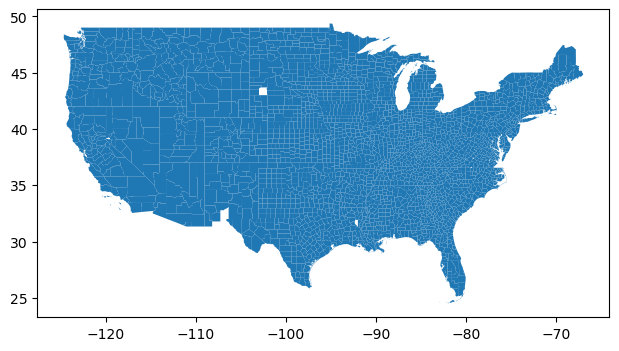

In [32]:
fig, ax = plt.subplots(figsize=(16,4))
hopeful.plot(ax = ax);

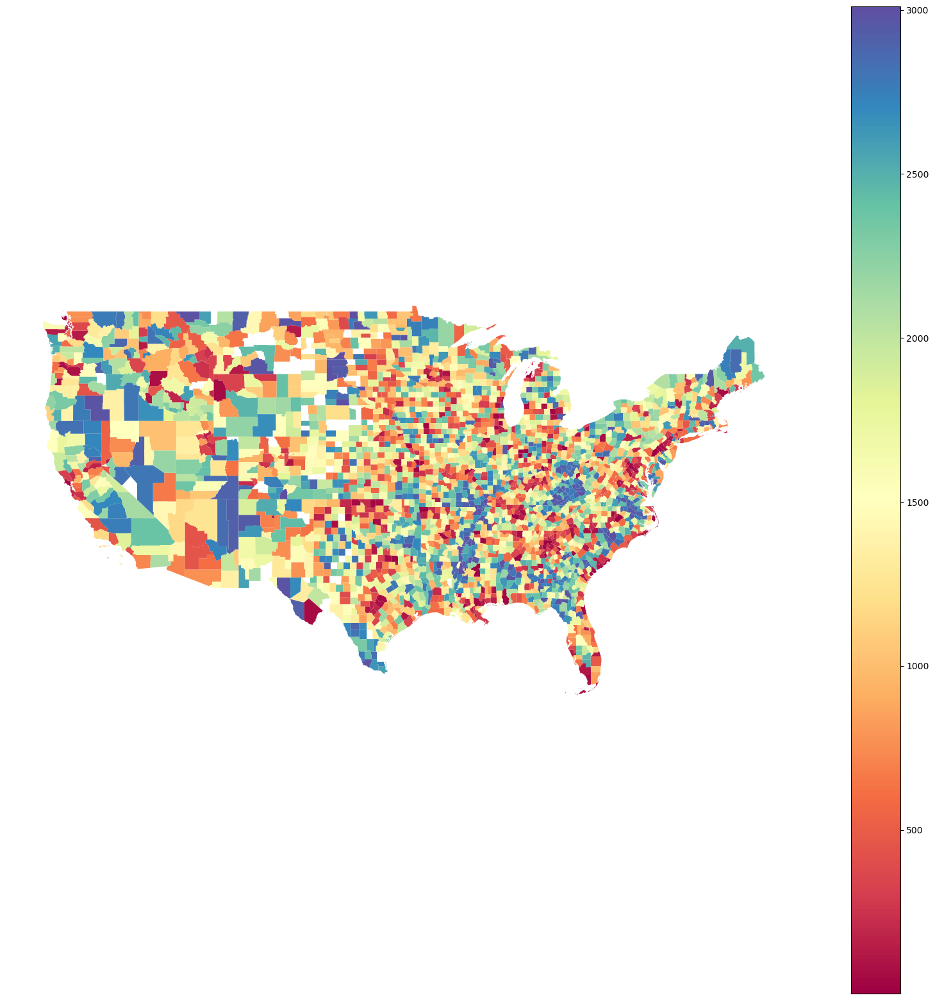

In [33]:
fig, ax = plt.subplots(figsize=(20,20))
hopeful.plot(column = 'QOL_rank', 
              cmap = 'Spectral',  
              legend = True,
              ax = ax)
ax.axis('off');

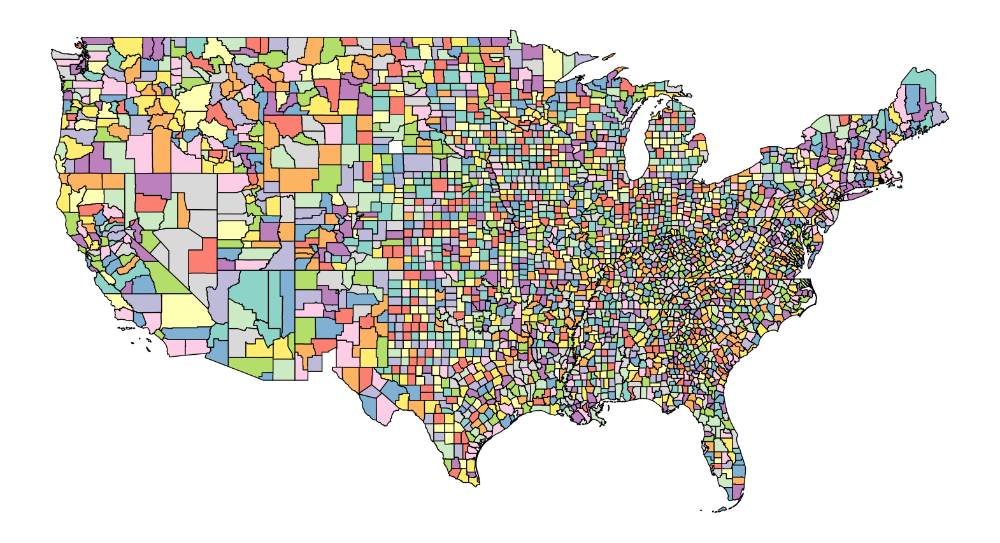

In [188]:
fig, ax = plt.subplots(figsize=(20,20))
hopeful.plot(cmap = 'Set3',  
              legend = True,
              edgecolor='black',
              ax = ax)
ax.axis('off');

In [35]:
hopeful

,STATEFP,COUNTYFP,COUNTYNS,AFFGEOID,GEOID,County,NAMELSAD,STUSPS,State,LSAD,ALAND,AWATER,geometry,Unnamed: 0,StAbbr,STCOU,Quality of Life,Life Expectancy,Median Household Income,Percent Some College,Percent Access to Exercise,Population,Square Miles,Density,QOL_rank,LE_rank,MHI_rank,PSC_rank,PAE_rank,SQM_rank,POP_rank,DEN_rank
0,01,059,00161555,0500000US01059,01059,Franklin,Franklin County,AL,Alabama,06,1641845708,32639621,"POLYGON ((-88.16591 34.38093, -88.16563 34.383...",1520,AL,1059,-0.093070,73.676389,40448,42.765767,52.147994,31507,646.51,48.733972,1236.0,2596.0,2851.5,2780.0,1678.0,1552.0,1361.0,1375.0
1,06,057,01682927,0500000US06057,06057,Nevada,Nevada County,CA,California,06,2480587301,41531993,"POLYGON ((-121.27953 39.23054, -121.25918 39.2...",2296,CA,6057,-0.404075,80.823897,74158,73.590675,67.783808,99606,974.49,102.213466,418.0,256.0,313.0,316.0,936.0,774.0,590.0,793.0
2,26,031,01622958,0500000US26031,26031,Cheboygan,Cheboygan County,MI,Michigan,06,1852564001,440607445,"POLYGON ((-84.73269 45.28938, -84.73239 45.787...",2093,MI,26031,0.255258,76.723369,50788,53.700268,48.397828,25365,885.23,28.653570,2303.0,1578.0,1999.0,2039.0,1859.0,977.0,1558.5,1877.0
3,29,119,00758518,0500000US29119,29119,McDonald,McDonald County,MO,Missouri,06,1397155452,520251,"POLYGON ((-94.61831 36.76656, -94.06890 36.747...",1064,MO,29119,0.432871,74.007773,45446,38.789521,24.199627,22900,539.70,42.430980,2637.0,2501.0,2510.0,2921.0,2661.0,2008.0,1652.0,1514.0
4,31,157,00835900,0500000US31157,31157,Scotts Bluff,Scotts Bluff County,NE,Nebraska,06,1915576079,15402683,"POLYGON ((-104.05293 41.90614, -104.05299 41.9...",1818,NE,31157,0.367887,76.019197,53956,66.422927,68.398702,35299,745.50,47.349430,2533.0,1855.0,1647.0,818.0,906.0,1253.0,1271.0,1411.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3064,13,301,00347777,0500000US13301,13301,Warren,Warren County,GA,Georgia,06,736483608,6034478,"POLYGON ((-82.86661 33.46660, -82.82314 33.504...",242,GA,13301,0.709741,73.106576,40422,43.436754,NaN,5232,286.74,18.246495,2891.0,2702.0,2856.0,2756.0,NaN,2831.0,2744.0,2240.0
3065,06,023,01681908,0500000US06023,06023,Humboldt,Humboldt County,CA,California,06,9241565229,1253726036,"POLYGON ((-124.40860 40.44320, -124.39664 40.4...",2966,CA,6023,-0.013282,77.204362,56071,67.455277,81.333056,134977,4052.22,33.309396,1506.0,1401.0,1423.0,742.0,394.0,104.0,467.0,1741.0
3066,34,023,00882230,0500000US34023,34023,Middlesex,Middlesex County,NJ,New Jersey,06,800946845,35291196,"POLYGON ((-74.63060 40.33960, -74.62024 40.373...",311,NJ,34023,-0.208360,80.590686,95610,75.026251,91.104243,822736,322.51,2551.040278,875.0,299.0,67.0,254.0,157.0,2762.0,75.0,26.0
3067,13,311,00326781,0500000US13311,13311,White,White County,GA,Georgia,06,623524633,3917258,"POLYGON ((-83.87121 34.66490, -83.87251 34.683...",149,GA,13311,-0.603832,78.124217,58831,49.812978,69.168140,31094,242.16,128.402709,161.0,1014.0,1150.0,2361.0,872.0,2925.0,1373.0,678.0


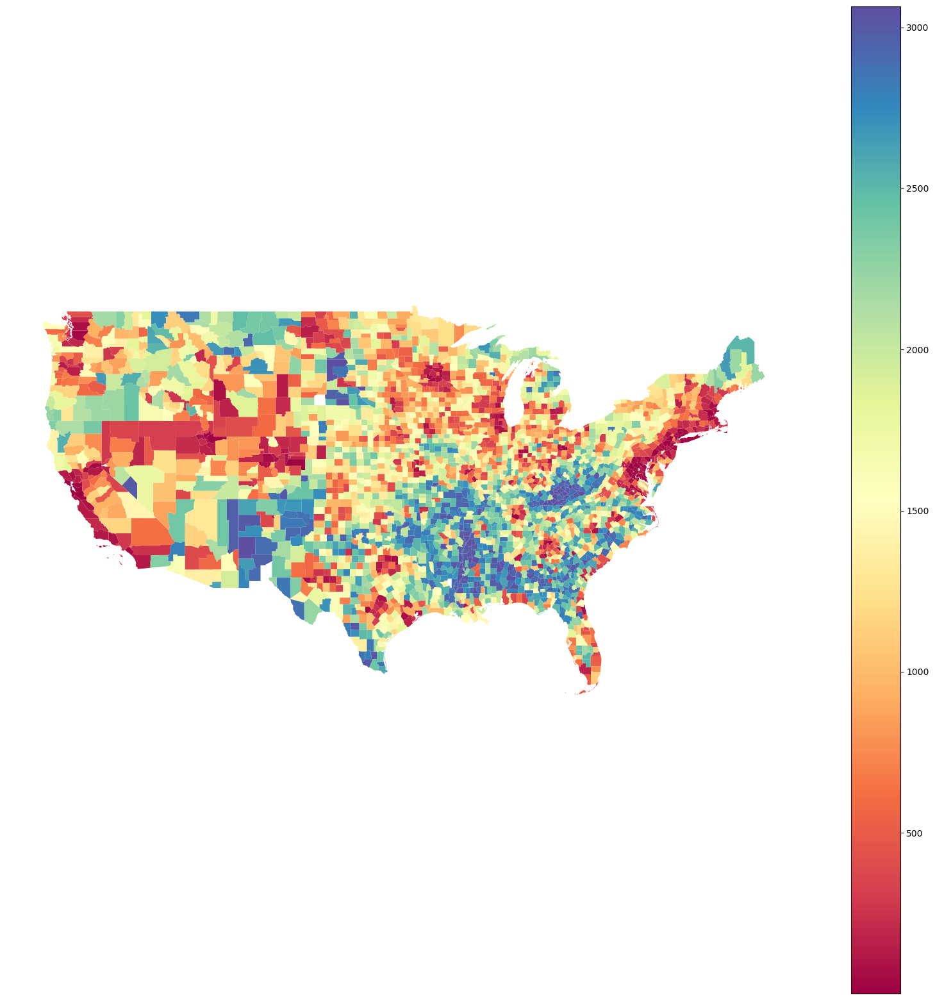

In [36]:
fig, ax = plt.subplots(figsize=(20,20))
hopeful.plot(column = 'MHI_rank', 
              cmap = 'Spectral',  
              legend = True,
              ax = ax)
ax.axis('off');

In [37]:
NY = allcounties.loc[(allcounties['STUSPS'] == 'NY')]
NY

,STATEFP,COUNTYFP,COUNTYNS,AFFGEOID,GEOID,County,NAMELSAD,STUSPS,State,LSAD,ALAND,AWATER,geometry
31,36,003,00974100,0500000US36003,36003,Allegany,Allegany County,NY,New York,06,2666225086,12989848,"POLYGON ((-78.30884 42.52122, -78.04198 42.520..."
70,36,049,00974123,0500000US36049,36049,Lewis,Lewis County,NY,New York,06,3306017158,39659426,"POLYGON ((-75.84040 43.88393, -75.75863 43.878..."
124,36,069,00974133,0500000US36069,36069,Ontario,Ontario County,NY,New York,06,1668147120,47854414,"POLYGON ((-77.61167 42.76317, -77.58822 42.762..."
178,36,123,00974159,0500000US36123,36123,Yates,Yates County,NY,New York,06,875777224,97488350,"POLYGON ((-77.36711 42.66787, -77.35361 42.699..."
447,36,011,00974104,0500000US36011,36011,Cayuga,Cayuga County,NY,New York,06,1791201989,445696708,"POLYGON ((-76.74006 42.78942, -76.71951 42.825..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...
3042,36,087,00974142,0500000US36087,36087,Rockland,Rockland County,NY,New York,06,449841002,66919665,"POLYGON ((-74.23449 41.14289, -73.98075 41.325..."
3103,36,023,00974110,0500000US36023,36023,Cortland,Cortland County,NY,New York,06,1291817953,7110638,"POLYGON ((-76.27467 42.77126, -76.08017 42.781..."
3117,36,111,00974153,0500000US36111,36111,Ulster,Ulster County,NY,New York,06,2911757764,94596811,"POLYGON ((-74.55360 42.12148, -74.53099 42.146..."
3124,36,007,00974102,0500000US36007,36007,Broome,Broome County,NY,New York,06,1827594819,25109986,"POLYGON ((-76.13018 42.41034, -76.02269 42.412..."


In [38]:
NYfull = pd.merge(left = NY, right = contiguous, how='inner',
                    on = ('County', 'State'))
NYfull

,STATEFP,COUNTYFP,COUNTYNS,AFFGEOID,GEOID,County,NAMELSAD,STUSPS,State,LSAD,ALAND,AWATER,geometry,Unnamed: 0,StAbbr,STCOU,Quality of Life,Life Expectancy,Median Household Income,Percent Some College,Percent Access to Exercise,Population,Square Miles,Density,QOL_rank,LE_rank,MHI_rank,PSC_rank,PAE_rank,SQM_rank,POP_rank,DEN_rank
0,36,003,00974100,0500000US36003,36003,Allegany,Allegany County,NY,New York,06,2666225086,12989848,"POLYGON ((-78.30884 42.52122, -78.04198 42.520...",2368,NY,36003,0.131427,77.886721,53371,64.942218,41.163731,45587,1034.42,44.070107,1978.0,1108.0,1703.0,965.0,2169.0,702.0,1041.0,1487.0
1,36,049,00974123,0500000US36049,36049,Lewis,Lewis County,NY,New York,06,3306017158,39659426,"POLYGON ((-75.84040 43.88393, -75.75863 43.878...",2566,NY,36049,0.067534,79.806852,57897,58.609553,38.664304,26187,1289.89,20.301731,1780.0,465.0,1239.0,1550.0,2269.0,504.0,1531.0,2163.0
2,36,069,00974133,0500000US36069,36069,Ontario,Ontario County,NY,New York,06,1668147120,47854414,"POLYGON ((-77.61167 42.76317, -77.58822 42.762...",1573,NY,36069,-0.451373,80.084823,62777,73.396734,71.972834,110091,662.43,166.192654,336.0,398.0,833.0,322.0,752.0,1499.0,540.0,546.0
3,36,123,00974159,0500000US36123,36123,Yates,Yates County,NY,New York,06,875777224,97488350,"POLYGON ((-77.36711 42.66787, -77.35361 42.699...",437,NY,36123,-0.497995,77.723896,57057,50.690335,42.906738,24780,375.76,65.946349,278.0,1173.0,1315.0,2287.0,2092.0,2636.0,1580.0,1127.0
4,36,011,00974104,0500000US36011,36011,Cayuga,Cayuga County,NY,New York,06,1791201989,445696708,"POLYGON ((-76.74006 42.78942, -76.71951 42.825...",2047,NY,36011,-0.002309,79.050232,59335,58.290031,70.833229,76029,863.64,88.033208,1555.0,699.0,1100.0,1590.0,797.0,1023.0,712.0,906.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
57,36,087,00974142,0500000US36087,36087,Rockland,Rockland County,NY,New York,06,449841002,66919665,"POLYGON ((-74.23449 41.14289, -73.98075 41.325...",93,NY,36087,-0.533331,81.361520,94874,64.548272,84.162317,326225,199.34,1636.525534,239.0,183.0,68.0,999.0,310.0,2982.0,215.0,51.0
58,36,023,00974110,0500000US36023,36023,Cortland,Cortland County,NY,New York,06,1291817953,7110638,"POLYGON ((-76.27467 42.77126, -76.08017 42.781...",930,NY,36023,0.230065,78.107197,60165,64.293388,75.796579,47173,501.52,94.060057,2241.0,1025.0,1045.0,1024.0,600.0,2142.0,1011.0,850.0
59,36,111,00974153,0500000US36111,36111,Ulster,Ulster County,NY,New York,06,2911757764,94596811,"POLYGON ((-74.55360 42.12148, -74.53099 42.146...",2493,NY,36111,-0.062297,79.743856,66060,64.802892,71.129852,177716,1160.76,153.103139,1347.0,481.0,624.0,974.0,783.0,577.0,364.0,597.0
60,36,007,00974102,0500000US36007,36007,Broome,Broome County,NY,New York,06,1827594819,25109986,"POLYGON ((-76.13018 42.41034, -76.02269 42.412...",1707,NY,36007,0.209314,78.079695,52510,66.521771,78.662512,189420,715.46,264.752746,2197.0,1043.0,1803.0,810.0,485.0,1364.0,344.0,376.0


<AxesSubplot:>

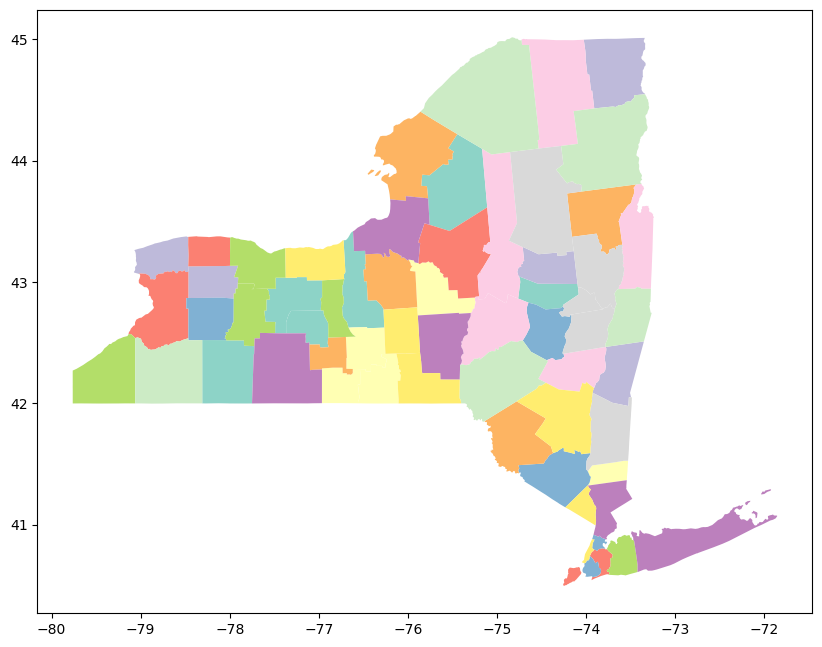

In [39]:
NYMAP = NY.plot(figsize=(10,10), cmap = 'Set3')
NYMAP

In [40]:
NYfull.crs

<Geographic 2D CRS: EPSG:4269>
Name: NAD83
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: North America - NAD83
- bounds: (167.65, 14.92, -47.74, 86.46)
Datum: North American Datum 1983
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

In [41]:
NYfull = NYfull.to_crs(epsg=4326)
print(NYfull.crs)
NYfull.head()

epsg:4326


,STATEFP,COUNTYFP,COUNTYNS,AFFGEOID,GEOID,County,NAMELSAD,STUSPS,State,LSAD,ALAND,AWATER,geometry,Unnamed: 0,StAbbr,STCOU,Quality of Life,Life Expectancy,Median Household Income,Percent Some College,Percent Access to Exercise,Population,Square Miles,Density,QOL_rank,LE_rank,MHI_rank,PSC_rank,PAE_rank,SQM_rank,POP_rank,DEN_rank
0,36,003,00974100,0500000US36003,36003,Allegany,Allegany County,NY,New York,06,2666225086,12989848,"POLYGON ((-78.30884 42.52122, -78.04198 42.520...",2368,NY,36003,0.131427,77.886721,53371,64.942218,41.163731,45587,1034.42,44.070107,1978.0,1108.0,1703.0,965.0,2169.0,702.0,1041.0,1487.0
1,36,049,00974123,0500000US36049,36049,Lewis,Lewis County,NY,New York,06,3306017158,39659426,"POLYGON ((-75.84040 43.88393, -75.75863 43.878...",2566,NY,36049,0.067534,79.806852,57897,58.609553,38.664304,26187,1289.89,20.301731,1780.0,465.0,1239.0,1550.0,2269.0,504.0,1531.0,2163.0
2,36,069,00974133,0500000US36069,36069,Ontario,Ontario County,NY,New York,06,1668147120,47854414,"POLYGON ((-77.61167 42.76317, -77.58822 42.762...",1573,NY,36069,-0.451373,80.084823,62777,73.396734,71.972834,110091,662.43,166.192654,336.0,398.0,833.0,322.0,752.0,1499.0,540.0,546.0
3,36,123,00974159,0500000US36123,36123,Yates,Yates County,NY,New York,06,875777224,97488350,"POLYGON ((-77.36711 42.66787, -77.35361 42.699...",437,NY,36123,-0.497995,77.723896,57057,50.690335,42.906738,24780,375.76,65.946349,278.0,1173.0,1315.0,2287.0,2092.0,2636.0,1580.0,1127.0
4,36,011,00974104,0500000US36011,36011,Cayuga,Cayuga County,NY,New York,06,1791201989,445696708,"POLYGON ((-76.74006 42.78942, -76.71951 42.825...",2047,NY,36011,-0.002309,79.050232,59335,58.290031,70.833229,76029,863.64,88.033208,1555.0,699.0,1100.0,1590.0,797.0,1023.0,712.0,906.0


In [42]:
NYfull = NYfull.to_crs(epsg=2263)
NYfull['centroid'] = NYfull.centroid

In [43]:
NYfull = NYfull.to_crs(epsg=4326)

NYfull['centroid'] = NYfull['centroid'].to_crs(epsg=4326)

NYfull.head()

,STATEFP,COUNTYFP,COUNTYNS,AFFGEOID,GEOID,County,NAMELSAD,STUSPS,State,LSAD,ALAND,AWATER,geometry,Unnamed: 0,StAbbr,STCOU,Quality of Life,Life Expectancy,Median Household Income,Percent Some College,Percent Access to Exercise,Population,Square Miles,Density,QOL_rank,LE_rank,MHI_rank,PSC_rank,PAE_rank,SQM_rank,POP_rank,DEN_rank,centroid
0,36,003,00974100,0500000US36003,36003,Allegany,Allegany County,NY,New York,06,2666225086,12989848,"POLYGON ((-78.30884 42.52122, -78.04198 42.520...",2368,NY,36003,0.131427,77.886721,53371,64.942218,41.163731,45587,1034.42,44.070107,1978.0,1108.0,1703.0,965.0,2169.0,702.0,1041.0,1487.0,POINT (-78.02729 42.25714)
1,36,049,00974123,0500000US36049,36049,Lewis,Lewis County,NY,New York,06,3306017158,39659426,"POLYGON ((-75.84040 43.88393, -75.75863 43.878...",2566,NY,36049,0.067534,79.806852,57897,58.609553,38.664304,26187,1289.89,20.301731,1780.0,465.0,1239.0,1550.0,2269.0,504.0,1531.0,2163.0,POINT (-75.44893 43.78478)
2,36,069,00974133,0500000US36069,36069,Ontario,Ontario County,NY,New York,06,1668147120,47854414,"POLYGON ((-77.61167 42.76317, -77.58822 42.762...",1573,NY,36069,-0.451373,80.084823,62777,73.396734,71.972834,110091,662.43,166.192654,336.0,398.0,833.0,322.0,752.0,1499.0,540.0,546.0,POINT (-77.29998 42.85301)
3,36,123,00974159,0500000US36123,36123,Yates,Yates County,NY,New York,06,875777224,97488350,"POLYGON ((-77.36711 42.66787, -77.35361 42.699...",437,NY,36123,-0.497995,77.723896,57057,50.690335,42.906738,24780,375.76,65.946349,278.0,1173.0,1315.0,2287.0,2092.0,2636.0,1580.0,1127.0,POINT (-77.10549 42.63363)
4,36,011,00974104,0500000US36011,36011,Cayuga,Cayuga County,NY,New York,06,1791201989,445696708,"POLYGON ((-76.74006 42.78942, -76.71951 42.825...",2047,NY,36011,-0.002309,79.050232,59335,58.290031,70.833229,76029,863.64,88.033208,1555.0,699.0,1100.0,1590.0,797.0,1023.0,712.0,906.0,POINT (-76.55437 42.91750)


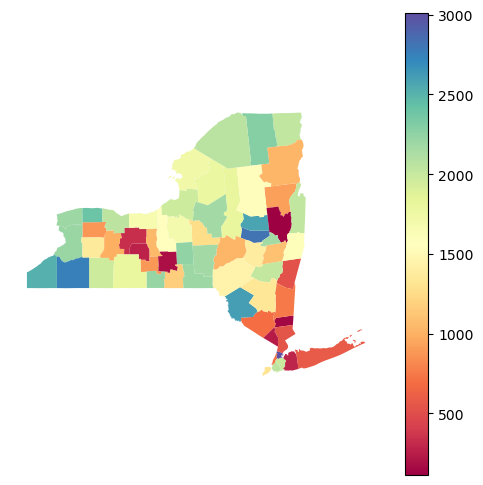

In [44]:
fig, ax = plt.subplots(figsize=(6,6))
NYfull.plot(column = 'QOL_rank', 
              cmap = 'Spectral',  
              legend = True,
              ax = ax)
ax.axis('off');

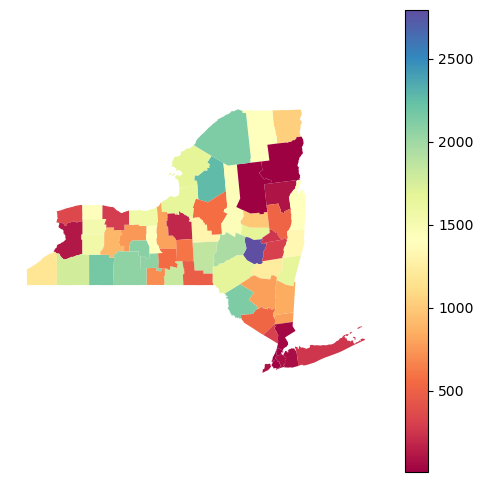

In [45]:
fig, ax = plt.subplots(figsize=(6,6))
NYfull.plot(column = 'PAE_rank', 
              cmap = 'Spectral',  
              legend = True,
              ax = ax)
ax.axis('off');

In [46]:
NYfull.corr()

,ALAND,AWATER,Unnamed: 0,STCOU,Quality of Life,Life Expectancy,Median Household Income,Percent Some College,Percent Access to Exercise,Population,Square Miles,Density,QOL_rank,LE_rank,MHI_rank,PSC_rank,PAE_rank,SQM_rank,POP_rank,DEN_rank
ALAND,1.000000,0.084114,0.831681,-0.150580,0.123217,-0.255360,-0.354909,-0.305192,-0.295946,-0.380943,0.899982,-0.378993,0.207693,0.163555,0.370933,0.292187,0.316193,-0.831603,0.281770,0.680275
AWATER,0.084114,1.000000,0.389630,0.124735,0.016065,-0.074128,0.186547,0.088030,0.107221,0.201349,0.510082,-0.091159,0.040559,0.053056,-0.053633,-0.113982,-0.120543,-0.389556,-0.217062,-0.068046
Unnamed: 0,0.831681,0.389630,1.000000,-0.140391,0.139951,-0.326892,-0.317151,-0.205042,-0.280107,-0.367578,0.888377,-0.448549,0.241248,0.227588,0.289504,0.176239,0.273137,-1.000000,0.143857,0.546247
STCOU,-0.150580,0.124735,-0.140391,1.000000,-0.408232,0.262739,0.310896,0.128474,-0.102988,0.004499,-0.075417,-0.081430,-0.391798,-0.269709,-0.398157,-0.130627,0.108695,0.140475,0.010530,-0.111353
Quality of Life,0.123217,0.016065,0.139951,-0.408232,1.000000,-0.633152,-0.611550,-0.459076,-0.080966,0.052567,0.113351,0.138681,0.950846,0.637258,0.683191,0.443309,0.109156,-0.139988,-0.004260,0.126147
Life Expectancy,-0.255360,-0.074128,-0.326892,0.262739,-0.633152,1.000000,0.736901,0.593923,0.415408,0.470000,-0.253057,0.407445,-0.676060,-0.963047,-0.742590,-0.554294,-0.408641,0.326935,-0.283130,-0.327813
Median Household Income,-0.354909,0.186547,-0.317151,0.310896,-0.611550,0.736901,1.000000,0.563067,0.450649,0.476783,-0.224835,0.183746,-0.628586,-0.664668,-0.849513,-0.559315,-0.458133,0.317170,-0.467841,-0.538452
Percent Some College,-0.305192,0.088030,-0.205042,0.128474,-0.459076,0.593923,0.563067,1.000000,0.521878,0.415416,-0.225025,0.293272,-0.445709,-0.535902,-0.614053,-0.983303,-0.544625,0.204950,-0.571153,-0.610683
Percent Access to Exercise,-0.295946,0.107221,-0.280107,-0.102988,-0.080966,0.415408,0.450649,0.521878,1.000000,0.602826,-0.208662,0.417846,-0.147045,-0.368288,-0.407907,-0.511436,-0.988680,0.280091,-0.489379,-0.520681
Population,-0.380943,0.201349,-0.367578,0.004499,0.052567,0.470000,0.476783,0.415416,0.602826,1.000000,-0.241080,0.713626,-0.022261,-0.389138,-0.369555,-0.398780,-0.555254,0.367605,-0.584917,-0.571456


In [47]:
PA = allcounties.loc[(allcounties['STUSPS'] == 'PA')]
PA

,STATEFP,COUNTYFP,COUNTYNS,AFFGEOID,GEOID,County,NAMELSAD,STUSPS,State,LSAD,ALAND,AWATER,geometry
45,42,023,01213663,0500000US42023,42023,Cameron,Cameron County,PA,Pennsylvania,06,1026239931,5653230,"POLYGON ((-78.42085 41.61728, -78.20364 41.617..."
278,42,117,01209189,0500000US42117,42117,Tioga,Tioga County,PA,Pennsylvania,06,2936765818,8279717,"POLYGON ((-77.61003 41.99952, -77.50531 42.000..."
342,42,123,01213691,0500000US42123,42123,Warren,Warren County,PA,Pennsylvania,06,2290280119,37368145,"POLYGON ((-79.61207 41.85033, -79.61084 41.998..."
379,42,075,01214034,0500000US42075,42075,Lebanon,Lebanon County,PA,Pennsylvania,06,937148912,1722125,"POLYGON ((-76.67804 40.47472, -76.53541 40.555..."
380,42,039,01213666,0500000US42039,42039,Crawford,Crawford County,PA,Pennsylvania,06,2621988043,65389924,"POLYGON ((-80.51937 41.70147, -80.51941 41.739..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...
3035,42,131,01209192,0500000US42131,42131,Wyoming,Wyoming County,PA,Pennsylvania,06,1028873829,20040006,"POLYGON ((-76.22813 41.51114, -76.22007 41.541..."
3057,42,051,01209179,0500000US42051,42051,Fayette,Fayette County,PA,Pennsylvania,06,2048054606,20636363,"POLYGON ((-80.00914 39.97715, -79.99801 39.983..."
3108,42,133,01209193,0500000US42133,42133,York,York County,PA,Pennsylvania,06,2342295972,16503210,"POLYGON ((-77.13742 40.06994, -77.02878 40.147..."
3112,42,011,01209172,0500000US42011,42011,Berks,Berks County,PA,Pennsylvania,06,2218072313,24220127,"POLYGON ((-76.41860 40.49562, -76.36922 40.509..."


In [48]:
PAfull = pd.merge(left = PA, right = contiguous, how='inner',
                    on = ('County', 'State'))
PAfull

,STATEFP,COUNTYFP,COUNTYNS,AFFGEOID,GEOID,County,NAMELSAD,STUSPS,State,LSAD,ALAND,AWATER,geometry,Unnamed: 0,StAbbr,STCOU,Quality of Life,Life Expectancy,Median Household Income,Percent Some College,Percent Access to Exercise,Population,Square Miles,Density,QOL_rank,LE_rank,MHI_rank,PSC_rank,PAE_rank,SQM_rank,POP_rank,DEN_rank
0,42,023,01213663,0500000US42023,42023,Cameron,Cameron County,PA,Pennsylvania,06,1026239931,5653230,"POLYGON ((-78.42085 41.61728, -78.20364 41.617...",504,PA,42023,0.446332,78.198679,46151,57.432432,72.448378,4330,398.60,10.863021,2655.0,989.0,2453.0,1669.0,726.0,2569.0,2808.0,2479.0
1,42,117,01209189,0500000US42117,42117,Tioga,Tioga County,PA,Pennsylvania,06,2936765818,8279717,"POLYGON ((-77.61003 41.99952, -77.50531 42.000...",2470,PA,42117,-0.155632,78.373935,47683,53.460540,43.614969,40381,1137.30,35.506023,1037.0,913.0,2305.0,2063.0,2067.0,600.0,1144.0,1690.0
2,42,123,01213691,0500000US42123,42123,Warren,Warren County,PA,Pennsylvania,06,2290280119,37368145,"POLYGON ((-79.61207 41.85033, -79.61084 41.998...",2125,PA,42123,0.137996,78.526161,52729,58.713465,78.060505,38911,897.81,43.339905,2000.0,857.0,1776.0,1534.0,513.0,945.0,1176.0,1500.0
3,42,075,01214034,0500000US42075,42075,Lebanon,Lebanon County,PA,Pennsylvania,06,937148912,1722125,"POLYGON ((-76.67804 40.47472, -76.53541 40.555...",405,PA,42075,0.086999,78.432479,63605,54.719001,80.020664,141663,362.60,390.686707,1848.0,890.0,779.0,1930.0,440.0,2668.0,450.0,266.0
4,42,039,01213666,0500000US42039,42039,Crawford,Crawford County,PA,Pennsylvania,06,2621988043,65389924,"POLYGON ((-80.51937 41.70147, -80.51941 41.739...",2374,PA,42039,0.260158,77.013758,52372,50.043206,67.906269,83697,1037.74,80.653150,2317.0,1466.0,1815.0,2346.0,932.0,696.0,664.0,954.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
62,42,131,01209192,0500000US42131,42131,Wyoming,Wyoming County,PA,Pennsylvania,06,1028873829,20040006,"POLYGON ((-76.22813 41.51114, -76.22007 41.541...",534,PA,42131,-0.213452,76.139524,59305,53.824027,50.031829,26557,404.79,65.606858,859.0,1810.0,1104.0,2028.0,1786.0,2539.0,1512.0,1131.0
63,42,051,01209179,0500000US42051,42051,Fayette,Fayette County,PA,Pennsylvania,06,2048054606,20636363,"POLYGON ((-80.00914 39.97715, -79.99801 39.983...",1919,PA,42051,0.657779,74.874628,45256,51.618320,50.528527,128126,798.00,160.558897,2867.0,2268.0,2528.0,2205.0,1761.0,1151.0,487.0,574.0
64,42,133,01209193,0500000US42133,42133,York,York County,PA,Pennsylvania,06,2342295972,16503210,"POLYGON ((-77.13742 40.06994, -77.02878 40.147...",2182,PA,42133,-0.034627,78.595325,71655,61.042648,61.853866,450448,910.25,494.861851,1435.0,843.0,391.0,1314.0,1220.0,888.5,153.0,208.0
65,42,011,01209172,0500000US42011,42011,Berks,Berks County,PA,Pennsylvania,06,2218072313,24220127,"POLYGON ((-76.41860 40.49562, -76.36922 40.509...",2056,PA,42011,0.020746,78.974117,70057,58.545146,79.327341,421017,865.67,486.348147,1629.0,721.0,436.0,1558.0,454.0,1015.0,166.0,213.0


<AxesSubplot:>

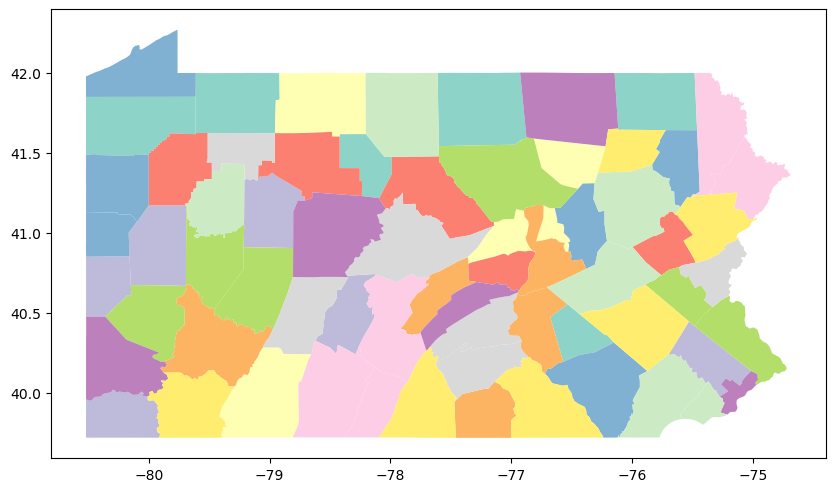

In [49]:
PAMAP = PA.plot(figsize=(10,10), cmap = 'Set3')
PAMAP

In [50]:
PAfull.crs

<Geographic 2D CRS: EPSG:4269>
Name: NAD83
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: North America - NAD83
- bounds: (167.65, 14.92, -47.74, 86.46)
Datum: North American Datum 1983
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

In [51]:
PAfull = PAfull.to_crs(epsg=4326)
print(PAfull.crs)
PAfull.head()

epsg:4326


,STATEFP,COUNTYFP,COUNTYNS,AFFGEOID,GEOID,County,NAMELSAD,STUSPS,State,LSAD,ALAND,AWATER,geometry,Unnamed: 0,StAbbr,STCOU,Quality of Life,Life Expectancy,Median Household Income,Percent Some College,Percent Access to Exercise,Population,Square Miles,Density,QOL_rank,LE_rank,MHI_rank,PSC_rank,PAE_rank,SQM_rank,POP_rank,DEN_rank
0,42,023,01213663,0500000US42023,42023,Cameron,Cameron County,PA,Pennsylvania,06,1026239931,5653230,"POLYGON ((-78.42085 41.61728, -78.20364 41.617...",504,PA,42023,0.446332,78.198679,46151,57.432432,72.448378,4330,398.60,10.863021,2655.0,989.0,2453.0,1669.0,726.0,2569.0,2808.0,2479.0
1,42,117,01209189,0500000US42117,42117,Tioga,Tioga County,PA,Pennsylvania,06,2936765818,8279717,"POLYGON ((-77.61003 41.99952, -77.50531 42.000...",2470,PA,42117,-0.155632,78.373935,47683,53.460540,43.614969,40381,1137.30,35.506023,1037.0,913.0,2305.0,2063.0,2067.0,600.0,1144.0,1690.0
2,42,123,01213691,0500000US42123,42123,Warren,Warren County,PA,Pennsylvania,06,2290280119,37368145,"POLYGON ((-79.61207 41.85033, -79.61084 41.998...",2125,PA,42123,0.137996,78.526161,52729,58.713465,78.060505,38911,897.81,43.339905,2000.0,857.0,1776.0,1534.0,513.0,945.0,1176.0,1500.0
3,42,075,01214034,0500000US42075,42075,Lebanon,Lebanon County,PA,Pennsylvania,06,937148912,1722125,"POLYGON ((-76.67804 40.47472, -76.53541 40.555...",405,PA,42075,0.086999,78.432479,63605,54.719001,80.020664,141663,362.60,390.686707,1848.0,890.0,779.0,1930.0,440.0,2668.0,450.0,266.0
4,42,039,01213666,0500000US42039,42039,Crawford,Crawford County,PA,Pennsylvania,06,2621988043,65389924,"POLYGON ((-80.51937 41.70147, -80.51941 41.739...",2374,PA,42039,0.260158,77.013758,52372,50.043206,67.906269,83697,1037.74,80.653150,2317.0,1466.0,1815.0,2346.0,932.0,696.0,664.0,954.0


In [52]:
PAfull = PAfull.to_crs(epsg=2263)
PAfull['centroid'] = PAfull.centroid

In [53]:
PAfull = PAfull.to_crs(epsg=4326)

PAfull['centroid'] = PAfull['centroid'].to_crs(epsg=4326)

PAfull.head()

,STATEFP,COUNTYFP,COUNTYNS,AFFGEOID,GEOID,County,NAMELSAD,STUSPS,State,LSAD,ALAND,AWATER,geometry,Unnamed: 0,StAbbr,STCOU,Quality of Life,Life Expectancy,Median Household Income,Percent Some College,Percent Access to Exercise,Population,Square Miles,Density,QOL_rank,LE_rank,MHI_rank,PSC_rank,PAE_rank,SQM_rank,POP_rank,DEN_rank,centroid
0,42,023,01213663,0500000US42023,42023,Cameron,Cameron County,PA,Pennsylvania,06,1026239931,5653230,"POLYGON ((-78.42085 41.61728, -78.20364 41.617...",504,PA,42023,0.446332,78.198679,46151,57.432432,72.448378,4330,398.60,10.863021,2655.0,989.0,2453.0,1669.0,726.0,2569.0,2808.0,2479.0,POINT (-78.20404 41.43675)
1,42,117,01209189,0500000US42117,42117,Tioga,Tioga County,PA,Pennsylvania,06,2936765818,8279717,"POLYGON ((-77.61003 41.99952, -77.50531 42.000...",2470,PA,42117,-0.155632,78.373935,47683,53.460540,43.614969,40381,1137.30,35.506023,1037.0,913.0,2305.0,2063.0,2067.0,600.0,1144.0,1690.0,POINT (-77.25482 41.77284)
2,42,123,01213691,0500000US42123,42123,Warren,Warren County,PA,Pennsylvania,06,2290280119,37368145,"POLYGON ((-79.61207 41.85033, -79.61084 41.998...",2125,PA,42123,0.137996,78.526161,52729,58.713465,78.060505,38911,897.81,43.339905,2000.0,857.0,1776.0,1534.0,513.0,945.0,1176.0,1500.0,POINT (-79.27410 41.81384)
3,42,075,01214034,0500000US42075,42075,Lebanon,Lebanon County,PA,Pennsylvania,06,937148912,1722125,"POLYGON ((-76.67804 40.47472, -76.53541 40.555...",405,PA,42075,0.086999,78.432479,63605,54.719001,80.020664,141663,362.60,390.686707,1848.0,890.0,779.0,1930.0,440.0,2668.0,450.0,266.0,POINT (-76.45753 40.36714)
4,42,039,01213666,0500000US42039,42039,Crawford,Crawford County,PA,Pennsylvania,06,2621988043,65389924,"POLYGON ((-80.51937 41.70147, -80.51941 41.739...",2374,PA,42039,0.260158,77.013758,52372,50.043206,67.906269,83697,1037.74,80.653150,2317.0,1466.0,1815.0,2346.0,932.0,696.0,664.0,954.0,POINT (-80.10675 41.68527)


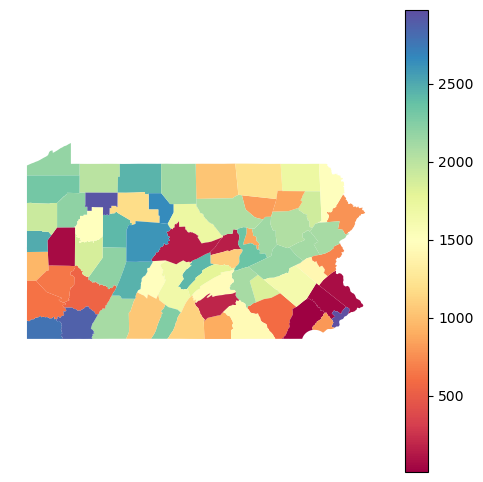

In [54]:
fig, ax = plt.subplots(figsize=(6,6))
PAfull.plot(column = 'QOL_rank', 
              cmap = 'Spectral',  
              legend = True,
              ax = ax)
ax.axis('off');

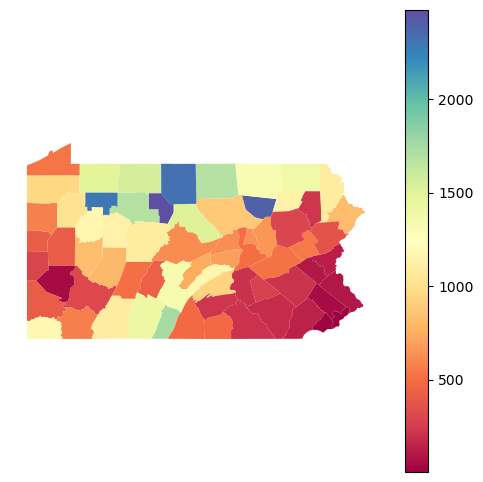

In [55]:
fig, ax = plt.subplots(figsize=(6,6))
PAfull.plot(column = 'DEN_rank', 
              cmap = 'Spectral',  
              legend = True,
              ax = ax)
ax.axis('off');

In [56]:
PAfull.corr()

,ALAND,AWATER,Unnamed: 0,STCOU,Quality of Life,Life Expectancy,Median Household Income,Percent Some College,Percent Access to Exercise,Population,Square Miles,Density,QOL_rank,LE_rank,MHI_rank,PSC_rank,PAE_rank,SQM_rank,POP_rank,DEN_rank
ALAND,1.000000,0.079958,0.972239,-0.032413,-0.052078,0.047883,-0.157985,-0.028982,-0.216124,-0.154745,0.949557,-0.322512,-0.000996,-0.057258,0.213459,0.071315,0.181503,-0.972267,-0.143547,0.230043
AWATER,0.079958,1.000000,0.219082,-0.059464,0.066081,-0.026565,-0.040733,0.069176,0.106386,0.051152,0.388512,-0.022784,0.091111,0.019436,0.032660,-0.082464,-0.114654,-0.218987,-0.131935,-0.071343
Unnamed: 0,0.972239,0.219082,1.000000,-0.054097,-0.051412,0.011786,-0.126542,0.015933,-0.172199,-0.099899,0.967687,-0.297239,0.005338,-0.025628,0.190901,0.025789,0.137837,-1.000000,-0.198879,0.170932
STCOU,-0.032413,-0.059464,-0.054097,1.000000,0.060428,-0.022689,-0.090579,-0.218742,-0.216171,-0.078632,-0.048827,0.052395,0.028514,0.023417,0.028686,0.226189,0.217174,0.054062,0.142380,0.110112
Quality of Life,-0.052078,0.066081,-0.051412,0.060428,1.000000,-0.698940,-0.743263,-0.606722,-0.152043,-0.166325,-0.027362,0.164117,0.966397,0.675689,0.691957,0.561934,0.166460,0.051485,0.298881,0.331280
Life Expectancy,0.047883,-0.026565,0.011786,-0.022689,-0.698940,1.000000,0.576900,0.294533,0.070908,0.061463,0.035729,-0.128369,-0.677549,-0.983935,-0.578468,-0.280892,-0.087432,-0.011832,-0.052376,-0.070993
Median Household Income,-0.157985,-0.040733,-0.126542,-0.090579,-0.743263,0.576900,1.000000,0.627770,0.300917,0.462363,-0.158828,0.145994,-0.677497,-0.577264,-0.899895,-0.602837,-0.290515,0.126581,-0.459319,-0.541114
Percent Some College,-0.028982,0.069176,0.015933,-0.218742,-0.606722,0.294533,0.627770,1.000000,0.567774,0.578759,-0.005099,0.271611,-0.584999,-0.276667,-0.600654,-0.981805,-0.565048,-0.015833,-0.646024,-0.661586
Percent Access to Exercise,-0.216124,0.106386,-0.172199,-0.216171,-0.152043,0.070908,0.300917,0.567774,1.000000,0.602398,-0.166168,0.433245,-0.155970,-0.030069,-0.231359,-0.625516,-0.993520,0.172304,-0.524057,-0.560530
Population,-0.154745,0.051152,-0.099899,-0.078632,-0.166325,0.061463,0.462363,0.578759,0.602398,1.000000,-0.126817,0.800341,-0.219576,-0.056360,-0.407690,-0.573730,-0.541815,0.100081,-0.571538,-0.577873


In [57]:
NH = allcounties.loc[(allcounties['STUSPS'] == 'NH')]
NH

,STATEFP,COUNTYFP,COUNTYNS,AFFGEOID,GEOID,County,NAMELSAD,STUSPS,State,LSAD,ALAND,AWATER,geometry
267,33,007,00873177,0500000US33007,33007,Coos,Coos County,NH,New Hampshire,06,4647924324,92545557,"POLYGON ((-71.76498 44.40659, -71.76197 44.407..."
670,33,009,00873178,0500000US33009,33009,Grafton,Grafton County,NH,New Hampshire,06,4425249894,106463952,"POLYGON ((-72.33440 43.61925, -72.33236 43.625..."
1149,33,011,00873179,0500000US33011,33011,Hillsborough,Hillsborough County,NH,New Hampshire,06,2270191096,41320770,"POLYGON ((-72.05795 43.01892, -72.04197 43.082..."
1150,33,019,00873183,0500000US33019,33019,Sullivan,Sullivan County,NH,New Hampshire,06,1393091317,36932078,"POLYGON ((-72.45256 43.17212, -72.44490 43.177..."
2021,33,001,00873174,0500000US33001,33001,Belknap,Belknap County,NH,New Hampshire,06,1040779615,176541257,"POLYGON ((-71.73171 43.59006, -71.70770 43.601..."
2260,33,005,00873176,0500000US33005,33005,Cheshire,Cheshire County,NH,New Hampshire,06,1830367250,57589052,"POLYGON ((-72.55506 42.85812, -72.55423 42.860..."
2429,33,003,00873175,0500000US33003,33003,Carroll,Carroll County,NH,New Hampshire,06,2413515434,159620276,"POLYGON ((-71.56460 43.89317, -71.36196 43.915..."
2661,33,015,00873181,0500000US33015,33015,Rockingham,Rockingham County,NH,New Hampshire,06,1801055122,258626550,"POLYGON ((-71.45115 42.93090, -71.37719 42.947..."
3033,33,013,00873180,0500000US33013,33013,Merrimack,Merrimack County,NH,New Hampshire,06,2416197730,57178203,"POLYGON ((-72.09015 43.32255, -72.05159 43.376..."
3089,33,017,00873182,0500000US33017,33017,Strafford,Strafford County,NH,New Hampshire,06,951743430,39154073,"POLYGON ((-71.23601 43.28499, -71.20757 43.308..."


In [58]:
NHfull = pd.merge(left = NH, right = contiguous, how='inner',
                    on = ('County', 'State'))
NHfull

,STATEFP,COUNTYFP,COUNTYNS,AFFGEOID,GEOID,County,NAMELSAD,STUSPS,State,LSAD,ALAND,AWATER,geometry,Unnamed: 0,StAbbr,STCOU,Quality of Life,Life Expectancy,Median Household Income,Percent Some College,Percent Access to Exercise,Population,Square Miles,Density,QOL_rank,LE_rank,MHI_rank,PSC_rank,PAE_rank,SQM_rank,POP_rank,DEN_rank
0,33,007,00873177,0500000US33007,33007,Coos,Coos County,NH,New Hampshire,06,4647924324,92545557,"POLYGON ((-71.76498 44.40659, -71.76197 44.407...",2741,NH,33007,0.884315,77.230641,49465,51.252159,59.848737,31174,1831.44,17.021579,2956.0,1391.0,2131.0,2238.0,1307.0,329.0,1370.0,2275.0
1,33,009,00873178,0500000US33009,33009,Grafton,Grafton County,NH,New Hampshire,06,4425249894,106463952,"POLYGON ((-72.33440 43.61925, -72.33236 43.625...",2718,NH,33009,0.001879,80.666413,77022,69.486345,78.299558,90691,1750.08,51.821060,1569.0,287.0,251.0,585.0,503.0,352.0,636.0,1330.0
2,33,011,00873179,0500000US33011,33011,Hillsborough,Hillsborough County,NH,New Hampshire,06,2270191096,41320770,"POLYGON ((-72.05795 43.01892, -72.04197 43.082...",2109,NH,33011,-0.097448,79.419881,79222,72.193192,77.583406,418735,892.20,469.328626,1222.0,570.0,220.0,386.0,529.0,961.0,168.0,217.0
3,33,019,00873183,0500000US33019,33019,Sullivan,Sullivan County,NH,New Hampshire,06,1393091317,36932078,"POLYGON ((-72.45256 43.17212, -72.44490 43.177...",1105,NH,33019,0.397491,79.697995,65881,56.715494,64.064286,43267,551.92,78.393608,2581.0,495.0,634.0,1747.0,1104.0,1967.0,1087.0,978.0
4,33,001,00873174,0500000US33001,33001,Belknap,Belknap County,NH,New Hampshire,06,1040779615,176541257,"POLYGON ((-71.73171 43.59006, -71.70770 43.601...",820,NH,33001,0.235979,77.070992,76105,64.748366,64.507056,61551,468.55,131.364849,2257.0,1444.0,269.0,979.0,1078.0,2252.0,839.0,663.0
5,33,005,00873176,0500000US33005,33005,Cheshire,Cheshire County,NH,New Hampshire,06,1830367250,57589052,"POLYGON ((-72.55506 42.85812, -72.55423 42.860...",1778,NH,33005,-0.324123,79.559125,66398,66.882582,57.700637,76228,729.15,104.543647,578.0,531.0,598.0,787.0,1420.0,1293.0,709.0,776.0
6,33,003,00873175,0500000US33003,33003,Carroll,Carroll County,NH,New Hampshire,06,2413515434,159620276,"POLYGON ((-71.56460 43.89317, -71.36196 43.915...",2322,NH,33003,-0.260646,79.706625,73073,69.774201,64.827053,49167,992.24,49.551520,736.0,491.0,340.0,568.0,1062.0,748.0,980.0,1361.0
7,33,015,00873181,0500000US33015,33015,Rockingham,Rockingham County,NH,New Hampshire,06,1801055122,258626550,"POLYGON ((-71.45115 42.93090, -71.37719 42.947...",1911,NH,33015,-0.598918,80.786546,96775,75.438838,77.216545,311307,793.96,392.094060,165.0,263.0,64.0,232.0,542.0,1159.0,223.0,262.0
8,33,013,00873180,0500000US33013,33013,Merrimack,Merrimack County,NH,New Hampshire,06,2416197730,57178203,"POLYGON ((-72.09015 43.32255, -72.05159 43.376...",2274,NH,33013,-0.260541,79.472618,81132,70.004981,77.346444,152622,956.49,159.564658,737.0,546.0,187.0,547.0,536.0,796.0,427.0,578.0
9,33,017,00873182,0500000US33017,33017,Strafford,Strafford County,NH,New Hampshire,06,951743430,39154073,"POLYGON ((-71.23601 43.28499, -71.20757 43.308...",463,NH,33017,0.022014,78.207029,72817,71.731471,72.109661,131533,383.91,342.614154,1636.0,984.0,352.0,423.0,746.0,2610.0,473.0,300.0


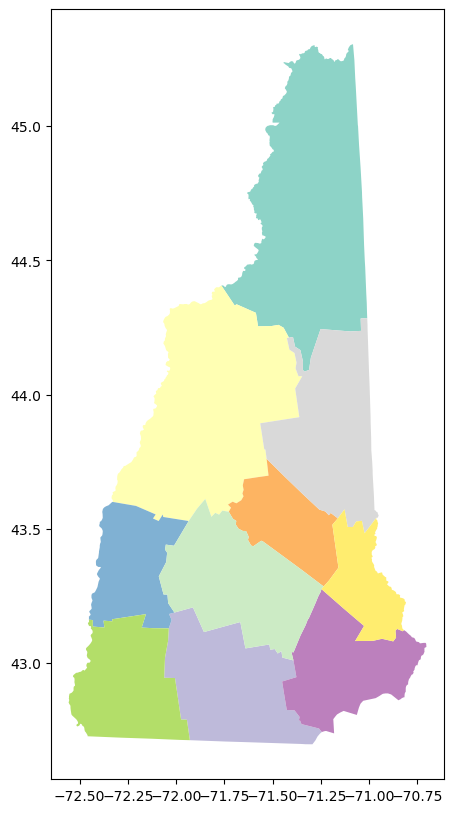

In [59]:
NHMAP = NH.plot(figsize=(10,10), cmap = 'Set3')

In [60]:
NHfull.crs

<Geographic 2D CRS: EPSG:4269>
Name: NAD83
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: North America - NAD83
- bounds: (167.65, 14.92, -47.74, 86.46)
Datum: North American Datum 1983
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

In [61]:
NHfull = NHfull.to_crs(epsg=4326)
print(NHfull.crs)
NHfull.head()

epsg:4326


,STATEFP,COUNTYFP,COUNTYNS,AFFGEOID,GEOID,County,NAMELSAD,STUSPS,State,LSAD,ALAND,AWATER,geometry,Unnamed: 0,StAbbr,STCOU,Quality of Life,Life Expectancy,Median Household Income,Percent Some College,Percent Access to Exercise,Population,Square Miles,Density,QOL_rank,LE_rank,MHI_rank,PSC_rank,PAE_rank,SQM_rank,POP_rank,DEN_rank
0,33,007,00873177,0500000US33007,33007,Coos,Coos County,NH,New Hampshire,06,4647924324,92545557,"POLYGON ((-71.76498 44.40659, -71.76197 44.407...",2741,NH,33007,0.884315,77.230641,49465,51.252159,59.848737,31174,1831.44,17.021579,2956.0,1391.0,2131.0,2238.0,1307.0,329.0,1370.0,2275.0
1,33,009,00873178,0500000US33009,33009,Grafton,Grafton County,NH,New Hampshire,06,4425249894,106463952,"POLYGON ((-72.33440 43.61925, -72.33236 43.625...",2718,NH,33009,0.001879,80.666413,77022,69.486345,78.299558,90691,1750.08,51.821060,1569.0,287.0,251.0,585.0,503.0,352.0,636.0,1330.0
2,33,011,00873179,0500000US33011,33011,Hillsborough,Hillsborough County,NH,New Hampshire,06,2270191096,41320770,"POLYGON ((-72.05795 43.01892, -72.04197 43.082...",2109,NH,33011,-0.097448,79.419881,79222,72.193192,77.583406,418735,892.20,469.328626,1222.0,570.0,220.0,386.0,529.0,961.0,168.0,217.0
3,33,019,00873183,0500000US33019,33019,Sullivan,Sullivan County,NH,New Hampshire,06,1393091317,36932078,"POLYGON ((-72.45256 43.17212, -72.44490 43.177...",1105,NH,33019,0.397491,79.697995,65881,56.715494,64.064286,43267,551.92,78.393608,2581.0,495.0,634.0,1747.0,1104.0,1967.0,1087.0,978.0
4,33,001,00873174,0500000US33001,33001,Belknap,Belknap County,NH,New Hampshire,06,1040779615,176541257,"POLYGON ((-71.73171 43.59006, -71.70770 43.601...",820,NH,33001,0.235979,77.070992,76105,64.748366,64.507056,61551,468.55,131.364849,2257.0,1444.0,269.0,979.0,1078.0,2252.0,839.0,663.0


In [62]:
NHfull = NHfull.to_crs(epsg=2263)
NHfull['centroid'] = NHfull.centroid

In [63]:
NHfull = NHfull.to_crs(epsg=4326)

NHfull['centroid'] = NHfull['centroid'].to_crs(epsg=4326)

NHfull.head()

,STATEFP,COUNTYFP,COUNTYNS,AFFGEOID,GEOID,County,NAMELSAD,STUSPS,State,LSAD,ALAND,AWATER,geometry,Unnamed: 0,StAbbr,STCOU,Quality of Life,Life Expectancy,Median Household Income,Percent Some College,Percent Access to Exercise,Population,Square Miles,Density,QOL_rank,LE_rank,MHI_rank,PSC_rank,PAE_rank,SQM_rank,POP_rank,DEN_rank,centroid
0,33,007,00873177,0500000US33007,33007,Coos,Coos County,NH,New Hampshire,06,4647924324,92545557,"POLYGON ((-71.76498 44.40659, -71.76197 44.407...",2741,NH,33007,0.884315,77.230641,49465,51.252159,59.848737,31174,1831.44,17.021579,2956.0,1391.0,2131.0,2238.0,1307.0,329.0,1370.0,2275.0,POINT (-71.30607 44.68805)
1,33,009,00873178,0500000US33009,33009,Grafton,Grafton County,NH,New Hampshire,06,4425249894,106463952,"POLYGON ((-72.33440 43.61925, -72.33236 43.625...",2718,NH,33009,0.001879,80.666413,77022,69.486345,78.299558,90691,1750.08,51.821060,1569.0,287.0,251.0,585.0,503.0,352.0,636.0,1330.0,POINT (-71.82150 43.93991)
2,33,011,00873179,0500000US33011,33011,Hillsborough,Hillsborough County,NH,New Hampshire,06,2270191096,41320770,"POLYGON ((-72.05795 43.01892, -72.04197 43.082...",2109,NH,33011,-0.097448,79.419881,79222,72.193192,77.583406,418735,892.20,469.328626,1222.0,570.0,220.0,386.0,529.0,961.0,168.0,217.0,POINT (-71.71615 42.91525)
3,33,019,00873183,0500000US33019,33019,Sullivan,Sullivan County,NH,New Hampshire,06,1393091317,36932078,"POLYGON ((-72.45256 43.17212, -72.44490 43.177...",1105,NH,33019,0.397491,79.697995,65881,56.715494,64.064286,43267,551.92,78.393608,2581.0,495.0,634.0,1747.0,1104.0,1967.0,1087.0,978.0,POINT (-72.22208 43.36141)
4,33,001,00873174,0500000US33001,33001,Belknap,Belknap County,NH,New Hampshire,06,1040779615,176541257,"POLYGON ((-71.73171 43.59006, -71.70770 43.601...",820,NH,33001,0.235979,77.070992,76105,64.748366,64.507056,61551,468.55,131.364849,2257.0,1444.0,269.0,979.0,1078.0,2252.0,839.0,663.0,POINT (-71.42199 43.51767)


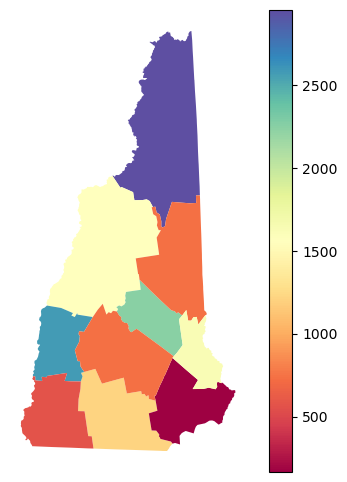

In [64]:
fig, ax = plt.subplots(figsize=(6,6))
NHfull.plot(column = 'QOL_rank', 
              cmap = 'Spectral',  
              legend = True,
              ax = ax)
ax.axis('off');

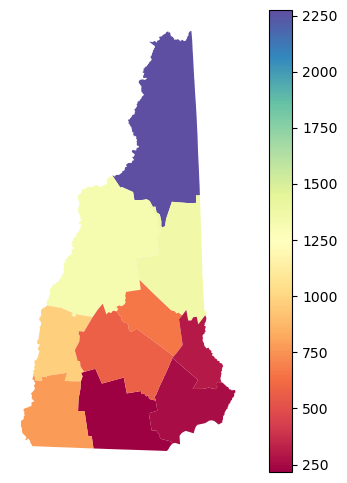

In [65]:
fig, ax = plt.subplots(figsize=(6,6))
NHfull.plot(column = 'DEN_rank', 
              cmap = 'Spectral',  
              legend = True,
              ax = ax)
ax.axis('off');

In [66]:
NHfull.corr()

,ALAND,AWATER,Unnamed: 0,STCOU,Quality of Life,Life Expectancy,Median Household Income,Percent Some College,Percent Access to Exercise,Population,Square Miles,Density,QOL_rank,LE_rank,MHI_rank,PSC_rank,PAE_rank,SQM_rank,POP_rank,DEN_rank
ALAND,1.000000,-0.020036,0.870594,-0.230182,0.367278,0.080259,-0.370625,-0.343070,0.060584,-0.157994,0.998418,-0.439863,0.223949,-0.026435,0.550765,0.345894,-0.040686,-0.870401,0.330775,0.757888
AWATER,-0.020036,1.000000,0.113968,-0.313630,-0.336952,0.155225,0.519426,0.281652,0.106629,0.102033,0.036192,0.057241,-0.318438,-0.055102,-0.210895,-0.242676,-0.114586,-0.114230,-0.084025,-0.018590
Unnamed: 0,0.870594,0.113968,1.000000,-0.275344,-0.017440,0.352055,-0.091553,-0.076642,0.160519,0.080896,0.876455,-0.292230,-0.183423,-0.319893,0.299679,0.083562,-0.137302,-1.000000,0.099567,0.548008
STCOU,-0.230182,-0.313630,-0.275344,1.000000,-0.064114,0.354117,0.233692,0.106019,0.449134,0.324837,-0.247208,0.439037,0.002911,-0.374561,-0.158495,-0.060932,-0.451766,0.275342,-0.335424,-0.382711
Quality of Life,0.367278,-0.336952,-0.017440,-0.064114,1.000000,-0.688158,-0.814567,-0.897035,-0.466068,-0.494765,0.348048,-0.463580,0.971654,0.701699,0.799699,0.891001,0.459146,0.017754,0.755635,0.669672
Life Expectancy,0.080259,0.155225,0.352055,0.354117,-0.688158,1.000000,0.578044,0.536988,0.504865,0.360582,0.088741,0.174967,-0.662552,-0.990494,-0.543933,-0.515822,-0.490509,-0.352207,-0.470975,-0.270792
Median Household Income,-0.370625,0.519426,-0.091553,0.233692,-0.814567,0.578044,1.000000,0.861149,0.751548,0.648226,-0.341094,0.623507,-0.713553,-0.547622,-0.859403,-0.834403,-0.754671,0.091179,-0.831235,-0.750727
Percent Some College,-0.343070,0.281652,-0.076642,0.106019,-0.897035,0.536988,0.861149,1.000000,0.690256,0.624198,-0.326885,0.650449,-0.835617,-0.542765,-0.855609,-0.996419,-0.690147,0.076356,-0.885106,-0.750837
Percent Access to Exercise,0.060584,0.106629,0.160519,0.449134,-0.466068,0.504865,0.751548,0.690256,1.000000,0.683809,0.066881,0.599562,-0.402320,-0.482717,-0.611148,-0.667435,-0.999093,-0.160716,-0.789723,-0.518594
Population,-0.157994,0.102033,0.080896,0.324837,-0.494765,0.360582,0.648226,0.624198,0.683809,1.000000,-0.152255,0.908105,-0.480872,-0.363208,-0.443124,-0.587237,-0.674700,-0.081238,-0.841708,-0.664134


In [67]:
TX = allcounties.loc[(allcounties['STUSPS'] == 'TX')]
TXfull = pd.merge(left = TX, right = contiguous, how='inner',
                    on = ('County', 'State'))

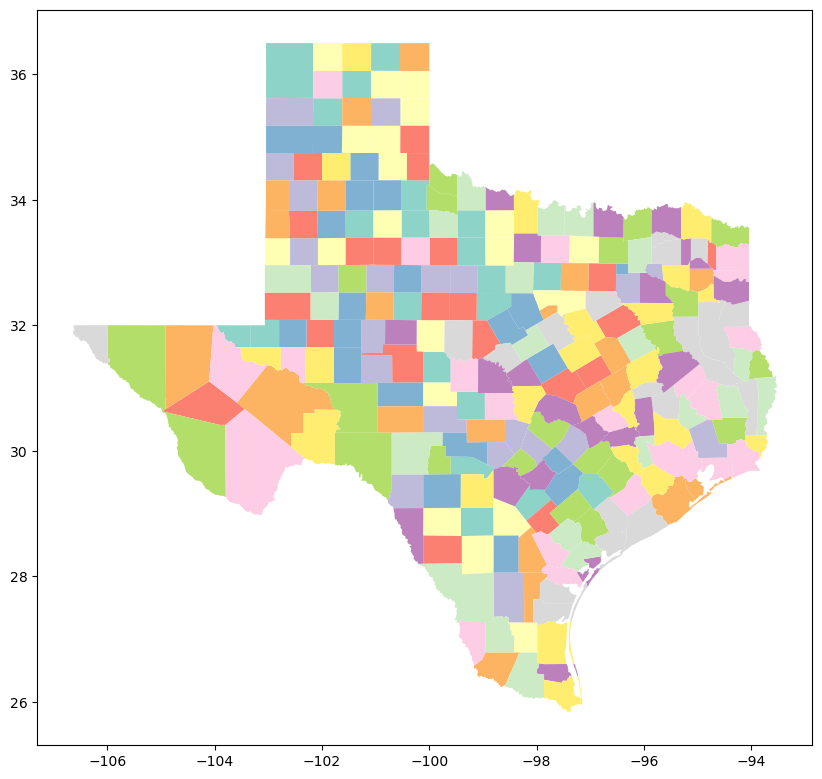

In [68]:
TXMAP = TX.plot(figsize=(10,10), cmap = 'Set3')

In [69]:
TXfull.crs
TXfull = TXfull.to_crs(epsg=4326)

In [70]:
TXfull = TXfull.to_crs(epsg=2263)
TXfull['centroid'] = TXfull.centroid

In [71]:
TXfull = TXfull.to_crs(epsg=4326)

TXfull['centroid'] = TXfull['centroid'].to_crs(epsg=4326)

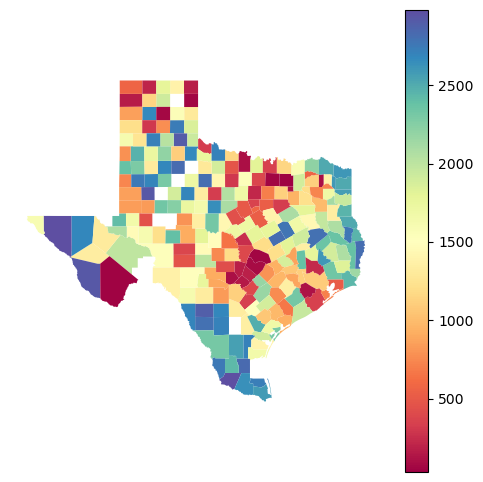

In [72]:
fig, ax = plt.subplots(figsize=(6,6))
TXfull.plot(column = 'QOL_rank', 
              cmap = 'Spectral',  
              legend = True,
              ax = ax)
ax.axis('off');

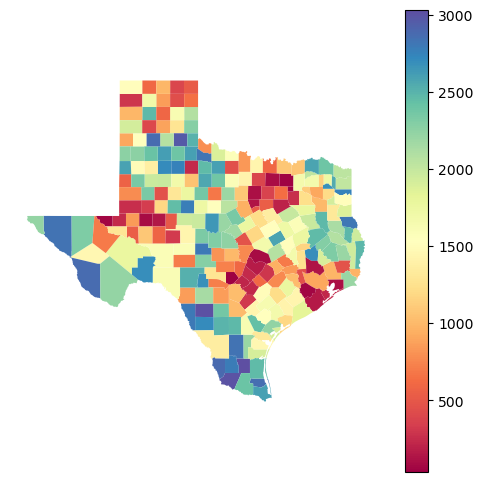

In [176]:
fig, ax = plt.subplots(figsize=(6,6))
TXfull.plot(column = 'MHI_rank', 
              cmap = 'Spectral',  
              legend = True,
              ax = ax)
ax.axis('off');

In [74]:
TXfull.corr()

,ALAND,AWATER,Unnamed: 0,STCOU,Quality of Life,Life Expectancy,Median Household Income,Percent Some College,Percent Access to Exercise,Population,Square Miles,Density,QOL_rank,LE_rank,MHI_rank,PSC_rank,PAE_rank,SQM_rank,POP_rank,DEN_rank
ALAND,1.000000,-0.082886,0.611668,0.000798,0.100280,0.242333,-0.167155,-0.124794,0.066311,0.030969,0.993041,-0.036745,0.082637,-0.193755,0.163497,0.087808,-0.085523,-0.611359,0.125926,0.264665
AWATER,-0.082886,1.000000,0.065915,-0.074070,-0.003143,0.025748,0.024466,-0.010415,0.067740,0.089136,0.035028,0.083543,0.000231,-0.036546,0.004115,-0.060559,-0.082884,-0.065874,-0.211399,-0.187452
Unnamed: 0,0.611668,0.065915,1.000000,-0.037173,0.128709,0.114307,-0.159273,-0.146017,0.059230,0.093406,0.621135,-0.005701,0.114200,-0.104465,0.132656,0.113155,-0.067653,-1.000000,0.054936,0.266455
STCOU,0.000798,-0.074070,-0.037173,1.000000,0.065771,-0.042122,-0.014923,-0.050475,-0.025532,-0.054620,-0.008095,-0.048994,0.057830,0.056644,0.008304,0.074346,0.019093,0.037200,-0.008978,-0.005747
Quality of Life,0.100280,-0.003143,0.128709,0.065771,1.000000,-0.459485,-0.711897,-0.506035,-0.223315,-0.165810,0.100508,-0.225991,0.981422,0.513221,0.711024,0.518638,0.236732,-0.128774,0.213828,0.263051
Life Expectancy,0.242333,0.025748,0.114307,-0.042122,-0.459485,1.000000,0.459567,0.324871,0.220126,0.243410,0.246619,0.276815,-0.487145,-0.976137,-0.415856,-0.368051,-0.233918,-0.114139,-0.147648,-0.163857
Median Household Income,-0.167155,0.024466,-0.159273,-0.014923,-0.711897,0.459567,1.000000,0.464899,0.335538,0.213647,-0.164675,0.299385,-0.692368,-0.506706,-0.933658,-0.484722,-0.339026,0.159287,-0.326996,-0.373756
Percent Some College,-0.124794,-0.010415,-0.146017,-0.050475,-0.506035,0.324871,0.464899,1.000000,0.263222,0.238394,-0.126497,0.299419,-0.491242,-0.334430,-0.404439,-0.948138,-0.268292,0.146020,-0.291126,-0.347624
Percent Access to Exercise,0.066311,0.067740,0.059230,-0.025532,-0.223315,0.220126,0.335538,0.263222,1.000000,0.311433,0.074555,0.359931,-0.198586,-0.231403,-0.285495,-0.251904,-0.983719,-0.059210,-0.396961,-0.390407
Population,0.030969,0.089136,0.093406,-0.054620,-0.165810,0.243410,0.213647,0.238394,0.311433,1.000000,0.041456,0.941304,-0.162967,-0.272707,-0.198924,-0.273167,-0.311352,-0.093400,-0.431508,-0.465800


In [75]:
AZ = allcounties.loc[(allcounties['STUSPS'] == 'AZ')]
AZfull = pd.merge(left = AZ, right = contiguous, how='inner',
                    on = ('County', 'State'))

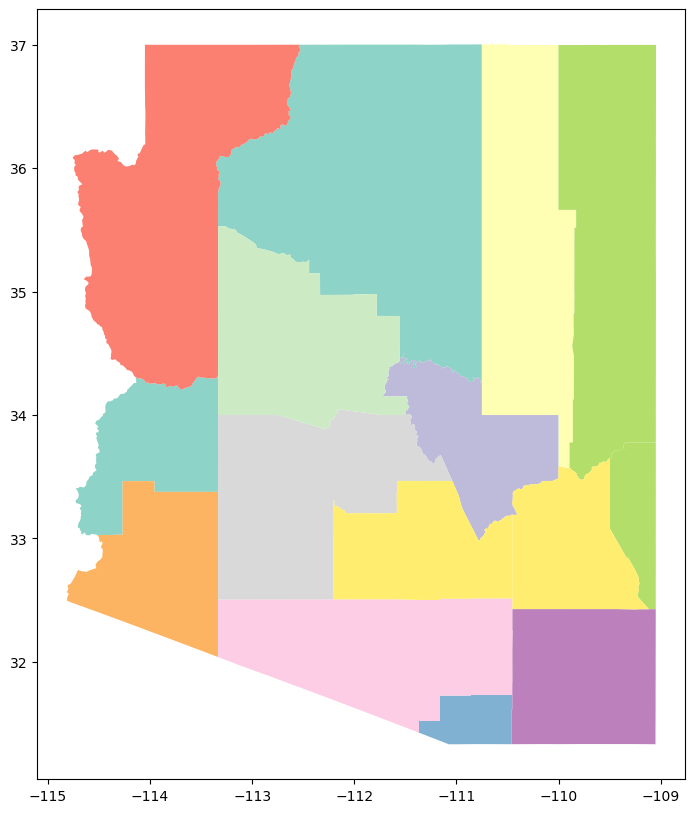

In [76]:
AZMAP = AZ.plot(figsize=(10,10), cmap = 'Set3')

In [77]:
AZfull.crs
AZfull = AZfull.to_crs(epsg=4326)

In [78]:
AZfull = AZfull.to_crs(epsg=2263)
AZfull['centroid'] = AZfull.centroid

In [79]:
AZfull = AZfull.to_crs(epsg=4326)

AZfull['centroid'] = AZfull['centroid'].to_crs(epsg=4326)

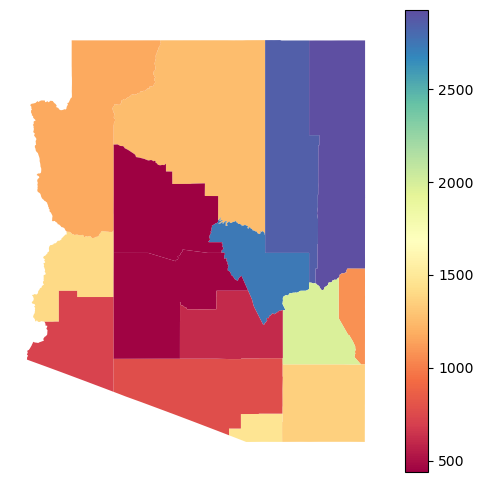

In [80]:
fig, ax = plt.subplots(figsize=(6,6))
AZfull.plot(column = 'QOL_rank', 
              cmap = 'Spectral',  
              legend = True,
              ax = ax)
ax.axis('off');

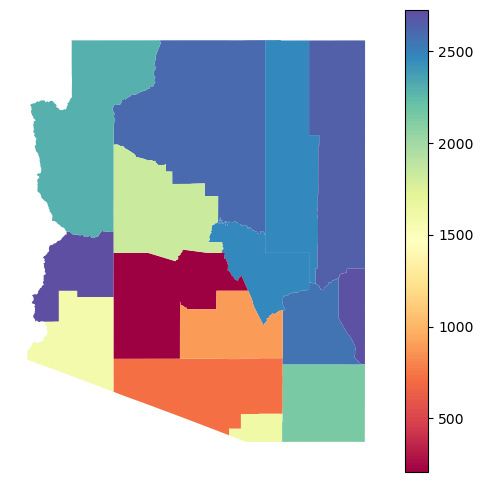

In [81]:
fig, ax = plt.subplots(figsize=(6,6))
AZfull.plot(column = 'DEN_rank', 
              cmap = 'Spectral',  
              legend = True,
              ax = ax)
ax.axis('off');

In [82]:
AZfull.corr()

,ALAND,AWATER,Unnamed: 0,STCOU,Quality of Life,Life Expectancy,Median Household Income,Percent Some College,Percent Access to Exercise,Population,Square Miles,Density,QOL_rank,LE_rank,MHI_rank,PSC_rank,PAE_rank,SQM_rank,POP_rank,DEN_rank
ALAND,1.000000,0.537366,0.647247,-0.286888,0.089677,-0.364697,-0.075341,0.457923,0.148463,0.138813,0.999979,0.073934,0.038960,0.355716,0.042830,-0.461866,-0.198617,-0.647247,-0.527973,0.057288
AWATER,0.537366,1.000000,0.284717,-0.214204,0.052975,-0.292625,-0.187519,-0.096529,-0.044371,-0.008628,0.542776,-0.055234,0.065490,0.375082,0.218248,0.122578,0.047154,-0.284717,-0.168607,0.218854
Unnamed: 0,0.647247,0.284717,1.000000,-0.227568,0.073798,-0.404485,0.034372,0.165897,0.187899,0.199417,0.646757,0.144700,0.025791,0.402934,-0.068318,-0.190439,-0.225398,-1.000000,-0.564866,-0.060744
STCOU,-0.286888,-0.214204,-0.227568,1.000000,-0.525460,0.518407,0.237877,-0.070017,0.434533,0.055334,-0.287326,0.108344,-0.540652,-0.499300,-0.222991,0.088507,-0.407103,0.227568,-0.283156,-0.509604
Quality of Life,0.089677,0.052975,0.073798,-0.525460,1.000000,-0.891447,-0.673520,-0.333184,-0.529112,-0.370684,0.089710,-0.398078,0.988193,0.875194,0.664518,0.386095,0.481449,-0.073798,0.220567,0.587489
Life Expectancy,-0.364697,-0.292625,-0.404485,0.518407,-0.891447,1.000000,0.622698,0.242051,0.379130,0.230937,-0.365439,0.290845,-0.861313,-0.989267,-0.609542,-0.276585,-0.326909,0.404485,-0.017566,-0.534980
Median Household Income,-0.075341,-0.187519,0.034372,0.237877,-0.673520,0.622698,1.000000,0.457054,0.551277,0.552388,-0.076574,0.571679,-0.675884,-0.622021,-0.991654,-0.446124,-0.511031,-0.034372,-0.137215,-0.561784
Percent Some College,0.457923,-0.096529,0.165897,-0.070017,-0.333184,0.242051,0.457054,1.000000,0.592315,0.406953,0.455232,0.393388,-0.363137,-0.286616,-0.485596,-0.986395,-0.623949,-0.165897,-0.544101,-0.460156
Percent Access to Exercise,0.148463,-0.044371,0.187899,0.434533,-0.529112,0.379130,0.551277,0.592315,1.000000,0.445456,0.147419,0.450488,-0.516809,-0.350587,-0.533153,-0.593028,-0.993241,-0.187899,-0.554978,-0.593474
Population,0.138813,-0.008628,0.199417,0.055334,-0.370684,0.230937,0.552388,0.406953,0.445456,1.000000,0.138023,0.994667,-0.405275,-0.262119,-0.498034,-0.442324,-0.435044,-0.199417,-0.409889,-0.738449


In [83]:
CA = allcounties.loc[(allcounties['STUSPS'] == 'CA')]
CAfull = pd.merge(left = CA, right = contiguous, how='inner',
                    on = ('County', 'State'))

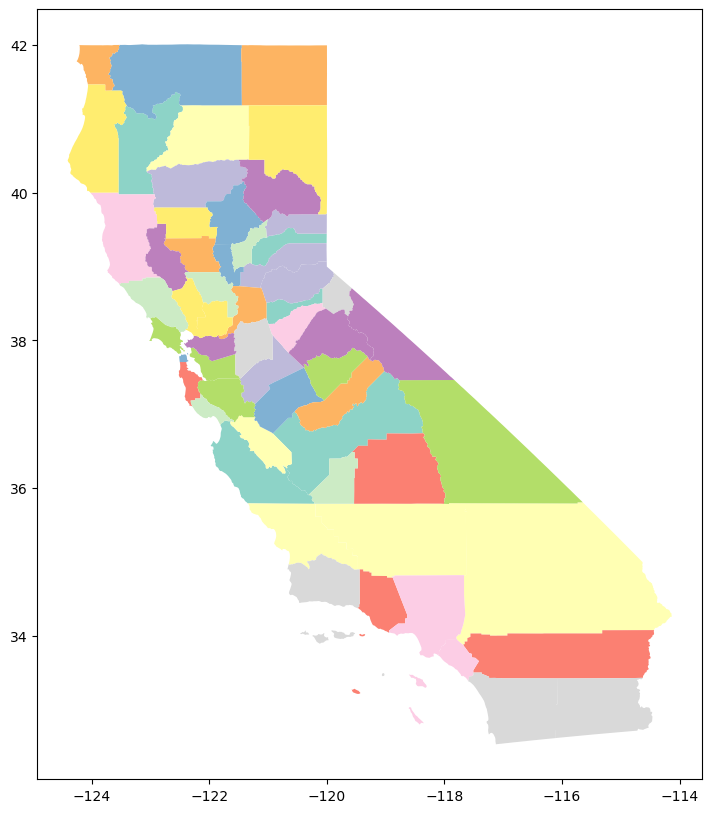

In [84]:
CAMAP = CA.plot(figsize=(10,10), cmap = 'Set3')

In [85]:
CAfull = CAfull.to_crs(epsg=2263)
CAfull['centroid'] = CAfull.centroid
CAfull = CAfull.to_crs(epsg=4326)
CAfull['centroid'] = CAfull['centroid'].to_crs(epsg=4326)

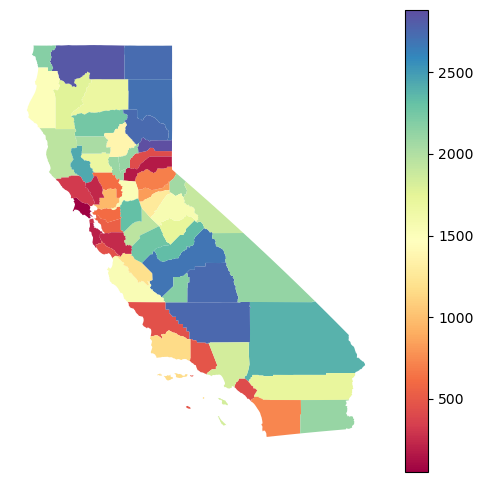

In [86]:
fig, ax = plt.subplots(figsize=(6,6))
CAfull.plot(column = 'QOL_rank', 
              cmap = 'Spectral',  
              legend = True,
              ax = ax)
ax.axis('off');

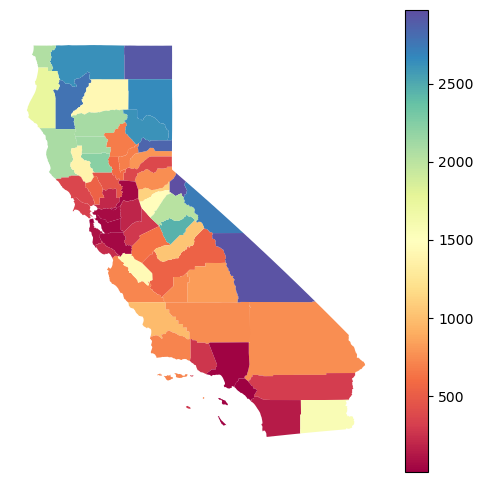

In [87]:
fig, ax = plt.subplots(figsize=(6,6))
CAfull.plot(column = 'DEN_rank', 
              cmap = 'Spectral',  
              legend = True,
              ax = ax)
ax.axis('off');

In [88]:
CAfull.corr()

,ALAND,AWATER,Unnamed: 0,STCOU,Quality of Life,Life Expectancy,Median Household Income,Percent Some College,Percent Access to Exercise,Population,Square Miles,Density,QOL_rank,LE_rank,MHI_rank,PSC_rank,PAE_rank,SQM_rank,POP_rank,DEN_rank
ALAND,1.000000,0.033547,0.521064,-0.001403,0.403835,-0.194987,-0.292240,-0.246785,-0.122993,0.193341,0.998092,-0.205042,0.410902,0.279988,0.208567,0.236804,0.102666,-0.520817,-0.055962,0.157492
AWATER,0.033547,1.000000,0.188084,0.010915,-0.188744,0.152905,0.179917,0.101506,0.241870,0.365592,0.095184,0.138836,-0.188829,-0.249663,-0.124239,-0.111928,-0.213018,-0.187957,-0.246536,-0.156355
Unnamed: 0,0.521064,0.188084,1.000000,-0.021333,0.440137,-0.186483,-0.451217,-0.415522,-0.224677,0.105968,0.530632,-0.474386,0.441392,0.308594,0.338413,0.348119,0.201772,-1.000000,0.041563,0.317044
STCOU,-0.001403,0.010915,-0.021333,1.000000,-0.059198,-0.018518,0.120648,0.233951,0.135012,-0.028952,-0.000712,0.011324,-0.080696,0.054152,-0.157382,-0.246717,-0.136411,0.021481,-0.178830,-0.168671
Quality of Life,0.403835,-0.188744,0.440137,-0.059198,1.000000,-0.464623,-0.795716,-0.694918,-0.599729,-0.105863,0.390578,-0.411430,0.987394,0.665915,0.657091,0.673135,0.550403,-0.439917,0.442910,0.574251
Life Expectancy,-0.194987,0.152905,-0.186483,-0.018518,-0.464623,1.000000,0.562144,0.404902,0.231295,0.110624,-0.184849,0.256200,-0.465956,-0.714056,-0.566917,-0.391973,-0.210372,0.186381,-0.033799,-0.164397
Median Household Income,-0.292240,0.179917,-0.451217,0.120648,-0.795716,0.562144,1.000000,0.684790,0.596652,0.236519,-0.279965,0.595445,-0.798972,-0.727053,-0.804019,-0.625071,-0.531072,0.451026,-0.487479,-0.639612
Percent Some College,-0.246785,0.101506,-0.415522,0.233951,-0.694918,0.404902,0.684790,1.000000,0.445699,0.184858,-0.239493,0.514550,-0.723607,-0.512225,-0.492103,-0.984050,-0.405077,0.415421,-0.295713,-0.414593
Percent Access to Exercise,-0.122993,0.241870,-0.224677,0.135012,-0.599729,0.231295,0.596652,0.445699,1.000000,0.359451,-0.107559,0.481831,-0.585965,-0.317524,-0.542770,-0.412379,-0.986001,0.224621,-0.698427,-0.739902
Population,0.193341,0.365592,0.105968,-0.028952,-0.105863,0.110624,0.236519,0.184858,0.359451,1.000000,0.215206,0.554118,-0.107309,-0.241199,-0.295218,-0.192018,-0.318035,-0.105945,-0.366294,-0.423143


In [89]:
CO = allcounties.loc[(allcounties['STUSPS'] == 'CO')]
COfull = pd.merge(left = CO, right = contiguous, how='inner',
                    on = ('County', 'State'))
COfull.corr()

,ALAND,AWATER,Unnamed: 0,STCOU,Quality of Life,Life Expectancy,Median Household Income,Percent Some College,Percent Access to Exercise,Population,Square Miles,Density,QOL_rank,LE_rank,MHI_rank,PSC_rank,PAE_rank,SQM_rank,POP_rank,DEN_rank
ALAND,1.000000,0.323006,0.746295,0.275007,0.104055,-0.188484,-0.139116,-0.309535,-0.182995,-0.082320,0.999967,-0.279868,0.129007,0.121654,0.055239,0.327053,0.140256,-0.746110,-0.070187,0.250704
AWATER,0.323006,1.000000,0.328607,0.013361,-0.025500,0.062864,0.081915,-0.129983,0.166411,0.219478,0.330428,-0.086549,-0.052946,-0.087923,-0.156964,0.090094,-0.198552,-0.328567,-0.323721,-0.207148
Unnamed: 0,0.746295,0.328607,1.000000,0.110254,0.177578,-0.211165,-0.223501,-0.346040,-0.281018,-0.120128,0.747006,-0.474357,0.178405,0.249461,0.185141,0.350769,0.239514,-1.000000,-0.032574,0.326927
STCOU,0.275007,0.013361,0.110254,1.000000,-0.060143,0.146899,-0.036877,0.027071,-0.008661,-0.245381,0.274022,-0.233497,-0.003694,-0.028232,-0.052528,-0.030332,-0.014848,-0.110089,0.140899,0.248837
Quality of Life,0.104055,-0.025500,0.177578,-0.060143,1.000000,-0.609874,-0.805139,-0.559517,-0.532751,-0.341741,0.103205,-0.253484,0.964180,0.704298,0.794426,0.534684,0.505548,-0.177509,0.497960,0.497698
Life Expectancy,-0.188484,0.062864,-0.211165,0.146899,-0.609874,1.000000,0.666449,0.482609,0.419620,-0.015192,-0.187573,-0.005442,-0.650313,-0.824940,-0.688919,-0.511002,-0.400663,0.211164,-0.133965,-0.159726
Median Household Income,-0.139116,0.081915,-0.223501,-0.036877,-0.805139,0.666449,1.000000,0.549801,0.482926,0.390423,-0.137696,0.283946,-0.826121,-0.740561,-0.894990,-0.524393,-0.455363,0.223398,-0.553967,-0.592980
Percent Some College,-0.309535,-0.129983,-0.346040,0.027071,-0.559517,0.482609,0.549801,1.000000,0.300588,0.244561,-0.309593,0.227148,-0.593379,-0.510379,-0.516179,-0.974592,-0.270457,0.345987,-0.179394,-0.315074
Percent Access to Exercise,-0.182995,0.166411,-0.281018,-0.008661,-0.532751,0.419620,0.482926,0.300588,1.000000,0.412243,-0.180787,0.300346,-0.524490,-0.451365,-0.549822,-0.321919,-0.989552,0.280949,-0.483246,-0.510695
Population,-0.082320,0.219478,-0.120128,-0.245381,-0.341741,-0.015192,0.390423,0.244561,0.412243,1.000000,-0.079483,0.588609,-0.374604,-0.167809,-0.395879,-0.251388,-0.392725,0.120118,-0.755859,-0.829855


In [90]:
VA = allcounties.loc[(allcounties['STUSPS'] == 'VA')]
VAfull = pd.merge(left = VA, right = contiguous, how='inner',
                    on = ('County', 'State'))
VAfull.corr()

,ALAND,AWATER,Unnamed: 0,STCOU,Quality of Life,Life Expectancy,Median Household Income,Percent Some College,Percent Access to Exercise,Population,Square Miles,Density,QOL_rank,LE_rank,MHI_rank,PSC_rank,PAE_rank,SQM_rank,POP_rank,DEN_rank
ALAND,1.000000,-0.094651,0.779871,-0.137636,0.157804,-0.162875,-0.261221,-0.181382,-0.176555,-0.112191,0.773965,-0.249926,0.149019,0.132453,0.289657,0.169912,0.184897,-0.793137,-0.173714,0.155391
AWATER,-0.094651,1.000000,0.355437,-0.075490,0.114406,-0.102346,-0.107095,-0.108518,-0.166442,-0.052875,0.417412,-0.049200,0.138898,0.117339,0.137540,0.117598,0.169793,-0.332086,0.069065,0.211045
Unnamed: 0,0.779871,0.355437,1.000000,-0.105305,0.195525,-0.184747,-0.278766,-0.200009,-0.229804,-0.138664,0.862283,-0.189176,0.214569,0.179447,0.351022,0.208388,0.229433,-0.859802,-0.105345,0.256661
STCOU,-0.137636,-0.075490,-0.105305,1.000000,0.072085,-0.120067,-0.061206,-0.027610,0.026321,-0.081075,-0.186654,-0.148105,0.072462,0.092133,0.079625,0.015225,-0.030093,0.184571,-0.053480,-0.137252
Quality of Life,0.157804,0.114406,0.195525,0.072085,1.000000,-0.830287,-0.844072,-0.763662,-0.557248,-0.460571,0.173861,-0.405666,0.979561,0.818895,0.850879,0.750089,0.558420,-0.135930,0.577870,0.642753
Life Expectancy,-0.162875,-0.102346,-0.184747,-0.120067,-0.830287,1.000000,0.819213,0.668530,0.401407,0.564198,-0.151873,0.493052,-0.797997,-0.961833,-0.763117,-0.622337,-0.387460,0.109441,-0.499497,-0.537983
Median Household Income,-0.261221,-0.107095,-0.278766,-0.061206,-0.844072,0.819213,1.000000,0.724056,0.497621,0.635163,-0.258210,0.505082,-0.805706,-0.740521,-0.830930,-0.690171,-0.508929,0.227829,-0.559922,-0.655987
Percent Some College,-0.181382,-0.108518,-0.200009,-0.027610,-0.763662,0.668530,0.724056,1.000000,0.533212,0.510933,-0.190312,0.489350,-0.719307,-0.611000,-0.636674,-0.984541,-0.532381,0.139320,-0.628295,-0.676436
Percent Access to Exercise,-0.176555,-0.166442,-0.229804,0.026321,-0.557248,0.401407,0.497621,0.533212,1.000000,0.441857,-0.232069,0.377421,-0.530900,-0.342658,-0.357732,-0.502094,-0.985566,0.230404,-0.440386,-0.489594
Population,-0.112191,-0.052875,-0.138664,-0.081075,-0.460571,0.564198,0.635163,0.510933,0.441857,1.000000,-0.015695,0.514705,-0.398508,-0.395371,-0.342333,-0.455401,-0.431402,0.026422,-0.559359,-0.510890


In [91]:
KY = allcounties.loc[(allcounties['STUSPS'] == 'KY')]
KYfull = pd.merge(left = KY, right = contiguous, how='inner',
                    on = ('County', 'State'))
KYfull.corr()

,ALAND,AWATER,Unnamed: 0,STCOU,Quality of Life,Life Expectancy,Median Household Income,Percent Some College,Percent Access to Exercise,Population,Square Miles,Density,QOL_rank,LE_rank,MHI_rank,PSC_rank,PAE_rank,SQM_rank,POP_rank,DEN_rank
ALAND,1.000000,0.122875,0.974416,0.003343,0.158273,-0.080322,-0.259464,0.000137,-0.053286,0.109858,0.997874,-0.087132,0.121852,0.138437,0.286210,0.011328,0.113273,-0.974687,-0.369097,0.026977
AWATER,0.122875,1.000000,0.174795,0.046099,-0.287396,0.229135,0.119104,0.172049,0.050378,0.081787,0.187274,0.029086,-0.289790,-0.193380,-0.093319,-0.181805,-0.030305,-0.175010,-0.064824,0.033987
Unnamed: 0,0.974416,0.174795,1.000000,0.004112,0.101956,-0.046941,-0.206433,0.030262,-0.046051,0.106532,0.975958,-0.075705,0.071489,0.101165,0.232190,-0.022176,0.104272,-0.999999,-0.380551,-0.007292
STCOU,0.003343,0.046099,0.004112,1.000000,0.041193,-0.051800,0.061842,0.011378,0.015932,-0.056502,0.006452,-0.090589,0.083334,0.029057,-0.049006,-0.015884,-0.016431,-0.004093,0.066433,0.052848
Quality of Life,0.158273,-0.287396,0.101956,0.041193,1.000000,-0.747215,-0.821923,-0.676946,-0.152942,-0.273915,0.137873,-0.350074,0.971307,0.732025,0.773828,0.680072,0.167875,-0.102144,0.412553,0.473574
Life Expectancy,-0.080322,0.229135,-0.046941,-0.051800,-0.747215,1.000000,0.727720,0.533871,0.057358,0.236984,-0.064381,0.304569,-0.720560,-0.909393,-0.674207,-0.553149,-0.067886,0.047019,-0.400373,-0.419356
Median Household Income,-0.259464,0.119104,-0.206433,0.061842,-0.821923,0.727720,1.000000,0.655475,0.223982,0.281471,-0.248769,0.386011,-0.771871,-0.755083,-0.955151,-0.655457,-0.240157,0.206762,-0.457360,-0.588213
Percent Some College,0.000137,0.172049,0.030262,0.011378,-0.676946,0.533871,0.655475,1.000000,0.340339,0.411413,0.011509,0.477188,-0.674879,-0.580873,-0.647324,-0.976043,-0.350250,-0.030074,-0.652377,-0.669425
Percent Access to Exercise,-0.053286,0.050378,-0.046051,0.015932,-0.152942,0.057358,0.223982,0.340339,1.000000,0.333930,-0.049333,0.403746,-0.158681,-0.206087,-0.273767,-0.389774,-0.983737,0.046128,-0.527933,-0.566640
Population,0.109858,0.081787,0.106532,-0.056502,-0.273915,0.236984,0.281471,0.411413,0.333930,1.000000,0.114698,0.940053,-0.288027,-0.274169,-0.328114,-0.438154,-0.342493,-0.106494,-0.574084,-0.509349


In [92]:
contiguous.corr()

,Unnamed: 0,STCOU,Quality of Life,Life Expectancy,Median Household Income,Percent Some College,Percent Access to Exercise,Population,Square Miles,Density,QOL_rank,LE_rank,MHI_rank,PSC_rank,PAE_rank,SQM_rank,POP_rank,DEN_rank
Unnamed: 0,1.000000,0.078723,0.040618,0.187054,-0.006301,0.069295,0.068083,0.083542,0.599950,-0.118727,0.042216,-0.199044,-0.035379,-0.078120,-0.073556,-0.998615,0.007418,0.408615
STCOU,0.078723,1.000000,-0.004503,0.045589,0.053014,0.000473,-0.027296,-0.057473,0.001347,0.006731,-0.004811,-0.068517,-0.069330,0.006547,0.024301,-0.081106,0.018905,0.044459
Quality of Life,0.040618,-0.004503,1.000000,-0.514966,-0.614261,-0.509052,-0.275212,-0.126484,0.060537,-0.039872,0.967627,0.506263,0.605973,0.503715,0.280458,-0.039613,0.277759,0.293012
Life Expectancy,0.187054,0.045589,-0.514966,1.000000,0.652448,0.546471,0.333262,0.182078,0.112252,0.113224,-0.494775,-0.946270,-0.666483,-0.555848,-0.340486,-0.188534,-0.147826,-0.065221
Median Household Income,-0.006301,0.053014,-0.614261,0.652448,1.000000,0.574727,0.445933,0.293420,0.001136,0.174284,-0.589761,-0.659800,-0.913329,-0.574278,-0.449290,0.004392,-0.414800,-0.388997
Percent Some College,0.069295,0.000473,-0.509052,0.546471,0.574727,1.000000,0.382577,0.203735,0.021256,0.135433,-0.501742,-0.574652,-0.574065,-0.979338,-0.394552,-0.070303,-0.260721,-0.217596
Percent Access to Exercise,0.068083,-0.027296,-0.275212,0.333262,0.445933,0.382577,1.000000,0.344567,0.062474,0.203368,-0.262913,-0.337654,-0.424971,-0.387453,-0.984684,-0.067777,-0.542466,-0.465037
Population,0.083542,-0.057473,-0.126484,0.182078,0.293420,0.203735,0.344567,1.000000,0.129787,0.362676,-0.130041,-0.195260,-0.249173,-0.210206,-0.340467,-0.084108,-0.412479,-0.385260
Square Miles,0.599950,0.001347,0.060537,0.112252,0.001136,0.021256,0.062474,0.129787,1.000000,-0.058734,0.058161,-0.127718,-0.024773,-0.025070,-0.069159,-0.600232,-0.017270,0.302502
Density,-0.118727,0.006731,-0.039872,0.113224,0.174284,0.135433,0.203368,0.362676,-0.058734,1.000000,-0.049495,-0.110672,-0.133603,-0.128404,-0.193584,0.118554,-0.216184,-0.226896


In [93]:
ID = allcounties.loc[(allcounties['STUSPS'] == 'ID')]
IDfull = pd.merge(left = ID, right = contiguous, how='inner',
                    on = ('County', 'State'))
IDfull.corr()

,ALAND,AWATER,Unnamed: 0,STCOU,Quality of Life,Life Expectancy,Median Household Income,Percent Some College,Percent Access to Exercise,Population,Square Miles,Density,QOL_rank,LE_rank,MHI_rank,PSC_rank,PAE_rank,SQM_rank,POP_rank,DEN_rank
ALAND,1.000000,0.127446,0.600900,0.092576,-0.014807,0.088974,-0.244998,0.023981,-0.205343,-0.152307,0.999829,-0.231771,-0.043665,-0.083712,0.274682,-0.054471,0.201872,-0.600741,0.164509,0.455707
AWATER,0.127446,1.000000,0.298886,-0.182035,-0.195470,0.137559,-0.018839,0.043314,0.077795,0.060462,0.145709,-0.021809,-0.214603,-0.183800,-0.001231,-0.070837,-0.063422,-0.298877,-0.220302,-0.032920
Unnamed: 0,0.600900,0.298886,1.000000,-0.222436,-0.121085,0.087666,-0.183007,-0.002947,-0.169511,-0.048157,0.604887,-0.233553,-0.143257,-0.090926,0.208807,-0.052673,0.140046,-1.000000,0.123073,0.479048
STCOU,0.092576,-0.182035,-0.222436,1.000000,0.016270,-0.033822,-0.126735,-0.000475,0.159405,-0.270572,0.088922,-0.224846,0.018721,0.086151,0.122323,0.019207,-0.154632,0.222495,0.099681,0.044969
Quality of Life,-0.014807,-0.195470,-0.121085,0.016270,1.000000,-0.746987,-0.531280,-0.471336,-0.386483,-0.383154,-0.018878,-0.299477,0.988816,0.671619,0.482645,0.468076,0.421297,0.121145,0.387093,0.305104
Life Expectancy,0.088974,0.137559,0.087666,-0.033822,-0.746987,1.000000,0.420956,0.264768,0.143127,0.082615,0.091719,0.076994,-0.711033,-0.925848,-0.353047,-0.234884,-0.190674,-0.087599,-0.036924,0.016093
Median Household Income,-0.244998,-0.018839,-0.183007,-0.126735,-0.531280,0.420956,1.000000,0.234327,0.102255,0.370056,-0.244207,0.310292,-0.486829,-0.324148,-0.980645,-0.243834,-0.136044,0.182967,-0.364961,-0.382207
Percent Some College,0.023981,0.043314,-0.002947,-0.000475,-0.471336,0.264768,0.234327,1.000000,0.394040,0.322099,0.024640,0.265352,-0.473804,-0.273581,-0.209086,-0.989673,-0.400551,0.002894,-0.378766,-0.353740
Percent Access to Exercise,-0.205343,0.077795,-0.169511,0.159405,-0.386483,0.143127,0.102255,0.394040,1.000000,0.343722,-0.203466,0.332306,-0.389991,-0.032830,-0.054879,-0.379086,-0.983425,0.169531,-0.486372,-0.477616
Population,-0.152307,0.060462,-0.048157,-0.270572,-0.383154,0.082615,0.370056,0.322099,0.343722,1.000000,-0.150695,0.943533,-0.353635,-0.144650,-0.339426,-0.330344,-0.371887,0.048129,-0.693812,-0.728713


In [94]:
WA = allcounties.loc[(allcounties['STUSPS'] == 'WA')]
WAfull = pd.merge(left = WA, right = contiguous, how='inner',
                    on = ('County', 'State'))
WAfull.corr()

,ALAND,AWATER,Unnamed: 0,STCOU,Quality of Life,Life Expectancy,Median Household Income,Percent Some College,Percent Access to Exercise,Population,Square Miles,Density,QOL_rank,LE_rank,MHI_rank,PSC_rank,PAE_rank,SQM_rank,POP_rank,DEN_rank
ALAND,1.000000,-0.122532,0.733456,0.148410,0.378883,-0.229047,-0.295113,-0.305094,0.003761,0.060969,0.984471,-0.166652,0.356492,0.199020,0.424309,0.360128,0.063805,-0.733331,-0.206867,0.212043
AWATER,-0.122532,1.000000,0.020795,-0.065510,-0.362775,0.187234,0.099907,0.061689,0.236182,0.039302,0.053592,0.000956,-0.309897,-0.099387,-0.078164,-0.082366,-0.251900,-0.020719,-0.172668,-0.088618
Unnamed: 0,0.733456,0.020795,1.000000,0.035862,0.306119,-0.130846,-0.180935,-0.246383,0.153757,0.110626,0.741428,-0.157535,0.294788,0.087065,0.271486,0.292326,-0.057111,-1.000000,-0.265939,0.147638
STCOU,0.148410,-0.065510,0.035862,1.000000,-0.228385,0.094191,0.086195,0.189171,-0.018620,0.078861,0.137689,0.004597,-0.228599,-0.054274,-0.069007,-0.171276,-0.004794,-0.035907,-0.118105,-0.113056
Quality of Life,0.378883,-0.362775,0.306119,-0.228385,1.000000,-0.695599,-0.717204,-0.530929,-0.489885,-0.363453,0.317137,-0.432255,0.974063,0.628553,0.726572,0.591778,0.528854,-0.306196,0.354487,0.499153
Life Expectancy,-0.229047,0.187234,-0.130846,0.094191,-0.695599,1.000000,0.498832,0.376600,0.290254,0.151288,-0.197537,0.143990,-0.649650,-0.908548,-0.547414,-0.426833,-0.309585,0.130907,-0.001564,-0.066162
Median Household Income,-0.295113,0.099907,-0.180935,0.086195,-0.717204,0.498832,1.000000,0.456485,0.436455,0.716795,-0.279164,0.751520,-0.760814,-0.524737,-0.909299,-0.515631,-0.466520,0.180889,-0.492171,-0.729587
Percent Some College,-0.305094,0.061689,-0.246383,0.189171,-0.530929,0.376600,0.456485,1.000000,0.162446,0.365469,-0.296106,0.411860,-0.566231,-0.428701,-0.413901,-0.973908,-0.228462,0.246310,-0.114933,-0.312995
Percent Access to Exercise,0.003761,0.236182,0.153757,-0.018620,-0.489885,0.290254,0.436455,0.162446,1.000000,0.440892,0.045447,0.503695,-0.482039,-0.239736,-0.345604,-0.239900,-0.980269,-0.153605,-0.571004,-0.540998
Population,0.060969,0.039302,0.110626,0.078861,-0.363453,0.151288,0.716795,0.365469,0.440892,1.000000,0.068293,0.870636,-0.393543,-0.175868,-0.443202,-0.355336,-0.434703,-0.110602,-0.491072,-0.610533


In [95]:
AL = allcounties.loc[(allcounties['STUSPS'] == 'AL')]
ALfull = pd.merge(left = AL, right = contiguous, how='inner',
                    on = ('County', 'State'))
ALfull.corr()

,ALAND,AWATER,Unnamed: 0,STCOU,Quality of Life,Life Expectancy,Median Household Income,Percent Some College,Percent Access to Exercise,Population,Square Miles,Density,QOL_rank,LE_rank,MHI_rank,PSC_rank,PAE_rank,SQM_rank,POP_rank,DEN_rank
ALAND,1.000000,0.540910,0.952977,0.083459,0.072774,-0.016592,0.007208,0.102534,0.176181,0.373913,0.972581,0.111539,0.149628,-0.060395,-0.010201,-0.142426,-0.213265,-0.952874,-0.151278,0.053041
AWATER,0.540910,1.000000,0.418212,-0.039595,-0.230018,0.248346,0.287318,0.197945,0.268003,0.420643,0.721682,0.183660,-0.208124,-0.276007,-0.299548,-0.215609,-0.305903,-0.417907,-0.336701,-0.266169
Unnamed: 0,0.952977,0.418212,1.000000,0.169517,0.175871,-0.103856,-0.067734,0.063708,0.137017,0.333880,0.899953,0.098093,0.261883,0.019756,0.071841,-0.098404,-0.166324,-1.000000,-0.111835,0.100050
STCOU,0.083459,-0.039595,0.169517,1.000000,0.055694,-0.033103,-0.050734,0.265542,0.131464,0.149008,0.057712,0.166003,0.067813,-0.053283,0.063205,-0.226543,-0.178817,-0.169648,-0.103497,-0.092153
Quality of Life,0.072774,-0.230018,0.175871,0.055694,1.000000,-0.752195,-0.879352,-0.644880,-0.569607,-0.503967,-0.003570,-0.606121,0.961431,0.722283,0.848042,0.650077,0.543309,-0.175940,0.767119,0.800099
Life Expectancy,-0.016592,0.248346,-0.103856,-0.033103,-0.752195,1.000000,0.787674,0.583258,0.442590,0.415000,0.054902,0.491032,-0.706453,-0.943515,-0.767570,-0.624499,-0.515982,0.103971,-0.535820,-0.568655
Median Household Income,0.007208,0.287318,-0.067734,-0.050734,-0.879352,0.787674,1.000000,0.623947,0.558095,0.530686,0.085314,0.617815,-0.834945,-0.822312,-0.972764,-0.630892,-0.577172,0.067797,-0.719099,-0.739646
Percent Some College,0.102534,0.197945,0.063708,0.265542,-0.644880,0.583258,0.623947,1.000000,0.530768,0.588600,0.138864,0.664175,-0.630722,-0.637316,-0.620588,-0.978430,-0.557824,-0.063708,-0.658783,-0.672610
Percent Access to Exercise,0.176181,0.268003,0.137017,0.131464,-0.569607,0.442590,0.558095,0.530768,1.000000,0.534444,0.218932,0.563645,-0.522708,-0.454655,-0.538497,-0.553422,-0.966944,-0.136967,-0.704043,-0.672479
Population,0.373913,0.420643,0.333880,0.149008,-0.503967,0.415000,0.530686,0.588600,0.534444,1.000000,0.423947,0.928845,-0.504680,-0.432489,-0.561603,-0.635566,-0.594662,-0.333838,-0.687291,-0.669466


In [96]:
FL = allcounties.loc[(allcounties['STUSPS'] == 'FL')]
FLfull = pd.merge(left = FL, right = contiguous, how='inner',
                    on = ('County', 'State'))
FLfull.corr()

,ALAND,AWATER,Unnamed: 0,STCOU,Quality of Life,Life Expectancy,Median Household Income,Percent Some College,Percent Access to Exercise,Population,Square Miles,Density,QOL_rank,LE_rank,MHI_rank,PSC_rank,PAE_rank,SQM_rank,POP_rank,DEN_rank
ALAND,1.000000,0.170594,0.791170,0.085978,-0.214302,0.351044,0.172290,0.210901,0.317733,0.521007,0.809259,0.141329,-0.217684,-0.274371,-0.179552,-0.177048,-0.310261,-0.791025,-0.381533,-0.199319
AWATER,0.170594,1.000000,0.378774,0.055060,-0.350790,0.243606,0.223983,0.184827,0.202967,0.057754,0.708204,0.001482,-0.317445,-0.226948,-0.250078,-0.188491,-0.214609,-0.378667,-0.126581,0.124737
Unnamed: 0,0.791170,0.378774,1.000000,0.068140,-0.326057,0.361826,0.217764,0.329517,0.409177,0.399548,0.777777,0.135926,-0.326210,-0.287989,-0.240599,-0.303138,-0.410655,-1.000000,-0.433724,-0.150296
STCOU,0.085978,0.055060,0.068140,1.000000,-0.206478,-0.019572,0.169295,0.094383,0.117621,0.060559,0.099486,0.109766,-0.226444,-0.063666,-0.163765,-0.067540,-0.125834,-0.068014,-0.119442,-0.075721
Quality of Life,-0.214302,-0.350790,-0.326057,-0.206478,1.000000,-0.663467,-0.854983,-0.712141,-0.718365,-0.360415,-0.371869,-0.438784,0.974364,0.701910,0.862459,0.706484,0.746487,0.325942,0.642712,0.554862
Life Expectancy,0.351044,0.243606,0.361826,-0.019572,-0.663467,1.000000,0.628238,0.425879,0.593715,0.402648,0.405506,0.382214,-0.663184,-0.957697,-0.622308,-0.445286,-0.588436,-0.361688,-0.490672,-0.385806
Median Household Income,0.172290,0.223983,0.217764,0.169295,-0.854983,0.628238,1.000000,0.732857,0.692361,0.324704,0.265209,0.394803,-0.868177,-0.663346,-0.965830,-0.729319,-0.714361,-0.217632,-0.610562,-0.570593
Percent Some College,0.210901,0.184827,0.329517,0.094383,-0.712141,0.425879,0.732857,1.000000,0.795446,0.499963,0.276599,0.620626,-0.752790,-0.478990,-0.782956,-0.970217,-0.812344,-0.329461,-0.824787,-0.767371
Percent Access to Exercise,0.317733,0.202967,0.409177,0.117621,-0.718365,0.593715,0.692361,0.795446,1.000000,0.577732,0.357245,0.634677,-0.763931,-0.620531,-0.747359,-0.775263,-0.990963,-0.409080,-0.860966,-0.778920
Population,0.521007,0.057754,0.399548,0.060559,-0.360415,0.402648,0.324704,0.499963,0.577732,1.000000,0.434237,0.827174,-0.410144,-0.441233,-0.402937,-0.528256,-0.550159,-0.399436,-0.566557,-0.571448


In [97]:
FLfull = FLfull.to_crs(epsg=2263)
FLfull['centroid'] = FLfull.centroid
FLfull = FLfull.to_crs(epsg=4326)
FLfull['centroid'] = FLfull['centroid'].to_crs(epsg=4326)

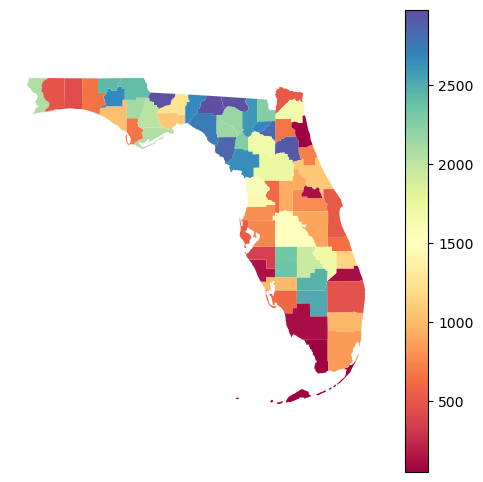

In [98]:
fig, ax = plt.subplots(figsize=(6,6))
FLfull.plot(column = 'QOL_rank', 
              cmap = 'Spectral',  
              legend = True,
              ax = ax)
ax.axis('off');

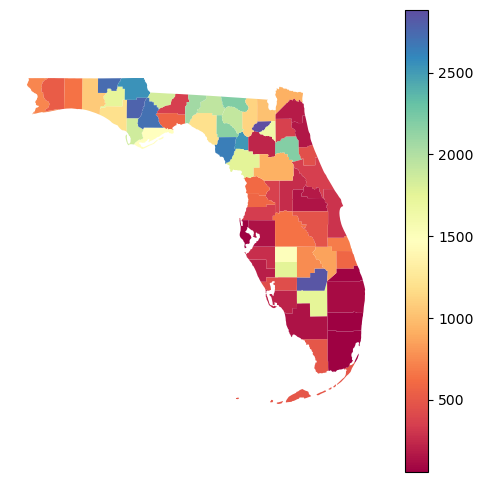

In [99]:
fig, ax = plt.subplots(figsize=(6,6))
FLfull.plot(column = 'PAE_rank', 
              cmap = 'Spectral',  
              legend = True,
              ax = ax)
ax.axis('off');

In [100]:
MA = allcounties.loc[(allcounties['STUSPS'] == 'MA')]
MAfull = pd.merge(left = MA, right = contiguous, how='inner',
                    on = ('County', 'State'))
MAfull.corr()

,ALAND,AWATER,Unnamed: 0,STCOU,Quality of Life,Life Expectancy,Median Household Income,Percent Some College,Percent Access to Exercise,Population,Square Miles,Density,QOL_rank,LE_rank,MHI_rank,PSC_rank,PAE_rank,SQM_rank,POP_rank,DEN_rank
ALAND,1.000000,-0.306110,0.762999,0.143306,0.287573,-0.522648,-0.220211,-0.211267,-0.316165,0.327371,0.784989,-0.298812,0.314165,0.476810,0.273704,0.172287,0.260172,-0.762962,-0.496123,-0.404419
AWATER,-0.306110,1.000000,0.298670,-0.382540,-0.330549,0.067340,0.046800,-0.255678,0.019120,-0.257395,0.349477,-0.249679,-0.339094,-0.146413,-0.294873,0.194550,-0.107934,-0.298672,0.173288,0.266482
Unnamed: 0,0.762999,0.298670,1.000000,-0.275794,0.159925,-0.576641,-0.245345,-0.457628,-0.379633,0.176752,0.945375,-0.484511,0.167038,0.477258,0.206774,0.392213,0.282368,-1.000000,-0.452471,-0.289249
STCOU,0.143306,-0.382540,-0.275794,1.000000,-0.106059,0.357978,0.461697,0.564340,0.349711,0.421288,-0.107948,0.453310,-0.071834,-0.347196,-0.401944,-0.577740,-0.286027,0.275849,-0.144741,-0.279100
Quality of Life,0.287573,-0.330549,0.159925,-0.106059,1.000000,-0.824607,-0.642568,-0.588133,0.034389,0.058380,0.067817,0.269505,0.989397,0.830205,0.600142,0.589547,-0.024630,-0.159408,-0.522076,-0.508863
Life Expectancy,-0.522648,0.067340,-0.576641,0.357978,-0.824607,1.000000,0.781100,0.804560,0.361217,0.130721,-0.470446,0.218397,-0.796801,-0.957579,-0.727899,-0.788287,-0.286003,0.576287,0.510729,0.394624
Median Household Income,-0.220211,0.046800,-0.245345,0.461697,-0.642568,0.781100,1.000000,0.809312,0.589263,0.593671,-0.186191,0.279999,-0.621335,-0.752205,-0.859225,-0.747495,-0.556669,0.244941,0.012719,-0.107891
Percent Some College,-0.211267,-0.255678,-0.457628,0.564340,-0.588133,0.804560,0.809312,1.000000,0.350221,0.374836,-0.374238,0.370117,-0.556508,-0.773506,-0.652097,-0.971951,-0.273176,0.457299,0.060752,-0.071113
Percent Access to Exercise,-0.316165,0.019120,-0.379633,0.349711,0.034389,0.361217,0.589263,0.350221,1.000000,0.574213,-0.298733,0.563073,0.036533,-0.261684,-0.577966,-0.261117,-0.971074,0.379693,-0.108909,-0.270470
Population,0.327371,-0.257395,0.176752,0.421288,0.058380,0.130721,0.593671,0.374836,0.574213,1.000000,0.154888,0.481471,0.062226,-0.154390,-0.412454,-0.310105,-0.511380,-0.176781,-0.632484,-0.703010


In [101]:
MAfull = MAfull.to_crs(epsg=2263)
MAfull['centroid'] = MAfull.centroid
MAfull = MAfull.to_crs(epsg=4326)
MAfull['centroid'] = MAfull['centroid'].to_crs(epsg=4326)

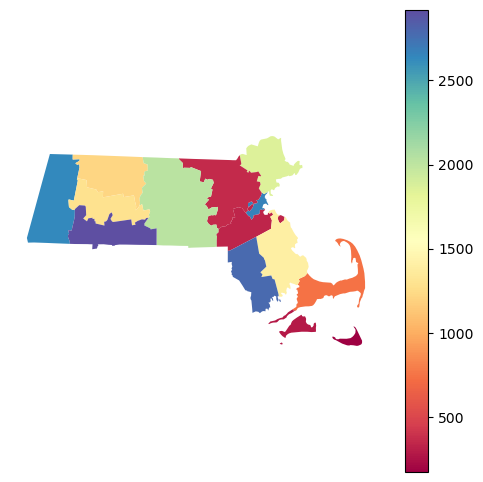

In [102]:
fig, ax = plt.subplots(figsize=(6,6))
MAfull.plot(column = 'QOL_rank', 
              cmap = 'Spectral',  
              legend = True,
              ax = ax)
ax.axis('off');

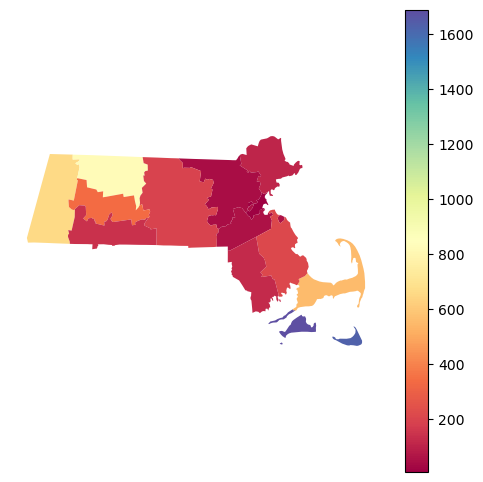

In [103]:
fig, ax = plt.subplots(figsize=(6,6))
MAfull.plot(column = 'DEN_rank', 
              cmap = 'Spectral',  
              legend = True,
              ax = ax)
ax.axis('off');

In [106]:
OH = allcounties.loc[(allcounties['STUSPS'] == 'OH')]
OHfull = pd.merge(left = OH, right = contiguous, how='inner',
                    on = ('County', 'State'))
OHfull.corr()

,ALAND,AWATER,Unnamed: 0,STCOU,Quality of Life,Life Expectancy,Median Household Income,Percent Some College,Percent Access to Exercise,Population,Square Miles,Density,QOL_rank,LE_rank,MHI_rank,PSC_rank,PAE_rank,SQM_rank,POP_rank,DEN_rank
ALAND,1.000000,-0.160432,0.477482,0.079361,0.186286,-0.176151,-0.187813,-0.137682,-0.016895,0.024510,0.403192,-0.019486,0.178393,0.181455,0.198978,0.181475,0.015857,-0.477209,-0.197548,-0.063196
AWATER,-0.160432,1.000000,0.749106,-0.146198,0.046282,0.047146,0.012242,0.165000,0.289867,0.357502,0.838568,0.105528,0.051736,-0.043749,-0.051744,-0.188013,-0.278239,-0.749388,-0.273154,-0.144498
Unnamed: 0,0.477482,0.749106,1.000000,-0.021054,0.139546,-0.073900,-0.095855,0.098368,0.268561,0.312324,0.958005,0.077800,0.130903,0.074382,0.060117,-0.094000,-0.257896,-1.000000,-0.400166,-0.199721
STCOU,0.079361,-0.146198,-0.021054,1.000000,-0.097654,0.055031,0.092754,0.014081,-0.011784,-0.084552,-0.091911,-0.055961,-0.106737,-0.093868,-0.127326,-0.019395,0.009891,0.021070,0.068020,0.058429
Quality of Life,0.186286,0.046282,0.139546,-0.097654,1.000000,-0.839041,-0.847797,-0.550589,-0.279601,-0.017097,0.145770,-0.073897,0.972140,0.845786,0.830659,0.586430,0.281520,-0.139419,0.238151,0.294516
Life Expectancy,-0.176151,0.047146,-0.073900,0.055031,-0.839041,1.000000,0.732584,0.419017,0.186991,0.061543,-0.053692,0.076078,-0.795194,-0.987837,-0.715110,-0.508759,-0.201267,0.073814,-0.168434,-0.203221
Median Household Income,-0.187813,0.012242,-0.095855,0.092754,-0.847797,0.732584,1.000000,0.562584,0.337083,0.113099,-0.092688,0.169274,-0.794661,-0.747249,-0.900656,-0.595444,-0.333236,0.095733,-0.342402,-0.389763
Percent Some College,-0.137682,0.165000,0.098368,0.014081,-0.550589,0.419017,0.562584,1.000000,0.624337,0.427476,0.076801,0.451598,-0.512660,-0.423342,-0.504471,-0.964533,-0.612167,-0.098506,-0.529640,-0.545928
Percent Access to Exercise,-0.016895,0.289867,0.268561,-0.011784,-0.279601,0.186991,0.337083,0.624337,1.000000,0.559964,0.259214,0.566430,-0.217995,-0.174243,-0.320505,-0.628598,-0.993023,-0.268565,-0.786412,-0.778348
Population,0.024510,0.357502,0.312324,-0.084552,-0.017097,0.061543,0.113099,0.427476,0.559964,1.000000,0.344669,0.920170,0.012102,-0.046512,-0.148466,-0.465254,-0.533170,-0.312433,-0.609226,-0.599201


In [107]:
OHfull = OHfull.to_crs(epsg=2263)
OHfull['centroid'] = OHfull.centroid
OHfull = OHfull.to_crs(epsg=4326)
OHfull['centroid'] = OHfull['centroid'].to_crs(epsg=4326)

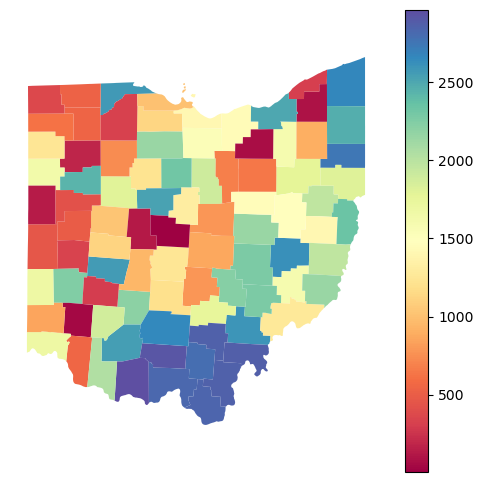

In [108]:
fig, ax = plt.subplots(figsize=(6,6))
OHfull.plot(column = 'QOL_rank', 
              cmap = 'Spectral',  
              legend = True,
              ax = ax)
ax.axis('off');

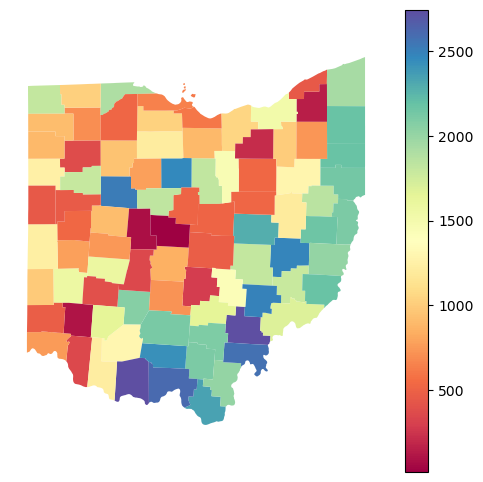

In [175]:
fig, ax = plt.subplots(figsize=(6,6))
OHfull.plot(column = 'MHI_rank', 
              cmap = 'Spectral',  
              legend = True,
              ax = ax)
ax.axis('off');

In [110]:
OR = allcounties.loc[(allcounties['STUSPS'] == 'OR')]
ORfull = pd.merge(left = OR, right = contiguous, how='inner',
                    on = ('County', 'State'))
ORfull.corr()

,ALAND,AWATER,Unnamed: 0,STCOU,Quality of Life,Life Expectancy,Median Household Income,Percent Some College,Percent Access to Exercise,Population,Square Miles,Density,QOL_rank,LE_rank,MHI_rank,PSC_rank,PAE_rank,SQM_rank,POP_rank,DEN_rank
ALAND,1.000000,0.161206,0.600343,-0.074225,0.500324,-0.428601,-0.529893,-0.225978,-0.368204,-0.213402,0.999287,-0.262982,0.462377,0.459757,0.572488,0.217583,0.424615,-0.600170,0.236776,0.493987
AWATER,0.161206,1.000000,0.230814,-0.245030,0.184708,-0.390975,-0.354551,-0.221234,0.120234,-0.134734,0.198348,-0.142016,0.122303,0.391579,0.354200,0.225807,-0.111766,-0.230864,-0.013228,0.146316
Unnamed: 0,0.600343,0.230814,1.000000,-0.105624,0.561681,-0.473721,-0.665144,-0.415727,-0.261692,-0.407341,0.605045,-0.604659,0.583854,0.512339,0.614562,0.375955,0.274066,-1.000000,0.235563,0.572822
STCOU,-0.074225,-0.245030,-0.105624,1.000000,-0.065913,0.024530,-0.005502,-0.063879,-0.213178,0.124560,-0.083061,0.198359,-0.100822,-0.081297,-0.018583,0.029026,0.205841,0.105458,0.077137,0.017259
Quality of Life,0.500324,0.184708,0.561681,-0.065913,1.000000,-0.513784,-0.653226,-0.620610,-0.579354,-0.497522,0.504144,-0.416261,0.977564,0.618116,0.592615,0.595931,0.593005,-0.561708,0.455987,0.666307
Life Expectancy,-0.428601,-0.390975,-0.473721,0.024530,-0.513784,1.000000,0.589048,0.492726,0.258931,0.214469,-0.440681,0.192190,-0.534770,-0.949613,-0.597628,-0.486483,-0.298054,0.473672,0.088898,-0.273591
Median Household Income,-0.529893,-0.354551,-0.665144,-0.005502,-0.653226,0.589048,1.000000,0.397613,0.452949,0.550356,-0.539893,0.472688,-0.645564,-0.648758,-0.954587,-0.389916,-0.453044,0.665139,-0.453744,-0.677128
Percent Some College,-0.225978,-0.221234,-0.415727,-0.063879,-0.620610,0.492726,0.397613,1.000000,0.392842,0.543582,-0.232996,0.474120,-0.636177,-0.457501,-0.344210,-0.986459,-0.427862,0.415775,-0.305758,-0.530464
Percent Access to Exercise,-0.368204,0.120234,-0.261692,-0.213178,-0.579354,0.258931,0.452949,0.392842,1.000000,0.523624,-0.361071,0.402597,-0.556650,-0.299673,-0.449703,-0.379204,-0.988505,0.261718,-0.635055,-0.663222
Population,-0.213402,-0.134734,-0.407341,0.124560,-0.497522,0.214469,0.550356,0.543582,0.523624,1.000000,-0.217130,0.874834,-0.482962,-0.274568,-0.460853,-0.527258,-0.488310,0.407316,-0.648753,-0.741704


In [111]:
NM = allcounties.loc[(allcounties['STUSPS'] == 'NM')]
NMfull = pd.merge(left = NM, right = contiguous, how='inner',
                    on = ('County', 'State'))
NMfull.corr()

,ALAND,AWATER,Unnamed: 0,STCOU,Quality of Life,Life Expectancy,Median Household Income,Percent Some College,Percent Access to Exercise,Population,Square Miles,Density,QOL_rank,LE_rank,MHI_rank,PSC_rank,PAE_rank,SQM_rank,POP_rank,DEN_rank
ALAND,1.000000,0.325796,0.578309,-0.031033,0.475537,-0.417706,-0.415522,-0.448529,-0.143527,-0.219102,0.999981,-0.410691,0.444802,0.372878,0.320869,0.442291,0.192888,-0.578002,-0.069346,0.512499
AWATER,0.325796,1.000000,0.206826,0.147658,0.196245,-0.426651,-0.156511,-0.066316,0.156626,-0.038888,0.331575,-0.103676,0.226129,0.459284,0.139136,0.072009,-0.134517,-0.206713,-0.025720,0.188109
Unnamed: 0,0.578309,0.206826,1.000000,0.020978,0.620753,-0.527875,-0.782023,-0.506704,-0.294343,-0.081002,0.578458,-0.394235,0.449776,0.436586,0.516065,0.515516,0.266531,-1.000000,0.018536,0.603623
STCOU,-0.031033,0.147658,0.020978,1.000000,-0.012125,-0.005041,-0.022223,-0.021715,-0.173165,-0.205968,-0.030023,-0.237638,-0.000149,-0.023000,0.075271,0.041062,0.176684,-0.020989,-0.065864,-0.022095
Quality of Life,0.475537,0.196245,0.620753,-0.012125,1.000000,-0.639833,-0.655221,-0.469854,-0.474481,-0.170662,0.475652,-0.337367,0.958979,0.526758,0.588065,0.487560,0.465997,-0.620706,0.020118,0.477349
Life Expectancy,-0.417706,-0.426651,-0.527875,-0.005041,-0.639833,1.000000,0.453819,0.408700,0.281752,0.061803,-0.419630,0.234821,-0.535782,-0.953848,-0.363773,-0.503886,-0.309212,0.527825,0.131369,-0.360586
Median Household Income,-0.415522,-0.156511,-0.782023,-0.022223,-0.655221,0.453819,1.000000,0.510210,0.421569,0.213789,-0.415718,0.370132,-0.543731,-0.346767,-0.912783,-0.530454,-0.411728,0.782060,-0.393285,-0.695899
Percent Some College,-0.448529,-0.066316,-0.506704,-0.021715,-0.469854,0.408700,0.510210,1.000000,-0.025845,0.252586,-0.448002,0.351900,-0.396930,-0.379743,-0.390446,-0.964358,-0.007508,0.506616,-0.191277,-0.449070
Percent Access to Exercise,-0.143527,0.156626,-0.294343,-0.173165,-0.474481,0.281752,0.421569,-0.025845,1.000000,0.292620,-0.142290,0.355189,-0.452507,-0.245677,-0.447342,-0.092760,-0.984823,0.294369,-0.258180,-0.392092
Population,-0.219102,-0.038888,-0.081002,-0.205968,-0.170662,0.061803,0.213789,0.252586,0.292620,1.000000,-0.218816,0.927786,-0.244242,-0.091710,-0.362762,-0.365868,-0.267622,0.080774,-0.571790,-0.691236


In [112]:
NMfull = NMfull.to_crs(epsg=2263)
NMfull['centroid'] = NMfull.centroid
NMfull = NMfull.to_crs(epsg=4326)
NMfull['centroid'] = NMfull['centroid'].to_crs(epsg=4326)

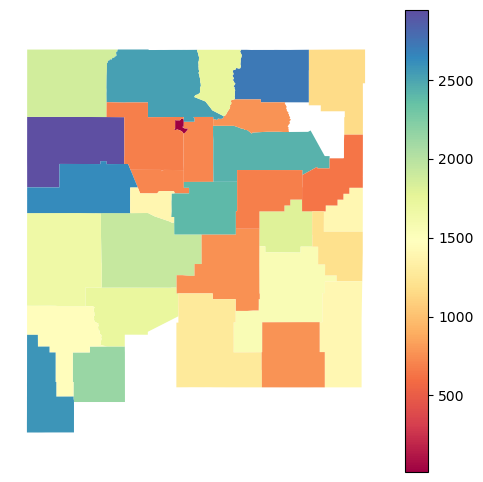

In [113]:
fig, ax = plt.subplots(figsize=(6,6))
NMfull.plot(column = 'QOL_rank', 
              cmap = 'Spectral',  
              legend = True,
              ax = ax)
ax.axis('off');

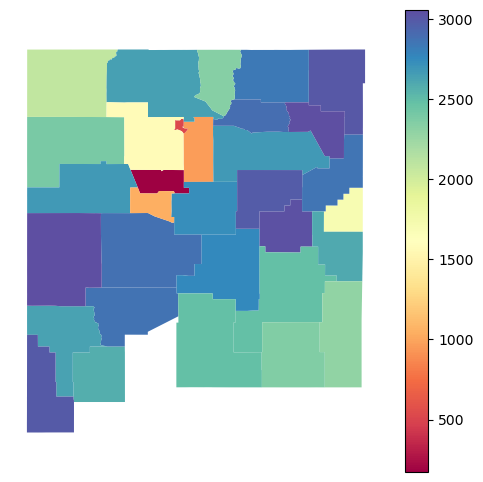

In [114]:
fig, ax = plt.subplots(figsize=(6,6))
NMfull.plot(column = 'DEN_rank', 
              cmap = 'Spectral',  
              legend = True,
              ax = ax)
ax.axis('off');

In [115]:
SC = allcounties.loc[(allcounties['STUSPS'] == 'SC')]
SCfull = pd.merge(left = SC, right = contiguous, how='inner',
                    on = ('County', 'State'))
SCfull.corr()

,ALAND,AWATER,Unnamed: 0,STCOU,Quality of Life,Life Expectancy,Median Household Income,Percent Some College,Percent Access to Exercise,Population,Square Miles,Density,QOL_rank,LE_rank,MHI_rank,PSC_rank,PAE_rank,SQM_rank,POP_rank,DEN_rank
ALAND,1.000000,0.317416,0.938553,0.029914,-0.297466,0.212190,0.316255,0.369770,0.304666,0.496037,0.945782,0.307367,-0.279569,-0.212499,-0.320330,-0.353004,-0.285371,-0.938581,-0.594837,-0.351500
AWATER,0.317416,1.000000,0.509948,-0.256442,-0.441762,0.496358,0.584448,0.368546,0.401874,0.374999,0.608175,0.163273,-0.393641,-0.506795,-0.534145,-0.362716,-0.427131,-0.509890,-0.328028,-0.235884
Unnamed: 0,0.938553,0.509948,1.000000,0.021079,-0.432949,0.377200,0.478450,0.452483,0.394763,0.544526,0.960541,0.365194,-0.389231,-0.362965,-0.468196,-0.435207,-0.376489,-1.000000,-0.671337,-0.419601
STCOU,0.029914,-0.256442,0.021079,1.000000,-0.010467,-0.001383,-0.023761,0.012634,0.037373,0.090990,-0.062710,0.181136,-0.030927,-0.008486,0.013015,-0.030026,-0.000652,-0.021112,-0.142941,-0.141687
Quality of Life,-0.297466,-0.441762,-0.432949,-0.010467,1.000000,-0.897436,-0.915150,-0.810576,-0.615513,-0.710187,-0.400610,-0.702977,0.980667,0.865460,0.916367,0.817040,0.664279,0.432877,0.704543,0.714556
Life Expectancy,0.212190,0.496358,0.377200,-0.001383,-0.897436,1.000000,0.873162,0.662745,0.571045,0.595081,0.347441,0.570472,-0.875474,-0.977635,-0.868686,-0.663347,-0.601745,-0.377146,-0.605021,-0.618230
Median Household Income,0.316255,0.584448,0.478450,-0.023761,-0.915150,0.873162,1.000000,0.726026,0.570704,0.655730,0.464855,0.607794,-0.891568,-0.875457,-0.987637,-0.735323,-0.606491,-0.478320,-0.662994,-0.650650
Percent Some College,0.369770,0.368546,0.452483,0.012634,-0.810576,0.662745,0.726026,1.000000,0.497846,0.743567,0.436134,0.742474,-0.779253,-0.630257,-0.722390,-0.992888,-0.555324,-0.452433,-0.774508,-0.785192
Percent Access to Exercise,0.304666,0.401874,0.394763,0.037373,-0.615513,0.571045,0.570704,0.497846,1.000000,0.666637,0.393141,0.630742,-0.614449,-0.561626,-0.584210,-0.506813,-0.982435,-0.394959,-0.622257,-0.622412
Population,0.496037,0.374999,0.544526,0.090990,-0.710187,0.595081,0.655730,0.743567,0.666637,1.000000,0.543881,0.945599,-0.709127,-0.616804,-0.672394,-0.762905,-0.707706,-0.544676,-0.774296,-0.782547


In [116]:
SCfull = SCfull.to_crs(epsg=2263)
SCfull['centroid'] = SCfull.centroid
SCfull = SCfull.to_crs(epsg=4326)
SCfull['centroid'] = SCfull['centroid'].to_crs(epsg=4326)

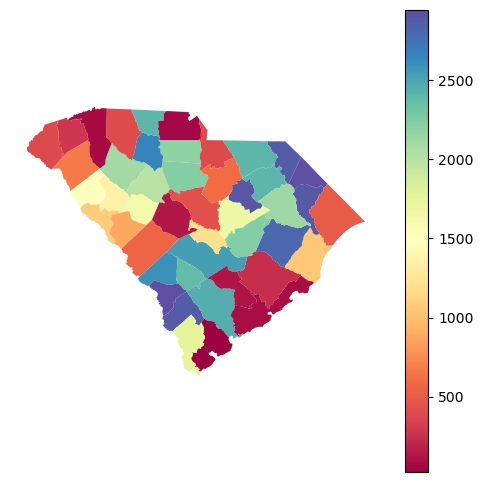

In [159]:
fig, ax = plt.subplots(figsize=(6,6))
SCfull.plot(column = 'QOL_rank', 
              cmap = 'Spectral',  
              legend = True,
              ax = ax)
ax.axis('off');

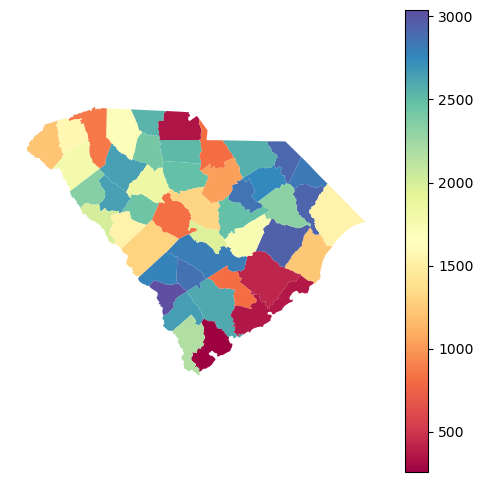

In [174]:
fig, ax = plt.subplots(figsize=(6,6))
SCfull.plot(column = 'MHI_rank', 
              cmap = 'Spectral',  
              legend = True,
              ax = ax)
ax.axis('off');

In [117]:
AR = allcounties.loc[(allcounties['STUSPS'] == 'AR')]
ARfull = pd.merge(left = AR, right = contiguous, how='inner',
                    on = ('County', 'State'))
ARfull.corr()

,ALAND,AWATER,Unnamed: 0,STCOU,Quality of Life,Life Expectancy,Median Household Income,Percent Some College,Percent Access to Exercise,Population,Square Miles,Density,QOL_rank,LE_rank,MHI_rank,PSC_rank,PAE_rank,SQM_rank,POP_rank,DEN_rank
ALAND,1.000000,0.121958,0.978926,0.169530,-0.067103,-0.008943,0.175808,0.086807,0.385552,0.246103,0.993172,0.142790,-0.032697,-0.048307,-0.149962,-0.076087,-0.379280,-0.978947,-0.300242,-0.116651
AWATER,0.121958,1.000000,0.236027,-0.163472,0.168387,-0.163786,0.047668,0.059926,0.255474,0.281304,0.235923,0.268274,0.069978,0.116961,-0.051538,-0.078625,-0.256144,-0.236175,-0.235649,-0.207692
Unnamed: 0,0.978926,0.236027,1.000000,0.136269,-0.025302,-0.032552,0.160104,0.106314,0.416416,0.273957,0.986103,0.171161,-0.003445,-0.033948,-0.142313,-0.099088,-0.410582,-0.999999,-0.318693,-0.137470
STCOU,0.169530,-0.163472,0.136269,1.000000,0.039128,0.029682,-0.180495,-0.093004,0.096538,0.074170,0.149730,0.053669,0.047105,-0.069818,0.157588,0.066366,-0.067776,-0.136369,0.005109,0.025700
Quality of Life,-0.067103,0.168387,-0.025302,0.039128,1.000000,-0.749273,-0.687997,-0.397281,-0.150071,-0.465424,-0.047188,-0.476704,0.965596,0.724092,0.651746,0.444961,0.179092,0.025530,0.470615,0.507880
Life Expectancy,-0.008943,-0.163786,-0.032552,0.029682,-0.749273,1.000000,0.546771,0.281801,0.184572,0.416869,-0.025021,0.424926,-0.723689,-0.947859,-0.514003,-0.325158,-0.183693,0.032238,-0.383606,-0.426849
Median Household Income,0.175808,0.047668,0.160104,-0.180495,-0.687997,0.546771,1.000000,0.463875,0.204682,0.608131,0.176064,0.607342,-0.642385,-0.593998,-0.979101,-0.508976,-0.268657,-0.160297,-0.601554,-0.614681
Percent Some College,0.086807,0.059926,0.106314,-0.093004,-0.397281,0.281801,0.463875,1.000000,0.307546,0.476488,0.091624,0.491127,-0.394362,-0.291100,-0.454722,-0.975752,-0.351104,-0.106410,-0.463777,-0.479195
Percent Access to Exercise,0.385552,0.255474,0.416416,0.096538,-0.150071,0.184572,0.204682,0.307546,1.000000,0.485948,0.406726,0.473128,-0.149899,-0.252928,-0.166683,-0.338214,-0.975072,-0.416803,-0.482885,-0.436189
Population,0.246103,0.281304,0.273957,0.074170,-0.465424,0.416869,0.608131,0.476488,0.485948,1.000000,0.274376,0.985021,-0.451448,-0.509081,-0.618738,-0.522876,-0.550730,-0.274175,-0.747610,-0.770057


In [118]:
DE = allcounties.loc[(allcounties['STUSPS'] == 'DE')]
DEfull = pd.merge(left = DE, right = contiguous, how='inner',
                    on = ('County', 'State'))
DEfull.corr()

,ALAND,AWATER,Unnamed: 0,STCOU,Quality of Life,Life Expectancy,Median Household Income,Percent Some College,Percent Access to Exercise,Population,Square Miles,Density,QOL_rank,LE_rank,MHI_rank,PSC_rank,PAE_rank,SQM_rank,POP_rank,DEN_rank
ALAND,1.000000,0.880353,0.933547,0.671281,-0.189793,0.548851,-0.184630,-0.991273,-0.511056,-0.637996,0.990306,-0.758242,-0.191013,-0.557414,0.025126,0.993769,0.426403,-0.933365,0.484806,0.808300
AWATER,0.880353,1.000000,0.991873,0.239397,0.298614,0.086689,-0.628705,-0.935198,-0.857610,-0.926907,0.937702,-0.976764,0.297427,-0.096924,0.496290,0.927734,0.804423,-0.991937,0.841650,0.990855
Unnamed: 0,0.933547,0.991873,1.000000,0.360986,0.174758,0.212740,-0.524652,-0.972654,-0.785203,-0.871623,0.974287,-0.941557,0.173534,-0.222772,0.381797,0.967683,0.722301,-1.000000,0.766101,0.965633
STCOU,0.671281,0.239397,0.360986,1.000000,-0.855135,0.988020,0.604522,-0.567711,0.294036,0.142480,0.561821,-0.025750,-0.855779,-0.989554,-0.724102,0.584486,-0.384206,-0.360511,-0.322831,0.106198
Quality of Life,-0.189793,0.298614,0.174758,-0.855135,1.000000,-0.924895,-0.929903,0.058704,-0.746929,-0.634956,-0.051577,-0.496214,0.999999,0.920938,0.976745,-0.079178,0.807164,-0.175259,0.766712,0.424660
Life Expectancy,0.548851,0.086689,0.212740,0.988020,-0.924895,1.000000,0.720215,-0.433863,0.438019,0.293526,0.427421,0.128835,-0.925366,-0.999947,-0.821865,0.452262,-0.522086,-0.212242,-0.465028,-0.048529
Median Household Income,-0.184630,-0.628705,-0.524652,0.604522,-0.929903,0.720215,1.000000,0.312580,0.939126,0.874594,-0.319352,0.780758,-0.929445,-0.713046,-0.987137,-0.293021,-0.967709,0.525085,-0.949095,-0.727885
Percent Some College,-0.991273,-0.935198,-0.972654,-0.567711,0.058704,-0.433863,0.312580,1.000000,0.619909,0.733941,-0.999975,0.837573,0.059945,0.443100,-0.156694,-0.999789,-0.541925,0.972536,-0.595875,-0.878862
Percent Access to Exercise,-0.511056,-0.857610,-0.785203,0.294036,-0.746929,0.438019,0.939126,0.619909,1.000000,0.987937,-0.625494,0.947906,-0.746102,-0.428756,-0.872117,-0.603676,-0.995405,0.785519,-0.999542,-0.919163
Population,-0.637996,-0.926907,-0.871623,0.142480,-0.634956,0.293526,0.874594,0.733941,0.987937,1.000000,-0.738771,0.985801,-0.633995,-0.283686,-0.785827,-0.719848,-0.968570,0.871873,-0.982798,-0.969069


In [119]:
GA = allcounties.loc[(allcounties['STUSPS'] == 'GA')]
GAfull = pd.merge(left = GA, right = contiguous, how='inner',
                    on = ('County', 'State'))
GAfull.corr()

,ALAND,AWATER,Unnamed: 0,STCOU,Quality of Life,Life Expectancy,Median Household Income,Percent Some College,Percent Access to Exercise,Population,Square Miles,Density,QOL_rank,LE_rank,MHI_rank,PSC_rank,PAE_rank,SQM_rank,POP_rank,DEN_rank
ALAND,1.000000,0.167871,0.964794,-0.032404,0.196883,-0.185361,-0.130147,-0.163162,-0.173744,0.012349,0.986066,-0.159441,0.203288,0.193973,0.139915,0.172205,0.205698,-0.964989,-0.067429,0.255500
AWATER,0.167871,1.000000,0.361603,-0.118042,-0.098770,0.178108,0.077248,0.117702,0.099121,0.071333,0.329494,-0.009471,-0.113286,-0.179919,-0.104501,-0.122075,-0.096329,-0.361482,-0.175228,-0.082869
Unnamed: 0,0.964794,0.361603,1.000000,-0.070495,0.162516,-0.146484,-0.117016,-0.114590,-0.124462,0.023312,0.985095,-0.134865,0.167270,0.154691,0.124414,0.120290,0.157938,-0.999999,-0.109064,0.208778
STCOU,-0.032404,-0.118042,-0.070495,1.000000,0.114469,-0.064762,-0.145984,-0.202038,-0.046606,-0.159109,-0.051172,-0.176665,0.121722,0.063166,0.135707,0.231762,0.035483,0.070520,0.190693,0.183901
Quality of Life,0.196883,-0.098770,0.162516,0.114469,1.000000,-0.721807,-0.850079,-0.658357,-0.455581,-0.394391,0.172061,-0.396656,0.969371,0.713346,0.843212,0.661679,0.472375,-0.162610,0.589918,0.645431
Life Expectancy,-0.185361,0.178108,-0.146484,-0.064762,-0.721807,1.000000,0.626006,0.442153,0.350255,0.375492,-0.147690,0.388340,-0.704742,-0.985782,-0.605310,-0.463071,-0.370874,0.146580,-0.323312,-0.340485
Median Household Income,-0.130147,0.077248,-0.117016,-0.145984,-0.850079,0.626006,1.000000,0.683154,0.362887,0.413902,-0.111761,0.421019,-0.798968,-0.622803,-0.942489,-0.674721,-0.380545,0.117002,-0.605845,-0.616355
Percent Some College,-0.163162,0.117702,-0.114590,-0.202038,-0.658357,0.442153,0.683154,1.000000,0.354683,0.457479,-0.136656,0.474067,-0.641959,-0.449799,-0.630586,-0.966556,-0.384542,0.114697,-0.545924,-0.568231
Percent Access to Exercise,-0.173744,0.099121,-0.124462,-0.046606,-0.455581,0.350255,0.362887,0.354683,1.000000,0.411960,-0.150036,0.446219,-0.437672,-0.344326,-0.353224,-0.340171,-0.980645,0.124706,-0.577234,-0.620591
Population,0.012349,0.071333,0.023312,-0.159109,-0.394391,0.375492,0.413902,0.457479,0.411960,1.000000,0.023808,0.914243,-0.383359,-0.385494,-0.427052,-0.485859,-0.436908,-0.023363,-0.585406,-0.514060


In [160]:
GAfull = GAfull.to_crs(epsg=2263)
GAfull['centroid'] = GAfull.centroid
GAfull = GAfull.to_crs(epsg=4326)
GAfull['centroid'] = GAfull['centroid'].to_crs(epsg=4326)

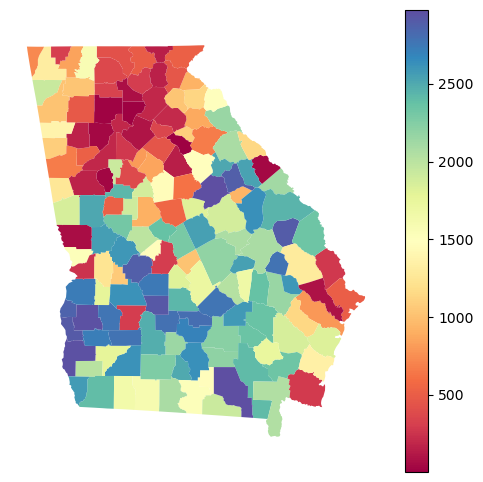

In [163]:
fig, ax = plt.subplots(figsize=(6,6))
GAfull.plot(column = 'QOL_rank', 
              cmap = 'Spectral',  
              legend = True,
              ax = ax)
ax.axis('off');

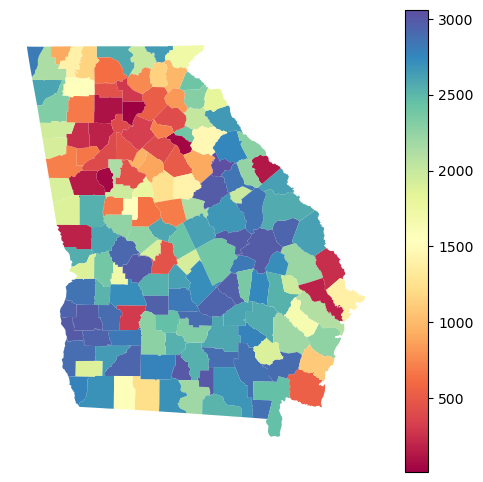

In [177]:
fig, ax = plt.subplots(figsize=(6,6))
GAfull.plot(column = 'MHI_rank', 
              cmap = 'Spectral',  
              legend = True,
              ax = ax)
ax.axis('off');

In [120]:
IL = allcounties.loc[(allcounties['STUSPS'] == 'IL')]
ILfull = pd.merge(left = IL, right = contiguous, how='inner',
                    on = ('County', 'State'))
ILfull.corr()

,ALAND,AWATER,Unnamed: 0,STCOU,Quality of Life,Life Expectancy,Median Household Income,Percent Some College,Percent Access to Exercise,Population,Square Miles,Density,QOL_rank,LE_rank,MHI_rank,PSC_rank,PAE_rank,SQM_rank,POP_rank,DEN_rank
ALAND,1.000000,0.073199,0.950226,0.034462,-0.050693,0.034326,0.061987,0.105426,0.277454,0.211169,0.899272,0.114864,-0.035309,-0.035869,-0.148156,-0.090715,-0.269269,-0.950275,-0.561633,-0.268802
AWATER,0.073199,1.000000,0.310527,-0.077971,-0.160049,0.178389,0.327841,0.171368,0.258821,0.664338,0.502041,0.486705,-0.160001,-0.174373,-0.205634,-0.178752,-0.235647,-0.310455,-0.264618,-0.271474
Unnamed: 0,0.950226,0.310527,1.000000,0.048871,-0.082452,0.077171,0.135713,0.138952,0.327487,0.284584,0.960228,0.169244,-0.064167,-0.076389,-0.178291,-0.132879,-0.314766,-1.000000,-0.618495,-0.334090
STCOU,0.034462,-0.077971,0.048871,1.000000,0.066866,-0.074959,0.014517,0.067895,-0.031144,-0.096115,-0.004090,-0.084459,0.086449,0.095586,-0.018399,-0.068650,0.038026,-0.048761,-0.085669,-0.094428
Quality of Life,-0.050693,-0.160049,-0.082452,0.066866,1.000000,-0.748526,-0.789306,-0.553595,-0.295711,-0.136319,-0.114105,-0.283808,0.963602,0.738753,0.774189,0.546499,0.305338,0.082547,0.293531,0.301849
Life Expectancy,0.034326,0.178389,0.077171,-0.074959,-0.748526,1.000000,0.699498,0.486804,0.233360,0.156605,0.108019,0.281230,-0.723876,-0.989166,-0.687729,-0.468332,-0.252449,-0.077213,-0.246244,-0.258313
Median Household Income,0.061987,0.327841,0.135713,0.014517,-0.789306,0.699498,1.000000,0.557090,0.421384,0.260367,0.197534,0.430757,-0.754372,-0.677259,-0.916236,-0.538077,-0.435254,-0.135721,-0.510769,-0.558006
Percent Some College,0.105426,0.171368,0.138952,0.067895,-0.553595,0.486804,0.557090,1.000000,0.271651,0.220690,0.166619,0.321346,-0.521906,-0.472930,-0.532168,-0.990774,-0.285767,-0.138909,-0.451019,-0.499757
Percent Access to Exercise,0.277454,0.258821,0.327487,-0.031144,-0.295711,0.233360,0.421384,0.271651,1.000000,0.333450,0.354202,0.454666,-0.287490,-0.231594,-0.323230,-0.251357,-0.985063,-0.327464,-0.718841,-0.729485
Population,0.211169,0.664338,0.284584,-0.096115,-0.136319,0.156605,0.260367,0.220690,0.333450,1.000000,0.474665,0.847396,-0.132176,-0.159175,-0.229674,-0.219561,-0.311523,-0.284520,-0.357224,-0.376941


In [121]:
IN = allcounties.loc[(allcounties['STUSPS'] == 'IN')]
INfull = pd.merge(left = IN, right = contiguous, how='inner',
                    on = ('County', 'State'))
INfull.corr()

,ALAND,AWATER,Unnamed: 0,STCOU,Quality of Life,Life Expectancy,Median Household Income,Percent Some College,Percent Access to Exercise,Population,Square Miles,Density,QOL_rank,LE_rank,MHI_rank,PSC_rank,PAE_rank,SQM_rank,POP_rank,DEN_rank
ALAND,1.000000,0.173642,0.938253,-0.049963,-0.094200,0.111445,-0.012562,-0.017697,0.037126,0.204347,0.986188,0.039400,-0.052061,-0.082097,-0.007774,0.041279,-0.047855,-0.938597,-0.393165,-0.074782
AWATER,0.173642,1.000000,0.391017,0.066907,-0.078436,0.081412,0.101992,0.112654,0.290075,0.345429,0.334342,0.217258,-0.076330,-0.080526,-0.102662,-0.131648,-0.286244,-0.390734,-0.280867,-0.241554
Unnamed: 0,0.938253,0.391017,1.000000,-0.018033,-0.074046,0.096680,-0.006991,0.014591,0.135031,0.271791,0.963522,0.087185,-0.046141,-0.073272,-0.028361,-0.000301,-0.143385,-0.999999,-0.409527,-0.143515
STCOU,-0.049963,0.066907,-0.018033,1.000000,0.026503,-0.027398,-0.134365,-0.058710,-0.233845,-0.059808,-0.036482,-0.045314,-0.000846,0.018042,0.117520,0.057753,0.229096,0.017890,0.145381,0.151882
Quality of Life,-0.094200,-0.078436,-0.074046,0.026503,1.000000,-0.740785,-0.801445,-0.614451,-0.059432,-0.059380,-0.103384,-0.059384,0.950888,0.738685,0.725934,0.593203,0.071530,0.074356,0.207756,0.163713
Life Expectancy,0.111445,0.081412,0.096680,-0.027398,-0.740785,1.000000,0.559303,0.396868,0.004113,0.057210,0.120449,0.035361,-0.746107,-0.991420,-0.527494,-0.413932,-0.025484,-0.097060,-0.112633,-0.076153
Median Household Income,-0.012562,0.101992,-0.006991,-0.134365,-0.801445,0.559303,1.000000,0.480217,0.138375,0.133677,0.005055,0.145638,-0.745863,-0.567681,-0.928503,-0.478670,-0.149098,0.006850,-0.283973,-0.296802
Percent Some College,-0.017697,0.112654,0.014591,-0.058710,-0.614451,0.396868,0.480217,1.000000,0.457733,0.318399,0.001558,0.343236,-0.542573,-0.391922,-0.352307,-0.977445,-0.460441,-0.014607,-0.359850,-0.368517
Percent Access to Exercise,0.037126,0.290075,0.135031,-0.233845,-0.059432,0.004113,0.138375,0.457733,1.000000,0.521892,0.083736,0.520720,-0.010744,0.010549,-0.040105,-0.430718,-0.989821,-0.134831,-0.644706,-0.698806
Population,0.204347,0.345429,0.271791,-0.059808,-0.059380,0.057210,0.133677,0.318399,0.521892,1.000000,0.253362,0.963707,0.023586,-0.036655,-0.088854,-0.326409,-0.532348,-0.271552,-0.622611,-0.593513


In [122]:
IA = allcounties.loc[(allcounties['STUSPS'] == 'IA')]
IAfull = pd.merge(left = IA, right = contiguous, how='inner',
                    on = ('County', 'State'))
IAfull.corr()

,ALAND,AWATER,Unnamed: 0,STCOU,Quality of Life,Life Expectancy,Median Household Income,Percent Some College,Percent Access to Exercise,Population,Square Miles,Density,QOL_rank,LE_rank,MHI_rank,PSC_rank,PAE_rank,SQM_rank,POP_rank,DEN_rank
ALAND,1.000000,-0.028084,0.987847,0.069129,-0.066347,0.125187,0.155899,-0.012102,0.049259,0.167752,0.998977,0.069141,-0.055970,-0.090599,-0.202830,0.005960,-0.036709,-0.987926,-0.367863,-0.153579
AWATER,-0.028084,1.000000,0.013564,-0.121588,0.191956,-0.104871,0.013444,-0.000757,0.195175,0.378725,0.017090,0.390437,0.136390,0.106165,-0.026693,0.008538,-0.177799,-0.013483,-0.373978,-0.401792
Unnamed: 0,0.987847,0.013564,1.000000,0.037705,-0.083045,0.150021,0.168254,0.000900,0.046294,0.203240,0.988698,0.108365,-0.074454,-0.113813,-0.214907,-0.001489,-0.033038,-1.000000,-0.396422,-0.180409
STCOU,0.069129,-0.121588,0.037705,1.000000,0.015235,-0.074473,-0.032853,-0.007383,0.092806,0.128336,0.063528,0.121498,0.040931,0.130403,0.045813,0.012956,-0.087902,-0.037761,-0.085985,-0.089390
Quality of Life,-0.066347,0.191956,-0.083045,0.015235,1.000000,-0.643539,-0.564525,-0.663574,-0.065946,-0.101999,-0.057910,-0.095601,0.977819,0.625435,0.520264,0.633222,0.064660,0.082870,0.116440,0.099788
Life Expectancy,0.125187,-0.104871,0.150021,-0.074473,-0.643539,1.000000,0.418605,0.410638,0.016399,0.093109,0.120487,0.089179,-0.630601,-0.969734,-0.408329,-0.339786,-0.013170,-0.149887,-0.183262,-0.148463
Median Household Income,0.155899,0.013444,0.168254,-0.032853,-0.564525,0.418605,1.000000,0.384759,0.100154,0.244039,0.156646,0.235368,-0.508332,-0.409988,-0.946351,-0.345371,-0.095872,-0.168212,-0.376119,-0.356537
Percent Some College,-0.012102,-0.000757,0.000900,-0.007383,-0.663574,0.410638,0.384759,1.000000,0.305234,0.283437,-0.012138,0.285980,-0.666705,-0.360700,-0.334680,-0.974140,-0.299863,-0.000762,-0.315847,-0.340388
Percent Access to Exercise,0.049259,0.195175,0.046294,0.092806,-0.065946,0.016399,0.100154,0.305234,1.000000,0.433931,0.058058,0.428418,-0.050644,0.025269,-0.109465,-0.272061,-0.997742,-0.046371,-0.599370,-0.634303
Population,0.167752,0.378725,0.203240,0.128336,-0.101999,0.093109,0.244039,0.283437,0.433931,1.000000,0.184837,0.988752,-0.100520,-0.083174,-0.248701,-0.249063,-0.412034,-0.203211,-0.711465,-0.715560


In [123]:
KS = allcounties.loc[(allcounties['STUSPS'] == 'KS')]
KSfull = pd.merge(left = KS, right = contiguous, how='inner',
                    on = ('County', 'State'))
KSfull.corr()

,ALAND,AWATER,Unnamed: 0,STCOU,Quality of Life,Life Expectancy,Median Household Income,Percent Some College,Percent Access to Exercise,Population,Square Miles,Density,QOL_rank,LE_rank,MHI_rank,PSC_rank,PAE_rank,SQM_rank,POP_rank,DEN_rank
ALAND,1.000000,-0.156864,0.962054,0.042382,-0.086023,0.041531,-0.014869,0.028241,-0.068448,-0.129816,0.999643,-0.321868,-0.088765,-0.042595,-0.040285,-0.052055,0.088420,-0.962029,0.173067,0.369243
AWATER,-0.156864,1.000000,-0.207423,-0.054862,-0.145404,0.165060,0.103086,0.245002,-0.026723,0.212178,-0.130455,0.144489,-0.139054,-0.147252,-0.076649,-0.251807,0.048738,0.207494,-0.433131,-0.438485
Unnamed: 0,0.962054,-0.207423,1.000000,0.099450,-0.124521,0.048643,-0.062256,0.018384,-0.125978,-0.191891,0.960248,-0.393347,-0.131643,-0.063057,-0.003425,-0.050019,0.144866,-1.000000,0.298301,0.483914
STCOU,0.042382,-0.054862,0.099450,1.000000,-0.150336,0.118837,0.121919,0.092809,-0.023739,0.076968,0.040957,0.111429,-0.147298,-0.106781,-0.159604,-0.093758,0.004356,-0.099432,0.033905,0.025991
Quality of Life,-0.086023,-0.145404,-0.124521,-0.150336,1.000000,-0.331151,-0.510779,-0.548154,0.017520,-0.179076,-0.090392,-0.085575,0.976287,0.407094,0.472712,0.556905,-0.032799,0.124826,0.004554,-0.002248
Life Expectancy,0.041531,0.165060,0.048643,0.118837,-0.331151,1.000000,0.343347,0.144822,-0.026790,0.128616,0.046088,0.089904,-0.309862,-0.920360,-0.310424,-0.116167,-0.013188,-0.048769,-0.121311,-0.107489
Median Household Income,-0.014869,0.103086,-0.062256,0.121919,-0.510779,0.343347,1.000000,0.091294,0.288739,0.378356,-0.012071,0.327471,-0.444859,-0.405273,-0.956179,-0.079022,-0.286158,0.062126,-0.296014,-0.278717
Percent Some College,0.028241,0.245002,0.018384,0.092809,-0.548154,0.144822,0.091294,1.000000,-0.020445,0.170109,0.034958,0.107936,-0.565514,-0.194969,-0.052092,-0.983846,0.032930,-0.018551,-0.135460,-0.142217
Percent Access to Exercise,-0.068448,-0.026723,-0.125978,-0.023739,0.017520,-0.026790,0.288739,-0.020445,1.000000,0.370498,-0.069240,0.372696,0.040548,0.054609,-0.266106,0.044722,-0.980224,0.125996,-0.472280,-0.478898
Population,-0.129816,0.212178,-0.191891,0.076968,-0.179076,0.128616,0.378356,0.170109,0.370498,1.000000,-0.124436,0.854121,-0.100993,-0.107516,-0.236151,-0.121603,-0.379945,0.191871,-0.635337,-0.664146


In [124]:
KY = allcounties.loc[(allcounties['STUSPS'] == 'KY')]
KYfull = pd.merge(left = KY, right = contiguous, how='inner',
                    on = ('County', 'State'))
KYfull.corr()

,ALAND,AWATER,Unnamed: 0,STCOU,Quality of Life,Life Expectancy,Median Household Income,Percent Some College,Percent Access to Exercise,Population,Square Miles,Density,QOL_rank,LE_rank,MHI_rank,PSC_rank,PAE_rank,SQM_rank,POP_rank,DEN_rank
ALAND,1.000000,0.122875,0.974416,0.003343,0.158273,-0.080322,-0.259464,0.000137,-0.053286,0.109858,0.997874,-0.087132,0.121852,0.138437,0.286210,0.011328,0.113273,-0.974687,-0.369097,0.026977
AWATER,0.122875,1.000000,0.174795,0.046099,-0.287396,0.229135,0.119104,0.172049,0.050378,0.081787,0.187274,0.029086,-0.289790,-0.193380,-0.093319,-0.181805,-0.030305,-0.175010,-0.064824,0.033987
Unnamed: 0,0.974416,0.174795,1.000000,0.004112,0.101956,-0.046941,-0.206433,0.030262,-0.046051,0.106532,0.975958,-0.075705,0.071489,0.101165,0.232190,-0.022176,0.104272,-0.999999,-0.380551,-0.007292
STCOU,0.003343,0.046099,0.004112,1.000000,0.041193,-0.051800,0.061842,0.011378,0.015932,-0.056502,0.006452,-0.090589,0.083334,0.029057,-0.049006,-0.015884,-0.016431,-0.004093,0.066433,0.052848
Quality of Life,0.158273,-0.287396,0.101956,0.041193,1.000000,-0.747215,-0.821923,-0.676946,-0.152942,-0.273915,0.137873,-0.350074,0.971307,0.732025,0.773828,0.680072,0.167875,-0.102144,0.412553,0.473574
Life Expectancy,-0.080322,0.229135,-0.046941,-0.051800,-0.747215,1.000000,0.727720,0.533871,0.057358,0.236984,-0.064381,0.304569,-0.720560,-0.909393,-0.674207,-0.553149,-0.067886,0.047019,-0.400373,-0.419356
Median Household Income,-0.259464,0.119104,-0.206433,0.061842,-0.821923,0.727720,1.000000,0.655475,0.223982,0.281471,-0.248769,0.386011,-0.771871,-0.755083,-0.955151,-0.655457,-0.240157,0.206762,-0.457360,-0.588213
Percent Some College,0.000137,0.172049,0.030262,0.011378,-0.676946,0.533871,0.655475,1.000000,0.340339,0.411413,0.011509,0.477188,-0.674879,-0.580873,-0.647324,-0.976043,-0.350250,-0.030074,-0.652377,-0.669425
Percent Access to Exercise,-0.053286,0.050378,-0.046051,0.015932,-0.152942,0.057358,0.223982,0.340339,1.000000,0.333930,-0.049333,0.403746,-0.158681,-0.206087,-0.273767,-0.389774,-0.983737,0.046128,-0.527933,-0.566640
Population,0.109858,0.081787,0.106532,-0.056502,-0.273915,0.236984,0.281471,0.411413,0.333930,1.000000,0.114698,0.940053,-0.288027,-0.274169,-0.328114,-0.438154,-0.342493,-0.106494,-0.574084,-0.509349


In [125]:
LA = allcounties.loc[(allcounties['STUSPS'] == 'LA')]
LAfull = pd.merge(left = LA, right = contiguous, how='inner',
                    on = ('County', 'State'))
LAfull.corr()

,ALAND,AWATER,Unnamed: 0,STCOU,Quality of Life,Life Expectancy,Median Household Income,Percent Some College,Percent Access to Exercise,Population,Square Miles,Density,QOL_rank,LE_rank,MHI_rank,PSC_rank,PAE_rank,SQM_rank,POP_rank,DEN_rank
ALAND,1.000000,0.083770,0.856251,-0.036482,0.004120,-0.054884,-0.140219,-0.083090,-0.013289,-0.115022,0.735921,-0.356298,0.006111,0.074987,0.132961,0.162519,-0.013157,-0.856286,-0.107997,0.261043
AWATER,0.083770,1.000000,0.433627,0.143174,-0.195752,0.260495,0.207570,0.241584,0.190061,0.022894,0.733220,-0.060937,-0.213606,-0.246153,-0.239654,-0.232222,-0.187936,-0.433516,-0.107955,0.171478
Unnamed: 0,0.856251,0.433627,1.000000,-0.014887,-0.004394,-0.066356,-0.147722,-0.058976,0.058151,-0.048282,0.872051,-0.340742,0.004070,0.096730,0.134229,0.129419,-0.083509,-1.000000,-0.193067,0.261837
STCOU,-0.036482,0.143174,-0.014887,1.000000,-0.114746,0.003553,-0.022038,-0.010809,0.083575,-0.095078,0.074998,-0.103986,-0.088533,0.012011,-0.019853,0.021614,-0.077254,0.014973,0.007526,0.012872
Quality of Life,0.004120,-0.195752,-0.004394,-0.114746,1.000000,-0.724491,-0.798633,-0.661157,-0.301735,-0.409225,-0.142660,-0.364307,0.963448,0.682982,0.789715,0.612746,0.316421,0.004374,0.505028,0.479795
Life Expectancy,-0.054884,0.260495,-0.066356,0.003553,-0.724491,1.000000,0.752791,0.601491,0.296519,0.284663,0.158750,0.312888,-0.740943,-0.970944,-0.762062,-0.599855,-0.308442,0.066422,-0.256348,-0.281712
Median Household Income,-0.140219,0.207570,-0.147722,-0.022038,-0.798633,0.752791,1.000000,0.718180,0.435887,0.384139,0.061544,0.381927,-0.801951,-0.765672,-0.970991,-0.698521,-0.450010,0.147771,-0.481904,-0.525470
Percent Some College,-0.083090,0.241584,-0.058976,-0.010809,-0.661157,0.601491,0.718180,1.000000,0.523918,0.626751,0.113140,0.584850,-0.655865,-0.616971,-0.713178,-0.969094,-0.525787,0.058934,-0.690158,-0.690784
Percent Access to Exercise,-0.013289,0.190061,0.058151,0.083575,-0.301735,0.296519,0.435887,0.523918,1.000000,0.626645,0.132821,0.546001,-0.363299,-0.304812,-0.462678,-0.536342,-0.989632,-0.058106,-0.594118,-0.543758
Population,-0.115022,0.022894,-0.048282,-0.095078,-0.409225,0.284663,0.384139,0.626751,0.626645,1.000000,-0.049542,0.885968,-0.417122,-0.278443,-0.405912,-0.652795,-0.614160,0.048237,-0.744420,-0.746516


In [126]:
ME = allcounties.loc[(allcounties['STUSPS'] == 'ME')]
MEfull = pd.merge(left = ME, right = contiguous, how='inner',
                    on = ('County', 'State'))
MEfull.corr()

,ALAND,AWATER,Unnamed: 0,STCOU,Quality of Life,Life Expectancy,Median Household Income,Percent Some College,Percent Access to Exercise,Population,Square Miles,Density,QOL_rank,LE_rank,MHI_rank,PSC_rank,PAE_rank,SQM_rank,POP_rank,DEN_rank
ALAND,1.000000,-0.055673,0.633377,-0.038665,0.612592,-0.476273,-0.716115,-0.259823,-0.339789,-0.171036,0.989904,-0.522724,0.612877,0.457143,0.763721,0.257052,0.357752,-0.633181,0.119683,0.701802
AWATER,-0.055673,1.000000,0.345263,0.115387,-0.240150,0.072709,0.217388,-0.164121,-0.080617,-0.093711,0.086406,-0.230298,-0.265154,-0.073725,-0.219954,0.195514,0.117598,-0.345240,0.229784,0.294013
Unnamed: 0,0.633377,0.345263,1.000000,0.083729,0.279631,-0.403140,-0.511667,-0.275314,-0.459270,0.053826,0.681002,-0.484530,0.286836,0.362699,0.564361,0.316640,0.464538,-1.000000,0.013204,0.639028
STCOU,-0.038665,0.115387,0.083729,1.000000,0.066816,-0.174638,-0.062569,-0.269025,-0.383909,-0.172803,-0.022413,-0.283206,-0.004576,0.194824,0.049045,0.254072,0.378578,-0.083733,0.260337,0.138637
Quality of Life,0.612592,-0.240150,0.279631,0.066816,1.000000,-0.661591,-0.834902,-0.725776,-0.591205,-0.605665,0.577048,-0.599799,0.985584,0.663361,0.813309,0.699445,0.599389,-0.279386,0.525189,0.702843
Life Expectancy,-0.476273,0.072709,-0.403140,-0.174638,-0.661591,1.000000,0.788029,0.454257,0.370680,0.224649,-0.464529,0.292086,-0.661064,-0.996187,-0.788067,-0.438566,-0.348495,0.403121,-0.118252,-0.463575
Median Household Income,-0.716115,0.217388,-0.511667,-0.062569,-0.834902,0.788029,1.000000,0.605002,0.635662,0.528260,-0.683630,0.669707,-0.808363,-0.763750,-0.987503,-0.564303,-0.629017,0.511578,-0.324482,-0.751806
Percent Some College,-0.259823,-0.164121,-0.275314,-0.269025,-0.725776,0.454257,0.605002,1.000000,0.795029,0.794341,-0.282354,0.744029,-0.664604,-0.456426,-0.569594,-0.988129,-0.799812,0.275127,-0.790764,-0.743549
Percent Access to Exercise,-0.339789,-0.080617,-0.459270,-0.383909,-0.591205,0.370680,0.635662,0.795029,1.000000,0.693638,-0.350223,0.840278,-0.571734,-0.358618,-0.631922,-0.796444,-0.994371,0.459193,-0.658612,-0.788807
Population,-0.171036,-0.093711,0.053826,-0.172803,-0.605665,0.224649,0.528260,0.794341,0.693638,1.000000,-0.183941,0.792826,-0.530654,-0.221776,-0.450050,-0.724115,-0.723005,-0.053982,-0.839604,-0.669855


In [127]:
MD = allcounties.loc[(allcounties['STUSPS'] == 'MD')]
MDfull = pd.merge(left = MD, right = contiguous, how='inner',
                    on = ('County', 'State'))
MDfull.corr()

,ALAND,AWATER,Unnamed: 0,STCOU,Quality of Life,Life Expectancy,Median Household Income,Percent Some College,Percent Access to Exercise,Population,Square Miles,Density,QOL_rank,LE_rank,MHI_rank,PSC_rank,PAE_rank,SQM_rank,POP_rank,DEN_rank
ALAND,1.000000,-0.039432,0.440542,0.030508,0.045039,0.017605,-0.088845,-0.074767,0.161785,0.081206,0.435638,0.028814,0.067025,-0.017467,0.112258,0.067374,-0.147080,-0.440594,-0.093671,0.067692
AWATER,-0.039432,1.000000,0.590928,0.238557,0.206342,-0.156323,-0.126591,-0.208967,-0.321999,-0.338230,0.631131,-0.401374,0.088590,0.091265,0.202621,0.163897,0.277655,-0.591284,0.390458,0.560733
Unnamed: 0,0.440542,0.590928,1.000000,-0.003427,0.161753,-0.110487,-0.150300,-0.088424,0.065288,0.116670,0.989991,-0.070696,0.089244,0.043704,0.127304,0.025767,-0.088968,-1.000000,0.010518,0.298815
STCOU,0.030508,0.238557,-0.003427,1.000000,0.081243,0.167510,-0.191557,-0.129407,-0.183098,-0.240157,0.003236,-0.156739,0.035197,-0.156241,0.143311,0.122448,0.177246,0.003184,0.256635,0.283376
Quality of Life,0.045039,0.206342,0.161753,0.081243,1.000000,-0.817587,-0.846707,-0.898574,-0.692979,-0.332197,0.206881,-0.402461,0.979505,0.855534,0.845360,0.898173,0.683931,-0.161813,0.561138,0.584018
Life Expectancy,0.017605,-0.156323,-0.110487,0.167510,-0.817587,1.000000,0.714644,0.809767,0.549519,0.417265,-0.160354,0.538471,-0.816573,-0.955670,-0.600551,-0.763607,-0.514523,0.110494,-0.369989,-0.360532
Median Household Income,-0.088845,-0.126591,-0.150300,-0.191557,-0.846707,0.714644,1.000000,0.847627,0.620677,0.402957,-0.195324,0.498034,-0.843482,-0.712723,-0.879429,-0.824288,-0.622772,0.150374,-0.669843,-0.666957
Percent Some College,-0.074767,-0.208967,-0.088424,-0.129407,-0.898574,0.809767,0.847627,1.000000,0.798628,0.481284,-0.137486,0.544893,-0.876966,-0.831507,-0.834091,-0.982122,-0.787589,0.088562,-0.654133,-0.639439
Percent Access to Exercise,0.161785,-0.321999,0.065288,-0.183098,-0.692979,0.549519,0.620677,0.798628,1.000000,0.701320,0.042947,0.720038,-0.636990,-0.536593,-0.686997,-0.787097,-0.990745,-0.065190,-0.859704,-0.766598
Population,0.081206,-0.338230,0.116670,-0.240157,-0.332197,0.417265,0.402957,0.481284,0.701320,1.000000,0.078962,0.953732,-0.299092,-0.336152,-0.467712,-0.476140,-0.670937,-0.116489,-0.720546,-0.654017


In [128]:
MDfull = MDfull.to_crs(epsg=2263)
MDfull['centroid'] = MDfull.centroid
MDfull = MDfull.to_crs(epsg=4326)
MDfull['centroid'] = MDfull['centroid'].to_crs(epsg=4326)

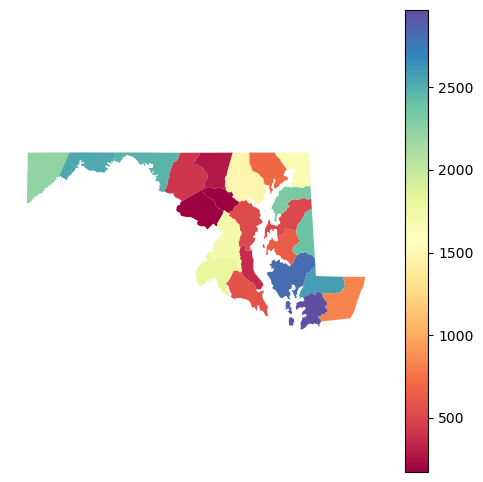

In [129]:
fig, ax = plt.subplots(figsize=(6,6))
MDfull.plot(column = 'QOL_rank', 
              cmap = 'Spectral',  
              legend = True,
              ax = ax)
ax.axis('off');

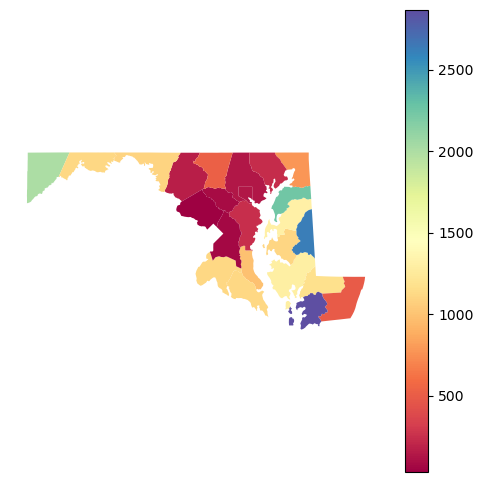

In [130]:
fig, ax = plt.subplots(figsize=(6,6))
MDfull.plot(column = 'PAE_rank', 
              cmap = 'Spectral',  
              legend = True,
              ax = ax)
ax.axis('off');

In [131]:
MI = allcounties.loc[(allcounties['STUSPS'] == 'MI')]
MIfull = pd.merge(left = MI, right = contiguous, how='inner',
                    on = ('County', 'State'))
MIfull.corr()

,ALAND,AWATER,Unnamed: 0,STCOU,Quality of Life,Life Expectancy,Median Household Income,Percent Some College,Percent Access to Exercise,Population,Square Miles,Density,QOL_rank,LE_rank,MHI_rank,PSC_rank,PAE_rank,SQM_rank,POP_rank,DEN_rank
ALAND,1.000000,0.225430,0.548486,0.070798,0.113899,-0.020885,-0.245865,-0.064598,0.082612,-0.027588,0.470387,-0.076675,0.102959,-0.008973,0.279899,0.078713,-0.084031,-0.548481,0.149671,0.349105
AWATER,0.225430,1.000000,0.679584,-0.100386,-0.113818,0.283205,-0.138705,-0.153818,-0.134467,-0.161682,0.965785,-0.192875,-0.087849,-0.284256,0.169088,0.140541,0.079073,-0.679419,0.427216,0.566492
Unnamed: 0,0.548486,0.679584,1.000000,-0.042387,-0.072646,0.195642,-0.155533,-0.080757,0.064772,-0.096012,0.761556,-0.182381,-0.045047,-0.205157,0.193330,0.071516,-0.084882,-1.000000,0.288966,0.583677
STCOU,0.070798,-0.100386,-0.042387,1.000000,0.084624,-0.087351,0.032862,0.012282,0.001721,0.223526,-0.072099,0.211050,0.089811,0.104764,-0.001468,0.023424,0.003843,0.042324,-0.111002,-0.137505
Quality of Life,0.113899,-0.113818,-0.072646,0.084624,1.000000,-0.814387,-0.785209,-0.657266,-0.056304,0.001604,-0.072821,0.041430,0.966414,0.794967,0.761039,0.642483,0.063112,0.072702,0.306601,0.202468
Life Expectancy,-0.020885,0.283205,0.195642,-0.087351,-0.814387,1.000000,0.695428,0.543267,0.125090,-0.005488,0.251010,-0.052163,-0.792016,-0.991324,-0.657629,-0.524951,-0.138249,-0.195613,-0.132920,-0.039476
Median Household Income,-0.245865,-0.138705,-0.155533,0.032862,-0.785209,0.695428,1.000000,0.688002,0.269279,0.324169,-0.191046,0.286867,-0.762217,-0.661820,-0.967074,-0.662412,-0.248925,0.155484,-0.590577,-0.566867
Percent Some College,-0.064598,-0.153818,-0.080757,0.012282,-0.657266,0.543267,0.688002,1.000000,0.407342,0.360765,-0.156538,0.334254,-0.676297,-0.530200,-0.668108,-0.988097,-0.394207,0.080718,-0.561973,-0.471618
Percent Access to Exercise,0.082612,-0.134467,0.064772,0.001721,-0.056304,0.125090,0.269279,0.407342,1.000000,0.450914,-0.099746,0.432862,-0.063502,-0.113595,-0.242538,-0.403504,-0.987944,-0.064753,-0.483361,-0.366020
Population,-0.027588,-0.161682,-0.096012,0.223526,0.001604,-0.005488,0.324169,0.360765,0.450914,1.000000,-0.153827,0.980409,-0.048184,0.011307,-0.289359,-0.337630,-0.435448,0.096004,-0.531818,-0.524841


In [132]:
MIfull = MIfull.to_crs(epsg=2263)
MIfull['centroid'] = MIfull.centroid
MIfull = MIfull.to_crs(epsg=4326)
MIfull['centroid'] = MIfull['centroid'].to_crs(epsg=4326)

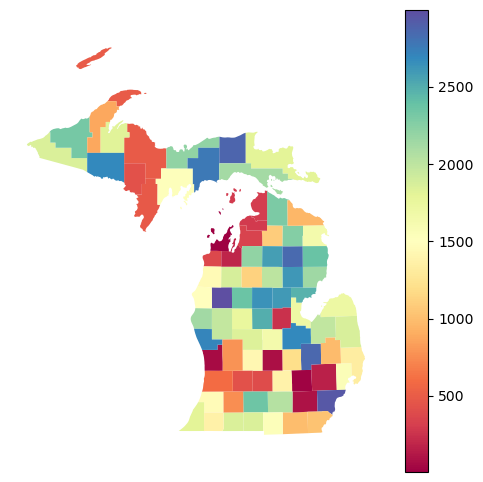

In [133]:
fig, ax = plt.subplots(figsize=(6,6))
MIfull.plot(column = 'QOL_rank', 
              cmap = 'Spectral',  
              legend = True,
              ax = ax)
ax.axis('off');

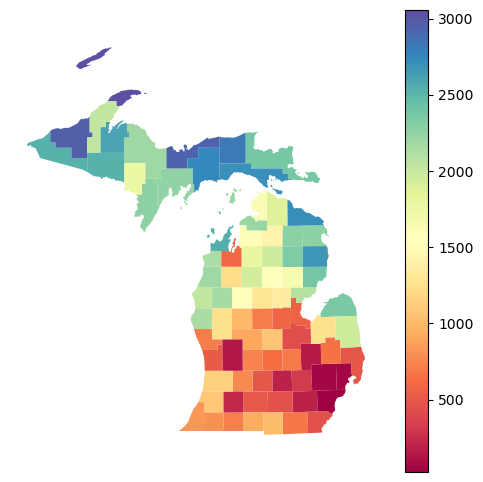

In [134]:
fig, ax = plt.subplots(figsize=(6,6))
MIfull.plot(column = 'DEN_rank', 
              cmap = 'Spectral',  
              legend = True,
              ax = ax)
ax.axis('off');

In [135]:
MN = allcounties.loc[(allcounties['STUSPS'] == 'MN')]
MNfull = pd.merge(left = MN, right = contiguous, how='inner',
                    on = ('County', 'State'))
MNfull.corr()

,ALAND,AWATER,Unnamed: 0,STCOU,Quality of Life,Life Expectancy,Median Household Income,Percent Some College,Percent Access to Exercise,Population,Square Miles,Density,QOL_rank,LE_rank,MHI_rank,PSC_rank,PAE_rank,SQM_rank,POP_rank,DEN_rank
ALAND,1.000000,0.455207,0.713815,-0.052402,0.202409,-0.216725,-0.310193,0.044887,-0.096839,-0.040787,0.973117,-0.175245,0.220689,0.211132,0.292424,-0.063750,0.090054,-0.713708,-0.077262,0.332696
AWATER,0.455207,1.000000,0.440862,-0.185406,0.059483,0.020159,-0.153340,0.154626,0.102903,-0.028086,0.648034,-0.066798,0.072668,0.018205,0.150073,-0.161779,-0.116362,-0.440739,0.076831,0.265099
Unnamed: 0,0.713815,0.440862,1.000000,-0.169656,0.227794,-0.236640,-0.512032,-0.136716,-0.310914,-0.178804,0.724585,-0.325598,0.225631,0.222315,0.445298,0.098121,0.307594,-1.000000,0.124588,0.531647
STCOU,-0.052402,-0.185406,-0.169656,1.000000,-0.064779,0.138671,0.034082,-0.092857,-0.104163,-0.051660,-0.092801,0.007665,-0.081903,-0.113294,-0.060002,0.107526,0.089894,0.169677,0.086559,0.004449
Quality of Life,0.202409,0.059483,0.227794,-0.064779,1.000000,-0.578131,-0.660144,-0.547357,-0.438694,-0.208480,0.188548,-0.146711,0.966234,0.567942,0.616731,0.505299,0.427957,-0.227778,0.318607,0.422248
Life Expectancy,-0.216725,0.020159,-0.236640,0.138671,-0.578131,1.000000,0.533486,0.389879,0.382108,0.140078,-0.180168,0.101449,-0.466654,-0.968671,-0.589534,-0.358026,-0.381537,0.236576,-0.221437,-0.336388
Median Household Income,-0.310193,-0.153340,-0.512032,0.034082,-0.660144,0.533486,1.000000,0.550735,0.614315,0.394317,-0.304968,0.312621,-0.617253,-0.509976,-0.870504,-0.463190,-0.599467,0.511987,-0.629428,-0.776436
Percent Some College,0.044887,0.154626,-0.136716,-0.092857,-0.547357,0.389879,0.550735,1.000000,0.537127,0.376701,0.078398,0.287214,-0.512788,-0.351998,-0.502613,-0.976143,-0.533508,0.136798,-0.401106,-0.396057
Percent Access to Exercise,-0.096839,0.102903,-0.310914,-0.104163,-0.438694,0.382108,0.614315,0.537127,1.000000,0.488389,-0.056182,0.460479,-0.402627,-0.385881,-0.571927,-0.461405,-0.991386,0.311056,-0.634846,-0.670704
Population,-0.040787,-0.028086,-0.178804,-0.051660,-0.208480,0.140078,0.394317,0.376701,0.488389,1.000000,-0.042190,0.825141,-0.209010,-0.152664,-0.318560,-0.299470,-0.448839,0.178963,-0.559141,-0.563666


In [136]:
MS = allcounties.loc[(allcounties['STUSPS'] == 'MS')]
MSfull = pd.merge(left = MS, right = contiguous, how='inner',
                    on = ('County', 'State'))
MSfull.corr()

,ALAND,AWATER,Unnamed: 0,STCOU,Quality of Life,Life Expectancy,Median Household Income,Percent Some College,Percent Access to Exercise,Population,Square Miles,Density,QOL_rank,LE_rank,MHI_rank,PSC_rank,PAE_rank,SQM_rank,POP_rank,DEN_rank
ALAND,1.000000,0.088140,0.954664,0.019760,-0.049463,0.127351,0.009672,-0.015067,0.014682,0.249424,0.931729,0.039857,0.033107,-0.134545,0.014637,-0.001659,-0.023954,-0.954693,-0.277513,-0.002930
AWATER,0.088140,1.000000,0.356536,-0.102133,-0.226535,0.109299,0.166366,0.181132,0.282146,0.552467,0.443822,0.347679,-0.249069,-0.117783,-0.184548,-0.212272,-0.318145,-0.356691,-0.358901,-0.306047
Unnamed: 0,0.954664,0.356536,1.000000,-0.006817,-0.113742,0.154274,0.062034,0.031503,0.090804,0.366328,0.988774,0.117945,-0.042781,-0.169080,-0.041142,-0.053624,-0.106670,-1.000000,-0.351199,-0.076570
STCOU,0.019760,-0.102133,-0.006817,1.000000,0.005707,-0.135034,0.082532,-0.152883,-0.046707,-0.100047,-0.018493,-0.106467,0.032512,0.111772,-0.094293,0.157949,0.048331,0.006885,-0.001196,-0.005563
Quality of Life,-0.049463,-0.226535,-0.113742,0.005707,1.000000,-0.675936,-0.846975,-0.529730,-0.421940,-0.522463,-0.127598,-0.566814,0.962313,0.624963,0.775399,0.528209,0.386758,0.113826,0.616758,0.637075
Life Expectancy,0.127351,0.109299,0.154274,-0.135034,-0.675936,1.000000,0.609968,0.343717,0.224132,0.351615,0.154027,0.378731,-0.630163,-0.881448,-0.570201,-0.351651,-0.254633,-0.154374,-0.359596,-0.346471
Median Household Income,0.009672,0.166366,0.062034,0.082532,-0.846975,0.609968,1.000000,0.525166,0.364939,0.528708,0.069977,0.596492,-0.818756,-0.602243,-0.966620,-0.546639,-0.329169,-0.062180,-0.591055,-0.619393
Percent Some College,-0.015067,0.181132,0.031503,-0.152883,-0.529730,0.343717,0.525166,1.000000,0.471454,0.523709,0.052311,0.568370,-0.510523,-0.387700,-0.526551,-0.978936,-0.463989,-0.031626,-0.645012,-0.684149
Percent Access to Exercise,0.014682,0.282146,0.090804,-0.046707,-0.421940,0.224132,0.364939,0.471454,1.000000,0.522581,0.118827,0.524462,-0.390935,-0.235442,-0.360029,-0.467915,-0.971911,-0.090960,-0.630656,-0.644851
Population,0.249424,0.552467,0.366328,-0.100047,-0.522463,0.351615,0.528708,0.523709,0.522581,1.000000,0.425876,0.924964,-0.496252,-0.365492,-0.538102,-0.572103,-0.549942,-0.366592,-0.798391,-0.759062


In [137]:
MO = allcounties.loc[(allcounties['STUSPS'] == 'MO')]
MOfull = pd.merge(left = MO, right = contiguous, how='inner',
                    on = ('County', 'State'))
MOfull.corr()

,ALAND,AWATER,Unnamed: 0,STCOU,Quality of Life,Life Expectancy,Median Household Income,Percent Some College,Percent Access to Exercise,Population,Square Miles,Density,QOL_rank,LE_rank,MHI_rank,PSC_rank,PAE_rank,SQM_rank,POP_rank,DEN_rank
ALAND,1.000000,0.027622,0.946263,-0.008354,0.206101,-0.181324,-0.205180,-0.147565,0.073495,-0.207704,0.962583,-0.260133,0.222461,0.218096,0.199667,0.159468,-0.030765,-0.946361,-0.076858,0.138313
AWATER,0.027622,1.000000,0.111414,-0.030135,-0.038438,0.048274,0.140712,0.011865,-0.027992,0.079336,0.080568,0.074401,-0.059249,-0.082501,-0.130702,-0.013965,0.041705,-0.111306,-0.125612,-0.102516
Unnamed: 0,0.946263,0.111414,1.000000,0.005779,0.179644,-0.176803,-0.148353,-0.086751,0.115126,-0.039475,0.983847,-0.093301,0.187388,0.213401,0.142311,0.101792,-0.068743,-1.000000,-0.164374,0.060001
STCOU,-0.008354,-0.030135,0.005779,1.000000,0.191837,-0.048532,-0.095829,-0.066867,-0.026683,0.082006,0.018623,0.090033,0.199794,0.055066,0.114973,0.070823,0.033141,-0.005818,0.035625,0.041354
Quality of Life,0.206101,-0.038438,0.179644,0.191837,1.000000,-0.722670,-0.744246,-0.625303,-0.205533,-0.291087,0.184311,-0.293726,0.963037,0.680100,0.735527,0.617779,0.232679,-0.179736,0.326524,0.373772
Life Expectancy,-0.181324,0.048274,-0.176803,-0.048532,-0.722670,1.000000,0.565088,0.493409,0.040556,0.150399,-0.173688,0.156157,-0.668559,-0.976688,-0.550877,-0.487496,-0.079716,0.176801,-0.090654,-0.129698
Median Household Income,-0.205180,0.140712,-0.148353,-0.095829,-0.744246,0.565088,1.000000,0.668677,0.328891,0.419601,-0.161499,0.425168,-0.733175,-0.568793,-0.971168,-0.681534,-0.348331,0.148463,-0.593405,-0.638869
Percent Some College,-0.147565,0.011865,-0.086751,-0.066867,-0.625303,0.493409,0.668677,1.000000,0.570004,0.538030,-0.089974,0.529392,-0.625354,-0.496929,-0.666193,-0.987712,-0.610258,0.086866,-0.599817,-0.632644
Percent Access to Exercise,0.073495,-0.027992,0.115126,-0.026683,-0.205533,0.040556,0.328891,0.570004,1.000000,0.495906,0.130887,0.487662,-0.218386,-0.029922,-0.313319,-0.575094,-0.976232,-0.115130,-0.678628,-0.657853
Population,-0.207704,0.079336,-0.039475,0.082006,-0.291087,0.150399,0.419601,0.538030,0.495906,1.000000,-0.050002,0.993897,-0.309957,-0.152109,-0.412799,-0.536341,-0.525767,0.039585,-0.588993,-0.601127


In [138]:
MT = allcounties.loc[(allcounties['STUSPS'] == 'MT')]
MTfull = pd.merge(left = MT, right = contiguous, how='inner',
                    on = ('County', 'State'))
MTfull.corr()

,ALAND,AWATER,Unnamed: 0,STCOU,Quality of Life,Life Expectancy,Median Household Income,Percent Some College,Percent Access to Exercise,Population,Square Miles,Density,QOL_rank,LE_rank,MHI_rank,PSC_rank,PAE_rank,SQM_rank,POP_rank,DEN_rank
ALAND,1.000000,0.436505,0.750771,-0.290259,0.028572,-0.289487,-0.144729,0.231767,0.041004,0.136065,0.999604,-0.081926,-0.053355,0.224020,0.141254,-0.264548,-0.013172,-0.750581,-0.184107,0.091402
AWATER,0.436505,1.000000,0.293293,-0.068458,-0.051256,-0.053784,-0.119732,0.130541,0.006841,0.190504,0.461632,0.064312,-0.062327,0.036744,0.119812,-0.154110,-0.003774,-0.293222,-0.234658,-0.086797
Unnamed: 0,0.750771,0.293293,1.000000,-0.212764,-0.113557,-0.073700,-0.015546,0.205560,-0.120058,0.152718,0.749398,-0.152112,-0.204867,-0.033055,0.014717,-0.240802,0.155127,-1.000000,-0.143225,0.149554
STCOU,-0.290259,-0.068458,-0.212764,1.000000,0.060142,-0.017186,0.002733,-0.175189,0.130675,0.011856,-0.288276,0.092801,0.132092,0.050179,-0.012292,0.182657,-0.138399,0.212661,0.064821,-0.048061
Quality of Life,0.028572,-0.051256,-0.113557,0.060142,1.000000,-0.755916,-0.605509,-0.410016,-0.001979,-0.210519,0.026761,-0.123761,0.964922,0.738093,0.636047,0.441372,0.036475,0.113632,0.131497,0.115656
Life Expectancy,-0.289487,-0.053784,-0.073700,-0.017186,-0.755916,1.000000,0.413779,0.251811,-0.134564,0.018605,-0.287925,0.000125,-0.668201,-0.934479,-0.450314,-0.238152,0.100431,0.073545,0.104310,0.026165
Median Household Income,-0.144729,-0.119732,-0.015546,0.002733,-0.605509,0.413779,1.000000,0.444682,0.180661,0.338659,-0.146572,0.335174,-0.571322,-0.480241,-0.982737,-0.468235,-0.142134,0.015497,-0.357095,-0.382290
Percent Some College,0.231767,0.130541,0.205560,-0.175189,-0.410016,0.251811,0.444682,1.000000,-0.133269,0.299723,0.232457,0.250686,-0.432445,-0.375220,-0.456845,-0.986532,0.110949,-0.205518,-0.295730,-0.248066
Percent Access to Exercise,0.041004,0.006841,-0.120058,0.130675,-0.001979,-0.134564,0.180661,-0.133269,1.000000,0.488758,0.040678,0.509689,0.031134,0.186306,-0.213076,0.140270,-0.979573,0.120169,-0.576925,-0.567802
Population,0.136065,0.190504,0.152718,0.011856,-0.210519,0.018605,0.338659,0.299723,0.488758,1.000000,0.140087,0.901962,-0.238966,-0.058391,-0.377283,-0.296495,-0.518808,-0.152627,-0.900743,-0.891658


In [165]:
MTfull = MTfull.to_crs(epsg=2263)
MTfull['centroid'] = MTfull.centroid
MTfull = MTfull.to_crs(epsg=4326)
MTfull['centroid'] = MTfull['centroid'].to_crs(epsg=4326)

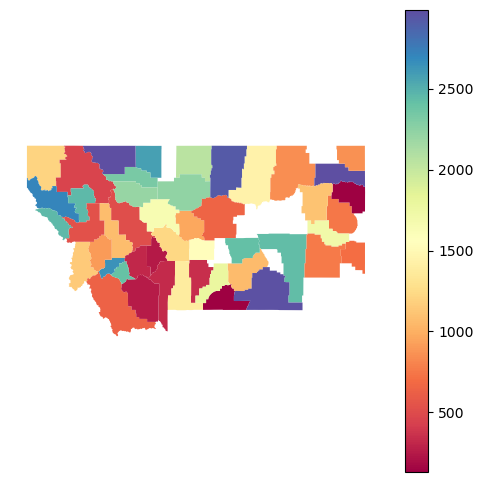

In [166]:
fig, ax = plt.subplots(figsize=(6,6))
MTfull.plot(column = 'QOL_rank', 
              cmap = 'Spectral',  
              legend = True,
              ax = ax)
ax.axis('off');

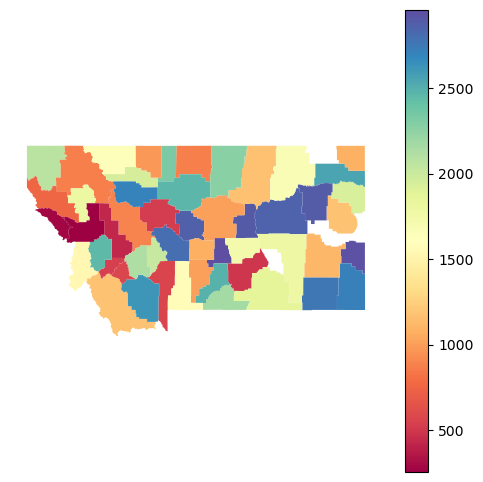

In [167]:
fig, ax = plt.subplots(figsize=(6,6))
MTfull.plot(column = 'PAE_rank', 
              cmap = 'Spectral',  
              legend = True,
              ax = ax)
ax.axis('off');

In [139]:
NE = allcounties.loc[(allcounties['STUSPS'] == 'NE')]
NEfull = pd.merge(left = NE, right = contiguous, how='inner',
                    on = ('County', 'State'))
NEfull.corr()

,ALAND,AWATER,Unnamed: 0,STCOU,Quality of Life,Life Expectancy,Median Household Income,Percent Some College,Percent Access to Exercise,Population,Square Miles,Density,QOL_rank,LE_rank,MHI_rank,PSC_rank,PAE_rank,SQM_rank,POP_rank,DEN_rank
ALAND,1.000000,0.550901,0.706798,-0.132416,0.012029,0.010104,-0.170632,0.079406,0.075905,-0.084888,0.999950,-0.121223,0.014095,-0.011757,0.154093,-0.096943,-0.085528,-0.706671,0.057088,0.269721
AWATER,0.550901,1.000000,0.334004,-0.051258,0.039464,-0.008817,-0.023771,0.086550,0.201278,0.118811,0.559183,0.104550,0.032167,-0.000612,0.031979,-0.093862,-0.180806,-0.333913,-0.139940,-0.042666
Unnamed: 0,0.706798,0.334004,1.000000,-0.199810,0.108199,0.045618,-0.267088,0.160610,0.067453,-0.172176,0.706032,-0.256715,0.122492,-0.006815,0.230082,-0.164061,-0.104039,-1.000000,0.128165,0.396364
STCOU,-0.132416,-0.051258,-0.199810,1.000000,-0.006388,-0.106667,0.079065,0.032570,-0.068883,-0.023174,-0.131986,-0.013500,-0.048822,0.078673,-0.028455,-0.043735,0.104430,0.199874,-0.008329,-0.055205
Quality of Life,0.012029,0.039464,0.108199,-0.006388,1.000000,-0.557621,-0.530759,-0.394180,-0.062423,-0.159467,0.012418,-0.156508,0.975495,0.551101,0.529443,0.420210,0.029032,-0.108252,0.210841,0.214452
Life Expectancy,0.010104,-0.008817,0.045618,-0.106667,-0.557621,1.000000,0.398796,0.335876,0.068419,0.047457,0.010022,0.043619,-0.468425,-0.948881,-0.424980,-0.326673,-0.061868,-0.045614,-0.059343,-0.045578
Median Household Income,-0.170632,-0.023771,-0.267088,0.079065,-0.530759,0.398796,1.000000,-0.038586,0.327008,0.317289,-0.169772,0.318352,-0.526504,-0.466248,-0.969411,-0.017639,-0.284023,0.267144,-0.584536,-0.596185
Percent Some College,0.079406,0.086550,0.160610,0.032570,-0.394180,0.335876,-0.038586,1.000000,-0.037175,0.056608,0.079765,0.064693,-0.392508,-0.326892,0.084012,-0.959633,0.061349,-0.160584,0.145293,0.188580
Percent Access to Exercise,0.075905,0.201278,0.067453,-0.068883,-0.062423,0.068419,0.327008,-0.037175,1.000000,0.419287,0.077942,0.359942,-0.053183,-0.102362,-0.337858,0.026442,-0.977341,-0.067386,-0.683190,-0.625830
Population,-0.084888,0.118811,-0.172176,-0.023174,-0.159467,0.047457,0.317289,0.056608,0.419287,1.000000,-0.082859,0.949399,-0.165656,-0.078964,-0.296422,-0.074555,-0.420283,0.172185,-0.669580,-0.664165


In [140]:
NV = allcounties.loc[(allcounties['STUSPS'] == 'NV')]
NVfull = pd.merge(left = NV, right = contiguous, how='inner',
                    on = ('County', 'State'))
NVfull.corr()

,ALAND,AWATER,Unnamed: 0,STCOU,Quality of Life,Life Expectancy,Median Household Income,Percent Some College,Percent Access to Exercise,Population,Square Miles,Density,QOL_rank,LE_rank,MHI_rank,PSC_rank,PAE_rank,SQM_rank,POP_rank,DEN_rank
ALAND,1.000000,-0.011187,0.502744,0.004856,0.249054,-0.166060,-0.115861,-0.356929,-0.046308,0.058440,0.999903,-0.061747,0.237437,0.139401,0.070029,0.405673,0.065260,-0.502675,-0.277947,0.252491
AWATER,-0.011187,1.000000,0.205935,0.002456,-0.192781,-0.129305,0.103951,0.332420,0.600384,0.670314,0.002622,0.673798,-0.215575,0.066634,-0.134459,-0.356538,-0.605592,-0.205924,-0.687160,-0.728754
Unnamed: 0,0.502744,0.205935,1.000000,-0.181864,0.500084,-0.536871,-0.317573,-0.653710,0.256698,0.123838,0.505819,0.006343,0.465960,0.443030,0.265251,0.664090,-0.235026,-1.000000,-0.146361,0.213124
STCOU,0.004856,0.002456,-0.181864,1.000000,0.052860,0.109739,-0.047545,-0.186514,-0.314741,-0.283969,0.004246,-0.305338,0.094246,-0.100001,0.014783,0.172032,0.343247,0.181904,0.203964,0.163600
Quality of Life,0.249054,-0.192781,0.500084,0.052860,1.000000,-0.739923,-0.388301,-0.460849,0.127339,-0.070832,0.246041,-0.152439,0.986972,0.724574,0.525667,0.501781,-0.134637,-0.500097,0.121908,0.336242
Life Expectancy,-0.166060,-0.129305,-0.536871,0.109739,-0.739923,1.000000,0.467204,0.263718,-0.229911,0.064987,-0.167134,0.144652,-0.713094,-0.985181,-0.557734,-0.288064,0.260156,0.536888,0.076030,-0.240428
Median Household Income,-0.115861,0.103951,-0.317573,-0.047545,-0.388301,0.467204,1.000000,0.440698,0.445807,0.001754,-0.114162,0.106786,-0.449626,-0.448410,-0.964643,-0.465389,-0.405451,0.317568,-0.282555,-0.341680
Percent Some College,-0.356929,0.332420,-0.653710,-0.186514,-0.460849,0.263718,0.440698,1.000000,0.281162,0.197733,-0.352649,0.316664,-0.480897,-0.175236,-0.369478,-0.992589,-0.338434,0.653703,-0.413478,-0.587688
Percent Access to Exercise,-0.046308,0.600384,0.256698,-0.314741,0.127339,-0.229911,0.445807,0.281162,1.000000,0.450144,-0.037478,0.488976,0.067242,0.169477,-0.413821,-0.297471,-0.990774,-0.256718,-0.525843,-0.524812
Population,0.058440,0.670314,0.123838,-0.283969,-0.070832,0.064987,0.001754,0.197733,0.450144,1.000000,0.068455,0.975024,-0.058007,-0.115869,-0.063653,-0.196158,-0.427314,-0.123820,-0.572167,-0.732003


In [141]:
NC = allcounties.loc[(allcounties['STUSPS'] == 'NC')]
NCfull = pd.merge(left = NC, right = contiguous, how='inner',
                    on = ('County', 'State'))
NCfull.corr()

,ALAND,AWATER,Unnamed: 0,STCOU,Quality of Life,Life Expectancy,Median Household Income,Percent Some College,Percent Access to Exercise,Population,Square Miles,Density,QOL_rank,LE_rank,MHI_rank,PSC_rank,PAE_rank,SQM_rank,POP_rank,DEN_rank
ALAND,1.000000,-0.000786,0.881285,-0.000579,0.111448,-0.118633,0.005112,0.003526,-0.137546,0.246612,0.753377,0.044611,0.101579,0.112479,0.036912,0.004967,0.151537,-0.881353,-0.413373,-0.073152
AWATER,-0.000786,1.000000,0.451741,-0.124872,-0.271316,0.110651,0.174356,0.093132,0.097291,-0.075769,0.656774,-0.119249,-0.252337,-0.119430,-0.188381,-0.120066,-0.119711,-0.451663,0.163711,0.408632
Unnamed: 0,0.881285,0.451741,1.000000,-0.061393,-0.047905,-0.038566,0.095763,0.052808,-0.072738,0.189316,0.962027,-0.016315,-0.052674,0.026178,-0.064877,-0.068900,0.073327,-1.000000,-0.281096,0.132784
STCOU,-0.000579,-0.124872,-0.061393,1.000000,0.080998,-0.082158,-0.048893,-0.031809,0.085171,0.057184,-0.081771,0.014175,0.087369,0.098717,0.081760,0.043620,-0.079804,0.061397,-0.009867,-0.042199
Quality of Life,0.111448,-0.271316,-0.047905,0.080998,1.000000,-0.813473,-0.814350,-0.705102,-0.464544,-0.381456,-0.095464,-0.386830,0.969538,0.812402,0.823876,0.743443,0.489029,0.047767,0.280611,0.278968
Life Expectancy,-0.118633,0.110651,-0.038566,-0.082158,-0.813473,1.000000,0.706666,0.582662,0.353009,0.358280,-0.016202,0.372474,-0.797261,-0.987910,-0.693152,-0.598185,-0.390919,0.038681,-0.176184,-0.212082
Median Household Income,0.005112,0.174356,0.095763,-0.048893,-0.814350,0.706666,1.000000,0.695877,0.297937,0.500304,0.120416,0.493621,-0.784811,-0.712718,-0.966509,-0.691167,-0.329492,-0.095661,-0.446242,-0.412219
Percent Some College,0.003526,0.093132,0.052808,-0.031809,-0.705102,0.582662,0.695877,1.000000,0.462499,0.532067,0.066239,0.550895,-0.691391,-0.576179,-0.698873,-0.982990,-0.484301,-0.052704,-0.535119,-0.526181
Percent Access to Exercise,-0.137546,0.097291,-0.072738,0.085171,-0.464544,0.353009,0.297937,0.462499,1.000000,0.285826,-0.039144,0.324684,-0.478416,-0.377891,-0.303375,-0.483541,-0.990637,0.072814,-0.170760,-0.205525
Population,0.246612,-0.075769,0.189316,0.057184,-0.381456,0.358280,0.500304,0.532067,0.285826,1.000000,0.137022,0.931910,-0.365605,-0.355064,-0.448746,-0.506347,-0.311909,-0.189317,-0.557426,-0.519841


In [142]:
ND = allcounties.loc[(allcounties['STUSPS'] == 'ND')]
NDfull = pd.merge(left = ND, right = contiguous, how='inner',
                    on = ('County', 'State'))
NDfull.corr()

,ALAND,AWATER,Unnamed: 0,STCOU,Quality of Life,Life Expectancy,Median Household Income,Percent Some College,Percent Access to Exercise,Population,Square Miles,Density,QOL_rank,LE_rank,MHI_rank,PSC_rank,PAE_rank,SQM_rank,POP_rank,DEN_rank
ALAND,1.000000,0.546795,0.839654,-0.022230,-0.146770,-0.152860,0.355249,-0.109098,0.133976,0.361903,0.997623,0.278881,-0.128372,0.088495,-0.289766,0.068642,-0.156186,-0.839361,-0.544894,-0.320520
AWATER,0.546795,1.000000,0.435307,0.086814,0.089908,-0.194799,0.226022,-0.178754,-0.002347,-0.032907,0.603184,-0.082496,0.107656,0.189085,-0.154822,0.144310,-0.008223,-0.435086,-0.126093,0.030328
Unnamed: 0,0.839654,0.435307,1.000000,-0.070083,0.018445,-0.154917,0.128300,-0.172309,0.022150,0.300301,0.835680,0.240860,0.040144,0.045182,-0.077502,0.117673,-0.058131,-1.000000,-0.445330,-0.263260
STCOU,-0.022230,0.086814,-0.070083,1.000000,0.089978,-0.053694,0.034243,-0.243729,0.115340,-0.072445,-0.013923,-0.076228,0.096716,0.027975,-0.055032,0.193421,-0.097221,0.069901,-0.126592,-0.033361
Quality of Life,-0.146770,0.089908,0.018445,0.089978,1.000000,-0.482834,-0.601611,-0.455779,-0.167209,-0.157509,-0.132249,-0.130824,0.951173,0.473484,0.680553,0.478731,0.184829,-0.018575,0.135284,0.122134
Life Expectancy,-0.152860,-0.194799,-0.154917,-0.053694,-0.482834,1.000000,0.309050,0.458488,-0.101068,0.006621,-0.161514,0.001349,-0.349286,-0.906921,-0.335023,-0.484679,0.084334,0.154819,0.095830,0.062316
Median Household Income,0.355249,0.226022,0.128300,0.034243,-0.601611,0.309050,1.000000,0.099471,0.348955,0.165681,0.357030,0.133762,-0.582780,-0.321491,-0.968414,-0.133451,-0.307033,-0.128174,-0.294835,-0.193308
Percent Some College,-0.109098,-0.178754,-0.172309,-0.243729,-0.455779,0.458488,0.099471,1.000000,0.163966,0.220384,-0.118673,0.245996,-0.422141,-0.414014,-0.141925,-0.979224,-0.188537,0.172484,-0.129660,-0.221063
Percent Access to Exercise,0.133976,-0.002347,0.022150,0.115340,-0.167209,-0.101068,0.348955,0.163966,1.000000,0.461794,0.127523,0.467393,-0.145899,0.091695,-0.422022,-0.145921,-0.971251,-0.021987,-0.557086,-0.562005
Population,0.361903,-0.032907,0.300301,-0.072445,-0.157509,0.006621,0.165681,0.220384,0.461794,1.000000,0.342028,0.990698,-0.189860,-0.086409,-0.189966,-0.191161,-0.511969,-0.300158,-0.856365,-0.936792


In [143]:
OK = allcounties.loc[(allcounties['STUSPS'] == 'OK')]
OKfull = pd.merge(left = OK, right = contiguous, how='inner',
                    on = ('County', 'State'))
OKfull.corr()

,ALAND,AWATER,Unnamed: 0,STCOU,Quality of Life,Life Expectancy,Median Household Income,Percent Some College,Percent Access to Exercise,Population,Square Miles,Density,QOL_rank,LE_rank,MHI_rank,PSC_rank,PAE_rank,SQM_rank,POP_rank,DEN_rank
ALAND,1.000000,0.046359,0.860146,-0.039342,-0.141515,0.183850,0.106026,-0.101220,-0.233568,-0.133172,0.998901,-0.191196,-0.153877,-0.170548,-0.117563,0.113524,0.198854,-0.859996,0.091941,0.377936
AWATER,0.046359,1.000000,-0.021301,0.134528,0.288491,-0.031218,-0.210946,-0.155283,-0.069990,0.006335,0.093126,-0.005117,0.305830,0.054834,0.217849,0.166484,0.128904,0.021325,-0.264484,-0.180775
Unnamed: 0,0.860146,-0.021301,1.000000,-0.148332,-0.185032,0.101919,0.117765,-0.088633,-0.193325,-0.140557,0.856409,-0.213088,-0.183356,-0.066643,-0.123903,0.106488,0.179030,-1.000000,0.074273,0.352229
STCOU,-0.039342,0.134528,-0.148332,1.000000,-0.031654,0.016504,0.049225,0.151395,0.176840,0.142702,-0.033016,0.160679,-0.058455,-0.010179,-0.059073,-0.136638,-0.148431,0.148536,-0.165126,-0.173252
Quality of Life,-0.141515,0.288491,-0.185032,-0.031654,1.000000,-0.574124,-0.696691,-0.506596,-0.201519,-0.139577,-0.127531,-0.144931,0.980620,0.576015,0.705272,0.501667,0.247503,0.185040,0.014125,0.047105
Life Expectancy,0.183850,-0.031218,0.101919,0.016504,-0.574124,1.000000,0.516627,0.464705,0.109141,0.171126,0.181873,0.179812,-0.594663,-0.970254,-0.514167,-0.461059,-0.144092,-0.101836,-0.106389,-0.135843
Median Household Income,0.106026,-0.210946,0.117765,0.049225,-0.696691,0.516627,1.000000,0.482130,0.300534,0.234417,0.095793,0.228062,-0.720993,-0.532127,-0.991867,-0.488442,-0.332977,-0.117727,-0.284556,-0.283448
Percent Some College,-0.101220,-0.155283,-0.088633,0.151395,-0.506596,0.464705,0.482130,1.000000,0.477263,0.444787,-0.108165,0.448109,-0.531329,-0.476863,-0.473193,-0.989447,-0.506319,0.088736,-0.444345,-0.513533
Percent Access to Exercise,-0.233568,-0.069990,-0.193325,0.176840,-0.201519,0.109141,0.300534,0.477263,1.000000,0.554866,-0.236013,0.545274,-0.200286,-0.098999,-0.294335,-0.480164,-0.973975,0.193259,-0.567147,-0.591131
Population,-0.133172,0.006335,-0.140557,0.142702,-0.139577,0.171126,0.234417,0.444787,0.554866,1.000000,-0.132445,0.989329,-0.165248,-0.169856,-0.251316,-0.475174,-0.583861,0.140605,-0.552664,-0.601936


In [144]:
RI = allcounties.loc[(allcounties['STUSPS'] == 'RI')]
RIfull = pd.merge(left = RI, right = contiguous, how='inner',
                    on = ('County', 'State'))
RIfull.corr()

,ALAND,AWATER,Unnamed: 0,STCOU,Quality of Life,Life Expectancy,Median Household Income,Percent Some College,Percent Access to Exercise,Population,Square Miles,Density,QOL_rank,LE_rank,MHI_rank,PSC_rank,PAE_rank,SQM_rank,POP_rank,DEN_rank
ALAND,1.000000,0.104975,0.812012,0.843635,0.763241,-0.602016,-0.800450,-0.728022,0.441828,0.783088,0.842641,0.191330,0.744707,0.579516,0.767363,0.705272,-0.421414,-0.811812,-0.878088,0.055690
AWATER,0.104975,1.000000,0.586155,0.621697,-0.444390,0.652982,0.044859,0.415227,-0.494770,-0.381016,0.623956,-0.909635,-0.483738,-0.659353,-0.254996,-0.516583,0.470620,-0.586110,0.121151,0.990221
Unnamed: 0,0.812012,0.586155,1.000000,0.962843,0.271341,-0.075407,-0.426969,-0.204534,0.247058,0.337586,0.955442,-0.301692,0.221044,0.019188,0.350201,0.160826,-0.268087,-0.999998,-0.484224,0.552389
STCOU,0.843635,0.621697,0.962843,1.000000,0.357081,-0.113225,-0.594926,-0.335657,0.101672,0.409993,0.999559,-0.334540,0.318053,0.089791,0.462960,0.267355,-0.099964,-0.962698,-0.613322,0.576676
Quality of Life,0.763241,-0.444390,0.271341,0.357081,1.000000,-0.814042,-0.887810,-0.925800,0.581090,0.990296,0.359207,0.698553,0.989034,0.849884,0.964662,0.973825,-0.513355,-0.271444,-0.867939,-0.519101
Life Expectancy,-0.602016,0.652982,-0.075407,-0.113225,-0.814042,1.000000,0.596276,0.900846,-0.427683,-0.739084,-0.119443,-0.692100,-0.878591,-0.990015,-0.639800,-0.899815,0.400526,0.074707,0.790415,0.646202
Median Household Income,-0.800450,0.044859,-0.426969,-0.594926,-0.887810,0.596276,1.000000,0.875660,-0.237059,-0.885987,-0.604796,-0.319240,-0.876393,-0.660063,-0.944127,-0.860484,0.158671,0.426890,0.920486,0.129541
Percent Some College,-0.728022,0.415227,-0.204534,-0.335657,-0.925800,0.900846,0.875660,1.000000,-0.293797,-0.870337,-0.347263,-0.553616,-0.968208,-0.937354,-0.851646,-0.980155,0.232806,0.203980,0.947311,0.451204
Percent Access to Exercise,0.441828,-0.494770,0.247058,0.101672,0.581090,-0.427683,-0.237059,-0.293797,1.000000,0.639555,0.079347,0.752922,0.503628,0.383597,0.520100,0.451826,-0.994168,-0.248058,-0.223226,-0.555769
Population,0.783088,-0.381016,0.337586,0.409993,0.990296,-0.739084,-0.885987,-0.870337,0.639555,1.000000,0.409136,0.678773,0.959329,0.773471,0.980461,0.932866,-0.571937,-0.337896,-0.832680,-0.468494


In [145]:
RIfull = RIfull.to_crs(epsg=2263)
RIfull['centroid'] = RIfull.centroid
RIfull = RIfull.to_crs(epsg=4326)
RIfull['centroid'] = RIfull['centroid'].to_crs(epsg=4326)

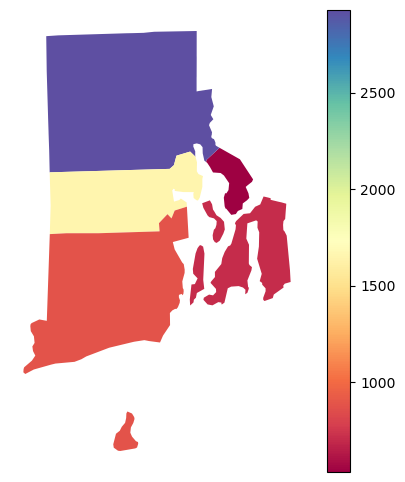

In [146]:
fig, ax = plt.subplots(figsize=(6,6))
RIfull.plot(column = 'QOL_rank', 
              cmap = 'Spectral',  
              legend = True,
              ax = ax)
ax.axis('off');

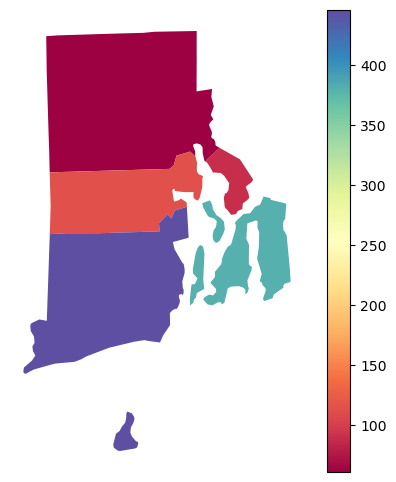

In [147]:
fig, ax = plt.subplots(figsize=(6,6))
RIfull.plot(column = 'DEN_rank', 
              cmap = 'Spectral',  
              legend = True,
              ax = ax)
ax.axis('off');

In [148]:
SD = allcounties.loc[(allcounties['STUSPS'] == 'SD')]
SDfull = pd.merge(left = SD, right = contiguous, how='inner',
                    on = ('County', 'State'))
SDfull.corr()

,ALAND,AWATER,Unnamed: 0,STCOU,Quality of Life,Life Expectancy,Median Household Income,Percent Some College,Percent Access to Exercise,Population,Square Miles,Density,QOL_rank,LE_rank,MHI_rank,PSC_rank,PAE_rank,SQM_rank,POP_rank,DEN_rank
ALAND,1.000000,0.202798,0.812421,0.071713,0.399467,-0.225594,-0.272980,-0.192696,0.066864,0.073850,0.999389,-0.176391,0.446968,0.271729,0.277849,0.220537,-0.039262,-0.812260,-0.056529,0.295073
AWATER,0.202798,1.000000,0.317209,-0.068912,0.180016,-0.201703,-0.146232,-0.110575,-0.070175,-0.134312,0.236901,-0.162144,0.167732,0.285281,0.180092,0.132842,0.083309,-0.317249,0.159324,0.228745
Unnamed: 0,0.812421,0.317209,1.000000,0.022002,0.388674,-0.168696,-0.322255,-0.183233,0.007148,0.008552,0.817371,-0.206678,0.459140,0.280789,0.349200,0.222676,0.032632,-1.000000,0.069322,0.406668
STCOU,0.071713,-0.068912,0.022002,1.000000,0.019667,0.140354,0.094808,0.038352,-0.061278,0.105011,0.068696,0.093998,-0.019743,-0.052305,-0.048585,-0.059879,0.063914,-0.021904,-0.012067,-0.028920
Quality of Life,0.399467,0.180016,0.388674,0.019667,1.000000,-0.759291,-0.745071,-0.728324,0.028839,-0.107664,0.402120,-0.161149,0.958523,0.697004,0.722725,0.724951,-0.009110,-0.388619,0.169566,0.286298
Life Expectancy,-0.225594,-0.201703,-0.168696,0.140354,-0.759291,1.000000,0.720222,0.658776,0.232296,0.083048,-0.230629,0.122609,-0.694218,-0.906683,-0.673995,-0.641450,-0.228701,0.168631,-0.157828,-0.216872
Median Household Income,-0.272980,-0.146232,-0.322255,0.094808,-0.745071,0.720222,1.000000,0.570752,0.306915,0.305430,-0.275991,0.362395,-0.708930,-0.663635,-0.961483,-0.588179,-0.356492,0.322263,-0.442292,-0.512652
Percent Some College,-0.192696,-0.110575,-0.183233,0.038352,-0.728324,0.658776,0.570752,1.000000,0.073282,0.187701,-0.195081,0.223808,-0.677929,-0.667754,-0.550369,-0.987474,-0.094931,0.183069,-0.226889,-0.284515
Percent Access to Exercise,0.066864,-0.070175,0.007148,-0.061278,0.028839,0.232296,0.306915,0.073282,1.000000,0.461247,0.063910,0.450876,0.026425,-0.270715,-0.298513,-0.093616,-0.978424,-0.007231,-0.623390,-0.579993
Population,0.073850,-0.134312,0.008552,0.105011,-0.107664,0.083048,0.305430,0.187701,0.461247,1.000000,0.068453,0.908288,-0.098535,-0.087941,-0.326525,-0.214515,-0.493886,-0.008622,-0.815765,-0.764732


In [168]:
SDfull = SDfull.to_crs(epsg=2263)
SDfull['centroid'] = SDfull.centroid
SDfull = SDfull.to_crs(epsg=4326)
SDfull['centroid'] = SDfull['centroid'].to_crs(epsg=4326)

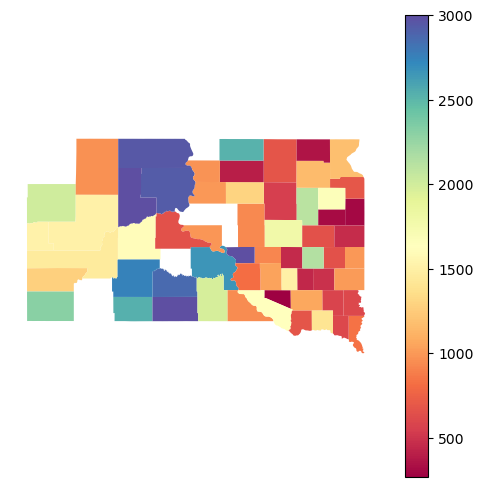

In [169]:
fig, ax = plt.subplots(figsize=(6,6))
SDfull.plot(column = 'QOL_rank', 
              cmap = 'Spectral',  
              legend = True,
              ax = ax)
ax.axis('off');

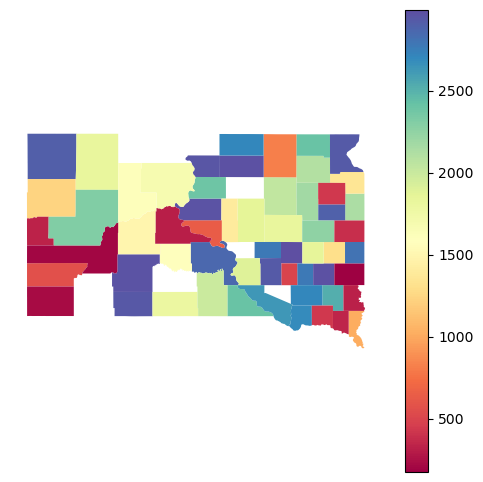

In [171]:
fig, ax = plt.subplots(figsize=(6,6))
SDfull.plot(column = 'PAE_rank', 
              cmap = 'Spectral',  
              legend = True,
              ax = ax)
ax.axis('off');

In [149]:
UT = allcounties.loc[(allcounties['STUSPS'] == 'UT')]
UTfull = pd.merge(left = UT, right = contiguous, how='inner',
                    on = ('County', 'State'))
UTfull.corr()

,ALAND,AWATER,Unnamed: 0,STCOU,Quality of Life,Life Expectancy,Median Household Income,Percent Some College,Percent Access to Exercise,Population,Square Miles,Density,QOL_rank,LE_rank,MHI_rank,PSC_rank,PAE_rank,SQM_rank,POP_rank,DEN_rank
ALAND,1.000000,0.328640,0.737047,-0.056851,0.374658,-0.426892,-0.318237,-0.501913,-0.331117,-0.295464,0.996465,-0.346006,0.353487,0.415895,0.253463,0.473941,0.329093,-0.736837,0.136385,0.493196
AWATER,0.328640,1.000000,0.075869,-0.219505,-0.143135,-0.016932,0.187573,-0.017088,0.149625,0.087713,0.406808,0.067223,-0.160327,-0.065613,-0.277204,-0.000952,-0.183677,-0.075723,-0.307039,-0.079664
Unnamed: 0,0.737047,0.075869,1.000000,-0.015050,0.392677,-0.270015,-0.378682,-0.390139,-0.329352,-0.323464,0.719844,-0.456062,0.372424,0.328785,0.278486,0.319532,0.358989,-1.000000,0.129231,0.482235
STCOU,-0.056851,-0.219505,-0.015050,1.000000,-0.007757,0.156590,0.218304,-0.063936,-0.011124,0.195322,-0.074859,0.112602,-0.019149,-0.089899,-0.166070,0.071307,0.003824,0.015041,-0.267778,-0.248902
Quality of Life,0.374658,-0.143135,0.392677,-0.007757,1.000000,-0.703206,-0.764119,-0.630864,-0.624917,-0.315682,0.349325,-0.272318,0.987747,0.773809,0.740742,0.578914,0.635878,-0.392637,0.323865,0.468535
Life Expectancy,-0.426892,-0.016932,-0.270015,0.156590,-0.703206,1.000000,0.654783,0.621449,0.458495,0.109187,-0.414447,0.073020,-0.701947,-0.916441,-0.562299,-0.604579,-0.438944,0.269813,-0.176215,-0.284915
Median Household Income,-0.318237,0.187573,-0.378682,0.218304,-0.764119,0.654783,1.000000,0.559941,0.648756,0.294179,-0.291275,0.276238,-0.766416,-0.576577,-0.856399,-0.505995,-0.652540,0.378691,-0.430062,-0.458962
Percent Some College,-0.501913,-0.017088,-0.390139,-0.063936,-0.630864,0.621449,0.559941,1.000000,0.567522,0.268517,-0.487016,0.204587,-0.666125,-0.620905,-0.482191,-0.984896,-0.555586,0.390002,-0.208074,-0.409819
Percent Access to Exercise,-0.331117,0.149625,-0.329352,-0.011124,-0.624917,0.458495,0.648756,0.567522,1.000000,0.392886,-0.306550,0.367947,-0.633292,-0.567203,-0.737401,-0.548746,-0.990435,0.329330,-0.523999,-0.541835
Population,-0.295464,0.087713,-0.323464,0.195322,-0.315682,0.109187,0.294179,0.268517,0.392886,1.000000,-0.278141,0.943120,-0.346687,-0.224691,-0.371944,-0.276892,-0.413372,0.323216,-0.630542,-0.773031


In [150]:
VT = allcounties.loc[(allcounties['STUSPS'] == 'VT')]
VTfull = pd.merge(left = VT, right = contiguous, how='inner',
                    on = ('County', 'State'))
VTfull.corr()

,ALAND,AWATER,Unnamed: 0,STCOU,Quality of Life,Life Expectancy,Median Household Income,Percent Some College,Percent Access to Exercise,Population,Square Miles,Density,QOL_rank,LE_rank,MHI_rank,PSC_rank,PAE_rank,SQM_rank,POP_rank,DEN_rank
ALAND,1.000000,-0.677595,0.982941,0.331393,0.405316,-0.451777,-0.440583,-0.120491,0.382621,0.146266,0.991252,-0.090236,0.402912,0.470546,0.271622,0.107980,-0.376746,-0.983021,-0.540093,-0.069423
AWATER,-0.677595,1.000000,-0.568819,-0.272796,-0.642692,0.491382,0.749669,0.297459,-0.195598,0.297141,-0.574700,0.427109,-0.642126,-0.421355,-0.594856,-0.233398,0.199063,0.568916,0.133921,-0.232414
Unnamed: 0,0.982941,-0.568819,1.000000,0.262220,0.386759,-0.419265,-0.361517,-0.115014,0.363870,0.223815,0.992146,-0.010683,0.388531,0.452916,0.208813,0.123155,-0.355100,-0.999999,-0.573968,-0.107038
STCOU,0.331393,-0.272796,0.262220,1.000000,0.146078,-0.291589,-0.196965,-0.078686,-0.010289,-0.028719,0.318249,-0.132438,0.114760,0.213694,0.072221,0.042525,0.023886,-0.262376,-0.187614,-0.102025
Quality of Life,0.405316,-0.642692,0.386759,0.146078,1.000000,-0.786861,-0.747153,-0.656313,-0.171402,-0.400977,0.337245,-0.475008,0.990804,0.732749,0.651337,0.644964,0.182417,-0.386484,0.096076,0.396866
Life Expectancy,-0.451777,0.491382,-0.419265,-0.291589,-0.786861,1.000000,0.569542,0.472698,-0.088989,0.314972,-0.416161,0.436638,-0.787917,-0.979558,-0.425625,-0.403242,0.083463,0.419061,0.079369,-0.158853
Median Household Income,-0.440583,0.749669,-0.361517,-0.196965,-0.747153,0.569542,1.000000,0.703171,0.268147,0.504803,-0.356308,0.580689,-0.748315,-0.469524,-0.953263,-0.682306,-0.265048,0.361565,-0.226535,-0.546336
Percent Some College,-0.120491,0.297459,-0.115014,-0.078686,-0.656313,0.472698,0.703171,1.000000,0.732836,0.752384,-0.083071,0.777204,-0.665305,-0.386608,-0.701230,-0.975300,-0.730959,0.114928,-0.606907,-0.827759
Percent Access to Exercise,0.382621,-0.195598,0.363870,-0.010289,-0.171402,-0.088989,0.268147,0.732836,1.000000,0.669532,0.388623,0.582874,-0.166426,0.199078,-0.374660,-0.733698,-0.996167,-0.364089,-0.822010,-0.780294
Population,0.146266,0.297141,0.223815,-0.028719,-0.400977,0.314972,0.504803,0.752384,0.669532,1.000000,0.213657,0.969411,-0.389947,-0.192067,-0.472185,-0.616915,-0.666632,-0.223770,-0.759556,-0.821324


In [151]:
OR = allcounties.loc[(allcounties['STUSPS'] == 'OR')]
ORfull = pd.merge(left = OR, right = contiguous, how='inner',
                    on = ('County', 'State'))
ORfull.corr()

,ALAND,AWATER,Unnamed: 0,STCOU,Quality of Life,Life Expectancy,Median Household Income,Percent Some College,Percent Access to Exercise,Population,Square Miles,Density,QOL_rank,LE_rank,MHI_rank,PSC_rank,PAE_rank,SQM_rank,POP_rank,DEN_rank
ALAND,1.000000,0.161206,0.600343,-0.074225,0.500324,-0.428601,-0.529893,-0.225978,-0.368204,-0.213402,0.999287,-0.262982,0.462377,0.459757,0.572488,0.217583,0.424615,-0.600170,0.236776,0.493987
AWATER,0.161206,1.000000,0.230814,-0.245030,0.184708,-0.390975,-0.354551,-0.221234,0.120234,-0.134734,0.198348,-0.142016,0.122303,0.391579,0.354200,0.225807,-0.111766,-0.230864,-0.013228,0.146316
Unnamed: 0,0.600343,0.230814,1.000000,-0.105624,0.561681,-0.473721,-0.665144,-0.415727,-0.261692,-0.407341,0.605045,-0.604659,0.583854,0.512339,0.614562,0.375955,0.274066,-1.000000,0.235563,0.572822
STCOU,-0.074225,-0.245030,-0.105624,1.000000,-0.065913,0.024530,-0.005502,-0.063879,-0.213178,0.124560,-0.083061,0.198359,-0.100822,-0.081297,-0.018583,0.029026,0.205841,0.105458,0.077137,0.017259
Quality of Life,0.500324,0.184708,0.561681,-0.065913,1.000000,-0.513784,-0.653226,-0.620610,-0.579354,-0.497522,0.504144,-0.416261,0.977564,0.618116,0.592615,0.595931,0.593005,-0.561708,0.455987,0.666307
Life Expectancy,-0.428601,-0.390975,-0.473721,0.024530,-0.513784,1.000000,0.589048,0.492726,0.258931,0.214469,-0.440681,0.192190,-0.534770,-0.949613,-0.597628,-0.486483,-0.298054,0.473672,0.088898,-0.273591
Median Household Income,-0.529893,-0.354551,-0.665144,-0.005502,-0.653226,0.589048,1.000000,0.397613,0.452949,0.550356,-0.539893,0.472688,-0.645564,-0.648758,-0.954587,-0.389916,-0.453044,0.665139,-0.453744,-0.677128
Percent Some College,-0.225978,-0.221234,-0.415727,-0.063879,-0.620610,0.492726,0.397613,1.000000,0.392842,0.543582,-0.232996,0.474120,-0.636177,-0.457501,-0.344210,-0.986459,-0.427862,0.415775,-0.305758,-0.530464
Percent Access to Exercise,-0.368204,0.120234,-0.261692,-0.213178,-0.579354,0.258931,0.452949,0.392842,1.000000,0.523624,-0.361071,0.402597,-0.556650,-0.299673,-0.449703,-0.379204,-0.988505,0.261718,-0.635055,-0.663222
Population,-0.213402,-0.134734,-0.407341,0.124560,-0.497522,0.214469,0.550356,0.543582,0.523624,1.000000,-0.217130,0.874834,-0.482962,-0.274568,-0.460853,-0.527258,-0.488310,0.407316,-0.648753,-0.741704


In [152]:
WA = allcounties.loc[(allcounties['STUSPS'] == 'WA')]
WAfull = pd.merge(left = WA, right = contiguous, how='inner',
                    on = ('County', 'State'))
WAfull.corr()

,ALAND,AWATER,Unnamed: 0,STCOU,Quality of Life,Life Expectancy,Median Household Income,Percent Some College,Percent Access to Exercise,Population,Square Miles,Density,QOL_rank,LE_rank,MHI_rank,PSC_rank,PAE_rank,SQM_rank,POP_rank,DEN_rank
ALAND,1.000000,-0.122532,0.733456,0.148410,0.378883,-0.229047,-0.295113,-0.305094,0.003761,0.060969,0.984471,-0.166652,0.356492,0.199020,0.424309,0.360128,0.063805,-0.733331,-0.206867,0.212043
AWATER,-0.122532,1.000000,0.020795,-0.065510,-0.362775,0.187234,0.099907,0.061689,0.236182,0.039302,0.053592,0.000956,-0.309897,-0.099387,-0.078164,-0.082366,-0.251900,-0.020719,-0.172668,-0.088618
Unnamed: 0,0.733456,0.020795,1.000000,0.035862,0.306119,-0.130846,-0.180935,-0.246383,0.153757,0.110626,0.741428,-0.157535,0.294788,0.087065,0.271486,0.292326,-0.057111,-1.000000,-0.265939,0.147638
STCOU,0.148410,-0.065510,0.035862,1.000000,-0.228385,0.094191,0.086195,0.189171,-0.018620,0.078861,0.137689,0.004597,-0.228599,-0.054274,-0.069007,-0.171276,-0.004794,-0.035907,-0.118105,-0.113056
Quality of Life,0.378883,-0.362775,0.306119,-0.228385,1.000000,-0.695599,-0.717204,-0.530929,-0.489885,-0.363453,0.317137,-0.432255,0.974063,0.628553,0.726572,0.591778,0.528854,-0.306196,0.354487,0.499153
Life Expectancy,-0.229047,0.187234,-0.130846,0.094191,-0.695599,1.000000,0.498832,0.376600,0.290254,0.151288,-0.197537,0.143990,-0.649650,-0.908548,-0.547414,-0.426833,-0.309585,0.130907,-0.001564,-0.066162
Median Household Income,-0.295113,0.099907,-0.180935,0.086195,-0.717204,0.498832,1.000000,0.456485,0.436455,0.716795,-0.279164,0.751520,-0.760814,-0.524737,-0.909299,-0.515631,-0.466520,0.180889,-0.492171,-0.729587
Percent Some College,-0.305094,0.061689,-0.246383,0.189171,-0.530929,0.376600,0.456485,1.000000,0.162446,0.365469,-0.296106,0.411860,-0.566231,-0.428701,-0.413901,-0.973908,-0.228462,0.246310,-0.114933,-0.312995
Percent Access to Exercise,0.003761,0.236182,0.153757,-0.018620,-0.489885,0.290254,0.436455,0.162446,1.000000,0.440892,0.045447,0.503695,-0.482039,-0.239736,-0.345604,-0.239900,-0.980269,-0.153605,-0.571004,-0.540998
Population,0.060969,0.039302,0.110626,0.078861,-0.363453,0.151288,0.716795,0.365469,0.440892,1.000000,0.068293,0.870636,-0.393543,-0.175868,-0.443202,-0.355336,-0.434703,-0.110602,-0.491072,-0.610533


In [153]:
WV = allcounties.loc[(allcounties['STUSPS'] == 'WV')]
WVfull = pd.merge(left = WV, right = contiguous, how='inner',
                    on = ('County', 'State'))
WVfull.corr()

,ALAND,AWATER,Unnamed: 0,STCOU,Quality of Life,Life Expectancy,Median Household Income,Percent Some College,Percent Access to Exercise,Population,Square Miles,Density,QOL_rank,LE_rank,MHI_rank,PSC_rank,PAE_rank,SQM_rank,POP_rank,DEN_rank
ALAND,1.000000,0.053977,0.983245,0.045687,0.192892,-0.173875,-0.301560,-0.271269,0.024388,0.120283,0.999910,-0.408105,0.172842,0.201641,0.328240,0.275329,-0.024923,-0.983381,-0.073351,0.415107
AWATER,0.053977,1.000000,0.091862,0.033533,-0.084067,-0.041708,0.012384,0.379827,0.119736,0.346066,0.067396,0.204585,-0.013900,0.151351,0.018295,-0.373672,-0.123537,-0.091767,-0.346787,-0.296903
Unnamed: 0,0.983245,0.091862,1.000000,0.036695,0.182295,-0.180239,-0.296754,-0.247143,0.051319,0.110344,0.983673,-0.369129,0.164010,0.217995,0.326093,0.253636,-0.052349,-1.000000,-0.075035,0.387785
STCOU,0.045687,0.033533,0.036695,1.000000,0.050697,0.084535,-0.109814,-0.057119,0.202953,-0.143995,0.046188,-0.197385,0.058375,-0.056455,0.115784,0.122754,-0.170736,-0.036679,0.133868,0.134070
Quality of Life,0.192892,-0.084067,0.182295,0.050697,1.000000,-0.742815,-0.683785,-0.542172,-0.501664,-0.237640,0.191582,-0.429849,0.967087,0.638256,0.622634,0.515165,0.473971,-0.182587,0.192246,0.305504
Life Expectancy,-0.173875,-0.041708,-0.180239,0.084535,-0.742815,1.000000,0.529172,0.235935,0.371363,-0.115511,-0.174288,0.028597,-0.701185,-0.936708,-0.473374,-0.147183,-0.318849,0.180446,0.204508,0.085867
Median Household Income,-0.301560,0.012384,-0.296754,-0.109814,-0.683785,0.529172,1.000000,0.555761,0.117084,0.319710,-0.301091,0.454271,-0.606047,-0.473983,-0.963240,-0.520315,-0.104729,0.297057,-0.351331,-0.469768
Percent Some College,-0.271269,0.379827,-0.247143,-0.057119,-0.542172,0.235935,0.555761,1.000000,0.325767,0.611451,-0.265960,0.742925,-0.462117,-0.142172,-0.503045,-0.963975,-0.338375,0.247308,-0.664285,-0.735189
Percent Access to Exercise,0.024388,0.119736,0.051319,0.202953,-0.501664,0.371363,0.117084,0.325767,1.000000,0.208334,0.026028,0.333434,-0.506767,-0.305372,-0.093488,-0.343853,-0.983527,-0.051127,-0.089907,-0.123637
Population,0.120283,0.346066,0.110344,-0.143995,-0.237640,-0.115511,0.319710,0.611451,0.208334,1.000000,0.124883,0.700619,-0.211510,0.140768,-0.327555,-0.663345,-0.221774,-0.110403,-0.852768,-0.705657


In [154]:
WI = allcounties.loc[(allcounties['STUSPS'] == 'WI')]
WIfull = pd.merge(left = WI, right = contiguous, how='inner',
                    on = ('County', 'State'))
WIfull.corr()

,ALAND,AWATER,Unnamed: 0,STCOU,Quality of Life,Life Expectancy,Median Household Income,Percent Some College,Percent Access to Exercise,Population,Square Miles,Density,QOL_rank,LE_rank,MHI_rank,PSC_rank,PAE_rank,SQM_rank,POP_rank,DEN_rank
ALAND,1.000000,-0.200117,0.666468,-0.140505,0.030094,-0.083812,-0.283720,-0.052004,-0.225553,-0.201562,0.584235,-0.325329,0.061907,0.093024,0.236638,0.040536,0.245524,-0.666456,0.107780,0.366113
AWATER,-0.200117,1.000000,0.421507,-0.147075,0.028241,0.021349,-0.005510,0.184921,0.213110,0.201293,0.678252,0.084972,0.009449,0.032426,-0.004434,-0.209323,-0.198632,-0.421337,-0.077381,0.102631
Unnamed: 0,0.666468,0.421507,1.000000,-0.103656,0.055638,-0.025342,-0.206249,0.028973,0.032345,0.060079,0.848961,-0.160946,0.075992,0.077409,0.143092,-0.055874,0.013376,-1.000000,-0.089948,0.278213
STCOU,-0.140505,-0.147075,-0.103656,1.000000,-0.077821,0.024819,0.100917,-0.053345,0.111209,0.062079,-0.227352,0.138011,-0.026667,-0.034618,-0.059770,0.066432,-0.135207,0.103509,-0.158615,-0.192869
Quality of Life,0.030094,0.028241,0.055638,-0.077821,1.000000,-0.760450,-0.707998,-0.616623,-0.310436,0.019943,0.046089,-0.128516,0.974718,0.778439,0.643846,0.571731,0.308869,-0.055679,0.356186,0.337883
Life Expectancy,-0.083812,0.021349,-0.025342,0.024819,-0.760450,1.000000,0.611413,0.447418,0.244031,0.027592,-0.045312,0.104965,-0.715282,-0.978565,-0.630649,-0.423369,-0.201148,0.025431,-0.302778,-0.285817
Median Household Income,-0.283720,-0.005510,-0.206249,0.100917,-0.707998,0.611413,1.000000,0.616107,0.530280,0.254637,-0.217443,0.421903,-0.680988,-0.601049,-0.940765,-0.569577,-0.531665,0.206299,-0.631995,-0.669900
Percent Some College,-0.052004,0.184921,0.028973,-0.053345,-0.616623,0.447418,0.616107,1.000000,0.657019,0.367469,0.114155,0.450979,-0.636591,-0.433135,-0.523527,-0.981200,-0.651907,-0.028891,-0.484312,-0.461149
Percent Access to Exercise,-0.225553,0.213110,0.032345,0.111209,-0.310436,0.244031,0.530280,0.657019,1.000000,0.578451,0.007370,0.652989,-0.307173,-0.189285,-0.516430,-0.661513,-0.990260,-0.032341,-0.713176,-0.698066
Population,-0.201562,0.201293,0.060079,0.062079,0.019943,0.027592,0.254637,0.367469,0.578451,1.000000,0.015663,0.919312,-0.044321,0.008942,-0.202815,-0.322397,-0.550432,-0.060027,-0.596075,-0.615613


In [155]:
WY = allcounties.loc[(allcounties['STUSPS'] == 'WY')]
WYfull = pd.merge(left = WY, right = contiguous, how='inner',
                    on = ('County', 'State'))
WYfull.corr()

,ALAND,AWATER,Unnamed: 0,STCOU,Quality of Life,Life Expectancy,Median Household Income,Percent Some College,Percent Access to Exercise,Population,Square Miles,Density,QOL_rank,LE_rank,MHI_rank,PSC_rank,PAE_rank,SQM_rank,POP_rank,DEN_rank
ALAND,1.000000,0.403015,0.872548,-0.140404,0.231462,-0.123763,0.170469,-0.019040,0.050021,0.276505,0.999826,-0.147645,0.249926,0.168501,-0.213125,0.015611,-0.032013,-0.872548,-0.469078,0.124053
AWATER,0.403015,1.000000,0.438823,0.155486,-0.380284,0.476590,0.472234,0.258684,0.327265,0.051542,0.419987,-0.133540,-0.249767,-0.150980,-0.284821,-0.241512,-0.227333,-0.438823,-0.213589,0.097268
Unnamed: 0,0.872548,0.438823,1.000000,-0.284762,0.052729,0.173958,0.406248,0.134308,0.022863,0.339059,0.874125,-0.069237,0.077100,-0.140195,-0.428021,-0.135894,0.017546,-1.000000,-0.513271,0.051008
STCOU,-0.140404,0.155486,-0.284762,1.000000,-0.367768,0.296325,0.142067,-0.236137,0.019889,-0.098996,-0.136021,-0.022482,-0.357012,-0.225365,-0.171405,0.197221,-0.005916,0.284762,0.125568,0.019441
Quality of Life,0.231462,-0.380284,0.052729,-0.367768,1.000000,-0.679402,-0.209100,-0.493973,-0.071836,0.154642,0.221521,0.064066,0.982545,0.567453,0.121425,0.541474,0.003294,-0.052729,-0.077692,-0.035283
Life Expectancy,-0.123763,0.476590,0.173958,0.296325,-0.679402,1.000000,0.573082,0.297581,0.069814,-0.117577,-0.112942,-0.046205,-0.642942,-0.925459,-0.527913,-0.256499,0.001034,-0.173958,0.031692,0.042305
Median Household Income,0.170469,0.472234,0.406248,0.142067,-0.209100,0.573082,1.000000,-0.001445,0.254291,0.205024,0.178432,0.137934,-0.130397,-0.441364,-0.920003,-0.009402,-0.202887,-0.406248,-0.312203,-0.165095
Percent Some College,-0.019040,0.258684,0.134308,-0.236137,-0.493973,0.297581,-0.001445,1.000000,0.310295,0.279031,-0.013425,0.266241,-0.458071,-0.211853,0.101948,-0.971881,-0.262433,-0.134308,-0.314385,-0.290633
Percent Access to Exercise,0.050021,0.327265,0.022863,0.019889,-0.071836,0.069814,0.254291,0.310295,1.000000,0.298012,0.056150,0.203089,0.034096,0.086707,-0.199556,-0.264278,-0.992798,-0.022863,-0.410304,-0.278112
Population,0.276505,0.051542,0.339059,-0.098996,0.154642,-0.117577,0.205024,0.279031,0.298012,1.000000,0.275150,0.865281,0.206907,0.159406,-0.292915,-0.298541,-0.301007,-0.339059,-0.901824,-0.882544


In [156]:
contiguous.corr()

,Unnamed: 0,STCOU,Quality of Life,Life Expectancy,Median Household Income,Percent Some College,Percent Access to Exercise,Population,Square Miles,Density,QOL_rank,LE_rank,MHI_rank,PSC_rank,PAE_rank,SQM_rank,POP_rank,DEN_rank
Unnamed: 0,1.000000,0.078723,0.040618,0.187054,-0.006301,0.069295,0.068083,0.083542,0.599950,-0.118727,0.042216,-0.199044,-0.035379,-0.078120,-0.073556,-0.998615,0.007418,0.408615
STCOU,0.078723,1.000000,-0.004503,0.045589,0.053014,0.000473,-0.027296,-0.057473,0.001347,0.006731,-0.004811,-0.068517,-0.069330,0.006547,0.024301,-0.081106,0.018905,0.044459
Quality of Life,0.040618,-0.004503,1.000000,-0.514966,-0.614261,-0.509052,-0.275212,-0.126484,0.060537,-0.039872,0.967627,0.506263,0.605973,0.503715,0.280458,-0.039613,0.277759,0.293012
Life Expectancy,0.187054,0.045589,-0.514966,1.000000,0.652448,0.546471,0.333262,0.182078,0.112252,0.113224,-0.494775,-0.946270,-0.666483,-0.555848,-0.340486,-0.188534,-0.147826,-0.065221
Median Household Income,-0.006301,0.053014,-0.614261,0.652448,1.000000,0.574727,0.445933,0.293420,0.001136,0.174284,-0.589761,-0.659800,-0.913329,-0.574278,-0.449290,0.004392,-0.414800,-0.388997
Percent Some College,0.069295,0.000473,-0.509052,0.546471,0.574727,1.000000,0.382577,0.203735,0.021256,0.135433,-0.501742,-0.574652,-0.574065,-0.979338,-0.394552,-0.070303,-0.260721,-0.217596
Percent Access to Exercise,0.068083,-0.027296,-0.275212,0.333262,0.445933,0.382577,1.000000,0.344567,0.062474,0.203368,-0.262913,-0.337654,-0.424971,-0.387453,-0.984684,-0.067777,-0.542466,-0.465037
Population,0.083542,-0.057473,-0.126484,0.182078,0.293420,0.203735,0.344567,1.000000,0.129787,0.362676,-0.130041,-0.195260,-0.249173,-0.210206,-0.340467,-0.084108,-0.412479,-0.385260
Square Miles,0.599950,0.001347,0.060537,0.112252,0.001136,0.021256,0.062474,0.129787,1.000000,-0.058734,0.058161,-0.127718,-0.024773,-0.025070,-0.069159,-0.600232,-0.017270,0.302502
Density,-0.118727,0.006731,-0.039872,0.113224,0.174284,0.135433,0.203368,0.362676,-0.058734,1.000000,-0.049495,-0.110672,-0.133603,-0.128404,-0.193584,0.118554,-0.216184,-0.226896


In [157]:
WV = allcounties.loc[(allcounties['STUSPS'] == 'WV')]
WVfull = pd.merge(left = WV, right = contiguous, how='inner',
                    on = ('County', 'State'))
WVfull.corr()

,ALAND,AWATER,Unnamed: 0,STCOU,Quality of Life,Life Expectancy,Median Household Income,Percent Some College,Percent Access to Exercise,Population,Square Miles,Density,QOL_rank,LE_rank,MHI_rank,PSC_rank,PAE_rank,SQM_rank,POP_rank,DEN_rank
ALAND,1.000000,0.053977,0.983245,0.045687,0.192892,-0.173875,-0.301560,-0.271269,0.024388,0.120283,0.999910,-0.408105,0.172842,0.201641,0.328240,0.275329,-0.024923,-0.983381,-0.073351,0.415107
AWATER,0.053977,1.000000,0.091862,0.033533,-0.084067,-0.041708,0.012384,0.379827,0.119736,0.346066,0.067396,0.204585,-0.013900,0.151351,0.018295,-0.373672,-0.123537,-0.091767,-0.346787,-0.296903
Unnamed: 0,0.983245,0.091862,1.000000,0.036695,0.182295,-0.180239,-0.296754,-0.247143,0.051319,0.110344,0.983673,-0.369129,0.164010,0.217995,0.326093,0.253636,-0.052349,-1.000000,-0.075035,0.387785
STCOU,0.045687,0.033533,0.036695,1.000000,0.050697,0.084535,-0.109814,-0.057119,0.202953,-0.143995,0.046188,-0.197385,0.058375,-0.056455,0.115784,0.122754,-0.170736,-0.036679,0.133868,0.134070
Quality of Life,0.192892,-0.084067,0.182295,0.050697,1.000000,-0.742815,-0.683785,-0.542172,-0.501664,-0.237640,0.191582,-0.429849,0.967087,0.638256,0.622634,0.515165,0.473971,-0.182587,0.192246,0.305504
Life Expectancy,-0.173875,-0.041708,-0.180239,0.084535,-0.742815,1.000000,0.529172,0.235935,0.371363,-0.115511,-0.174288,0.028597,-0.701185,-0.936708,-0.473374,-0.147183,-0.318849,0.180446,0.204508,0.085867
Median Household Income,-0.301560,0.012384,-0.296754,-0.109814,-0.683785,0.529172,1.000000,0.555761,0.117084,0.319710,-0.301091,0.454271,-0.606047,-0.473983,-0.963240,-0.520315,-0.104729,0.297057,-0.351331,-0.469768
Percent Some College,-0.271269,0.379827,-0.247143,-0.057119,-0.542172,0.235935,0.555761,1.000000,0.325767,0.611451,-0.265960,0.742925,-0.462117,-0.142172,-0.503045,-0.963975,-0.338375,0.247308,-0.664285,-0.735189
Percent Access to Exercise,0.024388,0.119736,0.051319,0.202953,-0.501664,0.371363,0.117084,0.325767,1.000000,0.208334,0.026028,0.333434,-0.506767,-0.305372,-0.093488,-0.343853,-0.983527,-0.051127,-0.089907,-0.123637
Population,0.120283,0.346066,0.110344,-0.143995,-0.237640,-0.115511,0.319710,0.611451,0.208334,1.000000,0.124883,0.700619,-0.211510,0.140768,-0.327555,-0.663345,-0.221774,-0.110403,-0.852768,-0.705657
